In [21]:
#MODE
folder = 'NoCut'

In [1]:
import numpy as np
import csv
import math
import matplotlib.pyplot as plt
import decimal
import time
from sklearn.metrics import auc
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import MultipleLocator
from matplotlib.ticker import AutoLocator, AutoMinorLocator
from matplotlib.lines import Line2D
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, BoundaryNorm

In this section, I'm analysing the energies of the identified pions, here I'm plotting:
    -True energy of the pions with and without the pion mass (139 MeV)
    -Reco energy of the detected pions
    -Difference between True and reco energy
    -Resolution of true and reco energy, both with and without pion mass
    -Normalized comparison between True and reco energy.
    -Histogram heatmap of the energy of the pions per pion in event
    -Neutrino energy spectrum for detected pions
    -Histogram heatmap with neutirno energy per pion per event
    -Confussion matrix of nt numpi vs Reco numpi
    -Vertex position
    -Prong position
    -Comparison
    -Theta
    -alpha
    -Length
    -nhits*
    -dirprong*
    
    
    

In [2]:
#automatize the extraction of info of the txt files
def read_file(folder, filename):
    with open(f"{folder}/{filename}.txt", "r") as file:
        reader = csv.reader(file, delimiter=' ')
        return [row for row in reader]
        
def read_file2(folder, filename):
    with open(f"{folder}/{filename}.txt", "r") as file:
        reader = csv.reader(file, delimiter=' ')
        # Skip the first and last element in each row
        return [row[1:-1] for row in reader]

def autobins(data, min_value=None, max_value=None, bin_method='freedman-diaconis'):
    if min_value is None:
        min_value = np.min(data)
    if max_value is None:
        max_value = np.max(data)
    
    # Calculate interquartile range (IQR)
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1

    # Calculate bin width using Freedman-Diaconis rule
    bin_width = 2 * IQR * len(data) ** (-1/3)

    # Calculate number of bins
    num_bins = int((max_value - min_value) / bin_width)
    
    # Calculate bin size
    bin_size = (max_value - min_value) / num_bins
    
    bin_edges = np.arange(min_value, max_value, bin_size) 
    
    return bin_edges


def numbins(data, min_value=None, max_value=None, bin_method='freedman-diaconis'):
    if min_value is None:
        min_value = np.min(data)
    if max_value is None:
        max_value = np.max(data)
    
    # Calculate interquartile range (IQR)
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1

    # Calculate bin width using Freedman-Diaconis rule
    bin_width = 2 * IQR * len(data) ** (-1/3)

    # Calculate number of bins
    num_bins = int((max_value - min_value) / bin_width) 
    
    return num_bins

def set_plot_style(labels=None, loc='best'):
    # Automatically set the number of major ticks
    plt.gca().xaxis.set_major_locator(AutoLocator())
    plt.gca().yaxis.set_major_locator(AutoLocator())

    # Automatically set the number of minor ticks
    plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
    plt.gca().yaxis.set_minor_locator(AutoMinorLocator())

    # Change the length of the tick marks
    plt.tick_params(axis='both', which='major', length=30, width=2, direction='in', top=True, right=True)  # Adjust the length as needed
    plt.tick_params(axis='both', which='minor', length=7, width=1.2,direction='in', top=True, right=True)  # Minor ticks

    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)

    # Change the width of the frame surrounding the plot
    for spine in plt.gca().spines.values():
        spine.set_linewidth(2)  # Adjust the linewidth as needed

    # Move the axes inside the plot
    ax = plt.gca()
    ax.spines['top'].set_position(('outward', 0))
    ax.spines['right'].set_position(('outward', 0))
    ax.spines['left'].set_position(('outward', 0))
    ax.spines['bottom'].set_position(('outward', 0))

    # Adjust the position of the ticks
    ax.tick_params(axis='x', direction='in', length=15, width=2)
    ax.tick_params(axis='y', direction='in', length=15, width=2)

    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

    # Add NOνA Simulation text inside the plot square at the title position
    plt.text(1.0, 1.1, fr'NOvA Simulation', fontsize=25, color='gray', ha='right', va='top', transform=plt.gca().transAxes)

    # Create custom legend handles if labels are provided
    if labels is not None:
        handles = [Line2D([0], [0], color='blue', lw=2), Line2D([0], [0], color='red', lw=2)]
        plt.legend(handles=handles, labels=labels, fontsize=20, loc=loc)
        
def set_sn():
    plt.ticklabel_format(style='plain', axis='y')
    plt.gca().yaxis.get_offset_text().set_visible(False)

    # Define custom formatter for y-axis ticks
    def custom_formatter(x, pos):
        coeff, exponent = '{:.2e}'.format(x).split('e')
        if float(coeff) == 0:
            return r'$0$'
        else:
            return r'${:.0f}$'.format(float(coeff))

    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(custom_formatter))
    y_max = plt.ylim()[1]
    num_digits = len(str(abs(int(y_max))))
    exponent = int(num_digits)

    plt.ylim(0,y_max+(0.03*y_max))

    y_limits = plt.ylim()
    upper_limit = y_limits[1]

    plt.text(1, upper_limit, rf'$\times 10^{{{exponent}}}$', fontsize=20, ha='center', va='bottom')
    
def set_sn2():
    plt.ticklabel_format(style='plain', axis='y')
    plt.gca().yaxis.get_offset_text().set_visible(False)

    # max_value = max(energylost)
    max_value = plt.ylim()[1]
    factor = 10 ** (len(str(int(max_value))) - 1)

    # Define custom formatter for y-axis ticks
    def custom_formatter(x, pos):
        return r'${:.1f}$'.format(x / factor)


    plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))
    y_max = plt.ylim()[1]
    num_digits = len(str(abs(int(y_max))))
    exponent = int(num_digits)-1

    plt.ylim(0,y_max+(0.03*y_max))

    y_limits = plt.ylim()
    upper_limit = y_limits[1]
    
    xlim = plt.xlim()
    plt.text(xlim[0], upper_limit, rf'$\times 10^{{{exponent}}}$', fontsize=20, ha='center', va='bottom')

def set_sn3():
    plt.ticklabel_format(style='plain', axis='y')
    plt.gca().yaxis.get_offset_text().set_visible(False)

    # max_value = max(energylost)
    max_value = plt.ylim()[1]
    factor = 10 ** (len(str(int(max_value))) - 1)

    # Define custom formatter for y-axis ticks
    def custom_formatter(x, pos):
        return r'${:.1f}$'.format(x / factor)


    plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))
    y_max = plt.ylim()[1]
    num_digits = len(str(abs(int(y_max))))
    exponent = int(num_digits)-1

    plt.ylim(0,y_max+(0.03*y_max))

    y_limits = plt.ylim()
    upper_limit = y_limits[1]
    
    xlim = plt.xlim()
    plt.text(0, upper_limit, rf'$\times 10^{{{exponent}}}$', fontsize=20, ha='center', va='bottom')

In [10]:
start_time = time.time()

LpdgNT = read_file(folder, 'pdgntvars_total')
LpdgReco = read_file(folder, 'pdgpngvars_total')
LtrkIDNT = read_file(folder, 'trkNTvars_total')
LtrkIDReco = read_file(folder, 'trkvars_total')
LecalReco = read_file(folder, 'calenergiesvars_total')
Lcvn = read_file(folder, 'cvnvars_total')
Lrun = read_file(folder, 'runvars_total')
LcoorReco = read_file(folder, 'coorstartvars_total')
LnumpivtxNT = read_file(folder, 'numpivtxvarsNT_total')
LeALLNT = read_file(folder, 'energiesALLvarsNT_total')
Lnue = read_file(folder, 'nuevarsNT_total')
LthetaNT = read_file(folder, 'thetavarsNT_total')
LalphaNT = read_file(folder, 'alphavarsNT_total')
Lhitsprong = read_file(folder, 'pronghitshvars_total')
Ldirprong = read_file(folder, 'dirprongtvars_total')
Llenprong = read_file(folder, 'pronglengthvars_total')
LvisENT = read_file(folder, 'visenergiesALLvarsNT_total')

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.25968265533447266 seconds


In [11]:
i=0


##-----------------------PART 1--------------------------

#THIS PART IS LOOKING AT THE PIONS THAT WERE CORRECTLY IDENTIFED AND TAKING OUT THEIR INFO
start_time = time.time()

#The first index, is the position where we're iterating, the second corresponds to the value itself

totalnumberofNTpions = 0
totalnumberofRecopions = 0 

#List to store the final data of events

#comparison lists
calenergies = []
energiesNT = []
visenergiesNT = []
vtxpos = []
coorstart = []
theta = []
alpha = []
dirprong = []
nue = []

#aditional info lists
cvns = []
runinfo = []
length = []
numhits = []
numpiR = []
numpint = []
numpiRfull = []
numpintfull = []

calenergies_perevent_nonpion = []
pdgs_perevent_nonpion = []
cvns_perevent_nonpion = []

allpdgNT=[]
allpdgReco=[]

nonpionspdgnt = []
energinonpionsnt = []

#iterates over all the rows of events
for j, event in enumerate(LpdgNT):
    #ignoring first and last
    #event = event[1:-1]
    
    #to save the info of trk id in every event
    numpievent = 0
    mm=1
    trkIDlist = []
    energyNTlist = []
    visenergyNTlist = []
    thetaNTlist = []
    alphalist = []
    vtxposlist = []
    numpintlist = []
    numpintfulllist = []
    for k, element in enumerate(event):
        
        #check if in the k-event, are pions and save their trkID, energy.
        if element == "211" or element == "-211":
            mm = mm + 3
            #count number of pions in event
            numpievent = numpievent + 1 
            #count total number of pions
            totalnumberofNTpions=totalnumberofNTpions+1
            #store track id of pion
            trkIDlist.append(LtrkIDNT[j][k])
            #save true energies of pions
            energyNTlist.append(LeALLNT[j][k])
            #save visible energies of pions
            visenergyNTlist.append(LvisENT[j][k])
            #save the theta info
            thetaNTlist.append(LthetaNT[j][numpievent])
            #save the alpha angle
            #saving the lepton info and then the pion info
            
            if len(alphalist) == 0:
                #lepinfo
                alphalist.append(LalphaNT[j][1])
                alphalist.append(LalphaNT[j][2])
                alphalist.append(LalphaNT[j][3])
            #pioninfo
            if len(alphalist) == numpievent*3:
                alphalist.append(LalphaNT[j][mm])
                alphalist.append(LalphaNT[j][mm+1])
                alphalist.append(LalphaNT[j][mm+2]) 
            
            #save vtx position once 
            if numpievent == 1:
                vtxposlist.append(LnumpivtxNT[j][2])
                vtxposlist.append(LnumpivtxNT[j][3])
                vtxposlist.append(LnumpivtxNT[j][4])
        
            
    #Save the Originial number of pions in the simulated event
    numpintlist.append(str(numpievent))
    #save this for all numpiNT even the empty ones
    numpintfulllist.append(str(numpievent))
    
    #save the pdg code and true energy of other particles different from pions.
    temp_nonpionspdgnt = []
    temp_energinonpionsnt = []
    if numpievent != 0:
        for t, element in enumerate(event):
            if element != '211' and element != '-211':
                temp_nonpionspdgnt.append(element)
                temp_energinonpionsnt.append(LeALLNT[j][t])
    
    numpiReco = 0
    
    #is the list empty? (just doing it so if at least on c pion was found)
    if len(trkIDlist) !=0:
        #Define temporal list 
        temp_cvns = []
        temp_calenergies = []
        temp_runinfo =[]
        temp_coorstart = []
        temp_vtxpos = []
        temp_energiesNT = []
        temp_visenergiesNT = []
        temp_thetaNT = []
        temp_alphaNT = []
        temp_numhits = []
        temp_length = []
        temp_dirprong = []
        temp_dirprong = []
        temp_tracks = []
        temp_nue = []
        temp_calenergies_perevent_nonpion = []
        temp_pdgs_perevent_nonpion = []
        temp_cvns_perevent_nonpion = []
        temp_allpdgNT=[]
        temp_allpdgReco=[]
        
        
        
        #check the elements in the Reco trkID list if they are in the selected NT pions trk ID elements.
        nn=-4
        for z, elemtrkR in enumerate(LtrkIDReco[j]):
            #something to save the verrtex
            nn=nn+2
            #Is there a matched TRK? the Reco position will be j,z
            if elemtrkR in trkIDlist:
                #Is this trk ID match a reco pion?
                if LpdgReco[j][z] == "211" or LpdgReco[j][z] == "-211": 
                    #if yes
                    if elemtrkR not in temp_tracks:
                        #save the track to avoid double counting
                        temp_tracks.append(elemtrkR)
                        totalnumberofRecopions=totalnumberofRecopions+1
                        numpiReco = numpiReco + 1
                        #First, save the orignal Energy data of the pion
                        position = trkIDlist.index(elemtrkR)
                        temp_energiesNT.append(energyNTlist[position])
                        temp_visenergiesNT.append(visenergyNTlist[position])
                        if len(temp_nue) == 0:
                            temp_nue.append(Lnue[j][1])
                        #also the vtx position and theta value
                        if len(temp_vtxpos)==0:
                            temp_vtxpos.append(vtxposlist[0])
                            temp_vtxpos.append(vtxposlist[1])
                            temp_vtxpos.append(vtxposlist[2])
                        #save the theta angle
                        temp_thetaNT.append(thetaNTlist[position])
                        
                        #save the alpha angle
                        #first save the lepton ainfo
                        if len(temp_alphaNT) == 0:
                            temp_alphaNT.append(alphalist[0])
                            temp_alphaNT.append(alphalist[1])
                            temp_alphaNT.append(alphalist[2])
                        #then save the corresponding pion info
                        temp_alphaNT.append(alphalist[position+3])
                        temp_alphaNT.append(alphalist[position+4])
                        temp_alphaNT.append(alphalist[position+5])


                        #Now for the reco
                        #save the energy, cvn, vtx, angle, run event info and trkID
                        #count it
                        #totalnumberofRecopions=totalnumberofRecopions+1
                        #save the cvn info
                        temp_cvns.append(Lcvn[j][z])

                        #save the energy
                        temp_calenergies.append(LecalReco[j][z])

                        #Save the runinfo and the trkID
                        if len(temp_runinfo) == 0:
                            temp_runinfo.append(Lrun[j][0])
                            temp_runinfo.append(Lrun[j][1])
                            temp_runinfo.append(Lrun[j][2])
                            temp_runinfo.append(Lrun[j][3])
                            temp_runinfo.append(Lrun[j][4])

                        #save the num of hits of prong
                        temp_numhits.append(Lhitsprong[j][z])

                        #save the legnth of the prong
                        temp_length.append(Llenprong[j][z])

                        #save the coorstartprong
                        temp_coorstart.append(LcoorReco[j][z+nn])
                        temp_coorstart.append(LcoorReco[j][z+nn+1])
                        temp_coorstart.append(LcoorReco[j][z+nn+2])
                        #save the dir prong
                        temp_dirprong.append(Ldirprong[j][z+nn])
                        temp_dirprong.append(Ldirprong[j][z+nn+1])
                        temp_dirprong.append(Ldirprong[j][z+nn+2])
        if len(temp_cvns) != 0:
            #save here the pdg, calenergie and cvn of the particles different from pions in the event 
            if len(temp_calenergies_perevent_nonpion) == 0:
                for h, evnt in enumerate(LpdgReco[j]):
                    if evnt != '211' and evnt != '-211':
                        temp_calenergies_perevent_nonpion.append(LecalReco[j][h])
                        temp_pdgs_perevent_nonpion.append(LpdgReco[j][h])
                        temp_cvns_perevent_nonpion.append(Lcvn[j][h])
                #also save all the information about the true and reco pdgs
                for q, eve in enumerate(LpdgNT[j]):
                    temp_allpdgNT.append(LpdgNT[j][q])
                for e, eventt in enumerate(LpdgReco[j]):
                    temp_allpdgReco.append(LpdgReco[j][e])
            energiesNT.append(temp_energiesNT)
            visenergiesNT.append(temp_visenergiesNT)
            nue.append(temp_nue)
            vtxpos.append(temp_vtxpos)
            theta.append(temp_thetaNT)
            alpha.append(temp_alphaNT)
            cvns.append(temp_cvns)
            calenergies.append(temp_calenergies)
            runinfo.append(temp_runinfo)
            numhits.append(temp_numhits)
            length.append(temp_length)
            coorstart.append(temp_coorstart)
            dirprong.append(temp_dirprong)
            numpint.append(numpintlist)
            #Save the reco number of pions after the algorithm png
            numpiR.append(str(numpiReco))
            calenergies_perevent_nonpion.append(temp_calenergies_perevent_nonpion)
            pdgs_perevent_nonpion.append(temp_pdgs_perevent_nonpion)
            cvns_perevent_nonpion.append(temp_cvns_perevent_nonpion)
            allpdgNT.append(temp_allpdgNT)
            allpdgReco.append(temp_allpdgReco)
            #permanentely save the pdg and tru energy of non pion particles only if a the pion was identified
            nonpionspdgnt.append(temp_nonpionspdgnt)
            energinonpionsnt.append(temp_energinonpionsnt)
        numpintfull.append(numpintfulllist)
        numpiRfull.append(str(numpiReco))

                    
    #if(i>100):
    #    break
    #i=i+1

print(totalnumberofNTpions)
print(totalnumberofRecopions)

with open(f'{folder}/analysisfiles/energiesNT_part1.txt', 'w') as file:
    for state in energiesNT:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/visenergiesNT_part1.txt', 'w') as file:
    for state in visenergiesNT:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/nue_part1.txt', 'w') as file:
    for state in nue:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/vtxpos_part1.txt', 'w') as file:
    for state in vtxpos:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/theta_part1.txt', 'w') as file:
    for state in theta:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/alpha_part1.txt', 'w') as file:
    for state in alpha:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/CVN_part1.txt', 'w') as file:
    for state in cvns:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/calenergies_part1.txt', 'w') as file:
    for state in calenergies:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/runinfo_part1.txt', 'w') as file:
    for state in runinfo:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/numhits_part1.txt', 'w') as file:
    for state in numhits:
        file.write(' '.join(map(str, state)) + '\n')    
        
with open(f'{folder}/analysisfiles/length_part1.txt', 'w') as file:
    for state in length:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/coorstart_part1.txt', 'w') as file:
    for state in coorstart:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/dirprong_part1.txt', 'w') as file:
    for state in dirprong:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/numpiNT_part1.txt', 'w') as file:
    for state in numpint:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/numpiReco_part1.txt', 'w') as file:
    for state in numpiR:
        file.write(' '.join(map(str, state)) + '\n')  
        
with open(f'{folder}/analysisfiles/calenergies_perevent_nonpion_part1.txt', 'w') as file:
    for state in calenergies_perevent_nonpion:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/pdgs_perevent_nonpion_part1.txt', 'w') as file:
    for state in pdgs_perevent_nonpion:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/cvns_perevent_nonpion_part1.txt', 'w') as file:
    for state in cvns_perevent_nonpion:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/nonpionspdgnt_part1.txt', 'w') as file:
    for state in nonpionspdgnt:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/energinonpionsnt_part1.txt', 'w') as file:
    for state in energinonpionsnt:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/numpintFULL_part1.txt', 'w') as file:
    for state in numpintfull:
        file.write(' '.join(map(str, state)) + '\n')
        
with open(f'{folder}/analysisfiles/numpiRecoFULL_part1.txt', 'w') as file:
    for state in numpiRfull:
        file.write(' '.join(map(str, state)) + '\n')

with open(f'{folder}/analysisfiles/allpdgNT_part1.txt', 'w') as file:
    for state in allpdgNT:
        file.write(' '.join(map(str, state)) + '\n')

with open(f'{folder}/analysisfiles/allpdgReco_part1.txt', 'w') as file:
    for state in allpdgReco:
        file.write(' '.join(map(str, state)) + '\n')

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

20233
3478
Elapsed time: 0.350085973739624 seconds


In [24]:
#CONVERTING THE PÁRT 1 ENERGIES INFO TO FLOAT AND PLOTTING IT

start_time = time.time()

#NT energies for pions
temp=[]
epiNT=[]
epiNTshift=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part1')
epiNT = [float(element) for sublist in temp for element in sublist]
epiNTshift = [float(element)-0.139 for sublist in temp for element in sublist]

%store epiNT
%store epiNTshift

#Reco energies for 
temp=[]
epiReco=[]
temp=read_file(folder, 'analysisfiles/calenergies_part1')
epiReco = [float(element) for sublist in temp for element in sublist]   

#calculate the difference in both cases
diffE = [x - y for x, y in zip(epiNT, epiReco)]
diffEshift = [x - y for x, y in zip(epiNTshift, epiReco)]
        
#Also the visible energy
temp=[]
vise=[]
temp=read_file(folder, 'analysisfiles/visenergiesNT_part1')
vise = [float(element) for sublist in temp for element in sublist]

%store vise
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Stored 'epiNT' (list)
Stored 'epiNTshift' (list)
Stored 'vise' (list)
Elapsed time: 1.9020915031433105 seconds


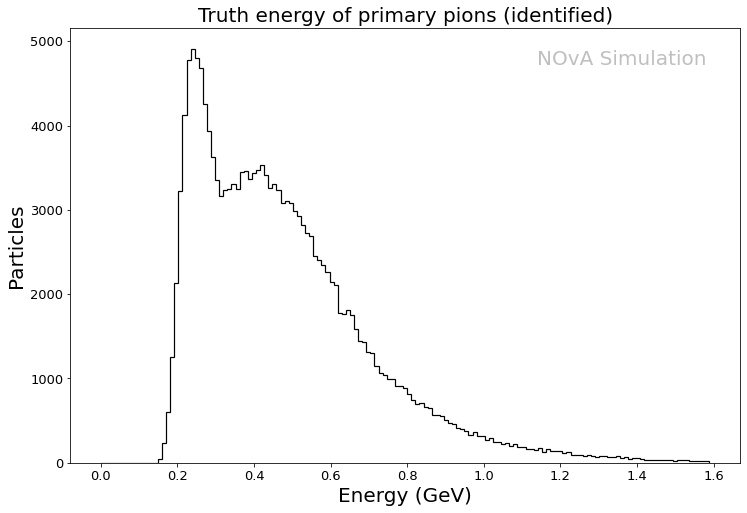

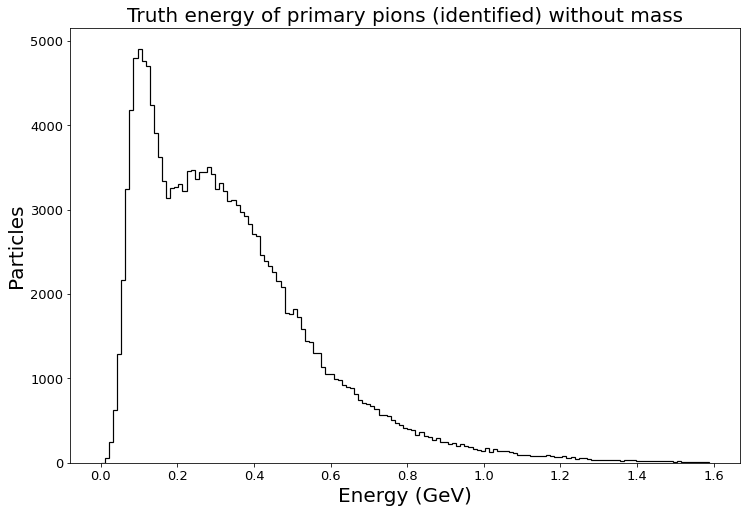

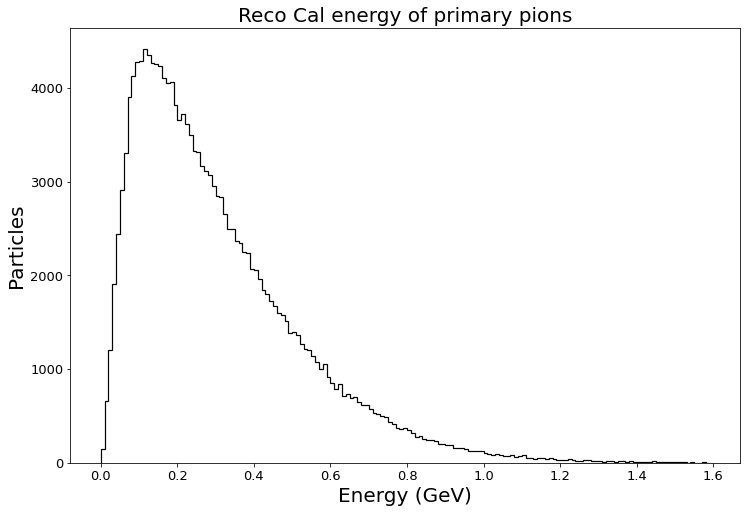

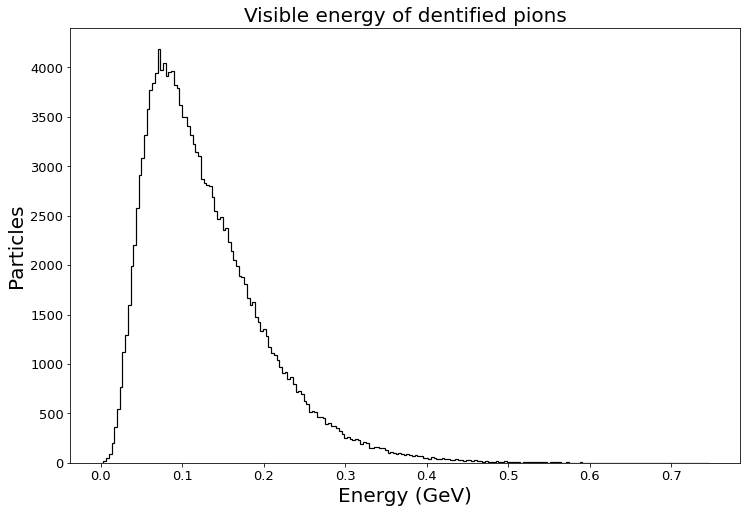

In [8]:
#TRUTH ENERGY OF PRIM PIONS

#bin_edges=autobins(epiNT,0,1.6)
plt.figure(figsize=(12,8)) 
plt.hist(epiNT, bins=autobins(epiNT,0,1.6), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title(f'Truth energy of primary pions (identified)', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)

# Add NOvA Simulation text inside the plot square
plt.text(0.95, 0.95, 'NOvA Simulation', fontsize=20, color='gray', alpha=0.5, ha='right', va='top', transform=plt.gca().transAxes)


#plt.yscale('log')
#plt.savefig(f"{folder}/analysisfiles/images/energyNT_part1.png")
plt.show()


#Truth energy of pions without the mass
plt.figure(figsize=(12,8)) 
plt.hist(epiNTshift, bins=autobins(epiNTshift,0,1.6), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title(f'Truth energy of primary pions (identified) without mass', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
#plt.yscale('log')
plt.savefig(f"{folder}/analysisfiles/images/energyNT_shifted_part1.png")
plt.show()

#Reco energy

plt.figure(figsize=(12,8)) 
plt.hist(epiReco, bins=autobins(epiReco,0,1.6), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title(f'Reco Cal energy of primary pions', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
#plt.yscale('log')
plt.savefig(f"{folder}/analysisfiles/images/energyRecoCal_part1.png")
plt.show()


#Visible energy
#bin_size = 0.025
#bin_edges = np.arange(0, 0.75, bin_size) 
plt.figure(figsize=(12,8)) 
plt.hist(vise, bins=autobins(vise,0,0.75), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title(f'Visible energy of dentified pions', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
#plt.yscale('log')
plt.savefig(f"{folder}/analysisfiles/images/visenergy_part1.png")
plt.show()

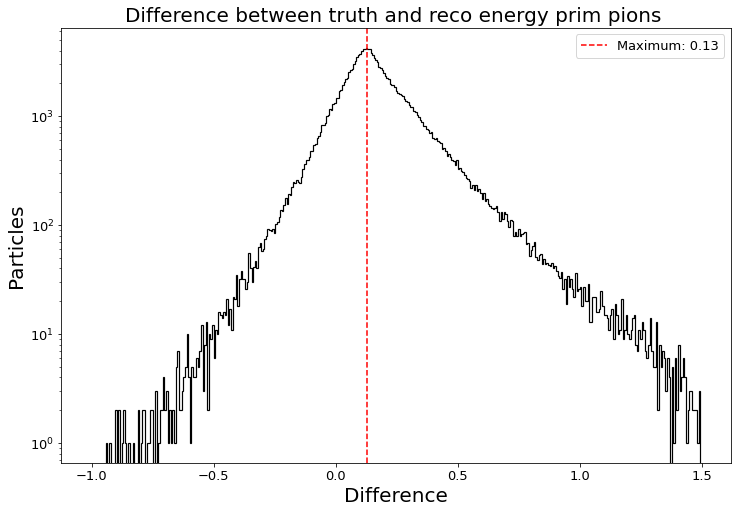

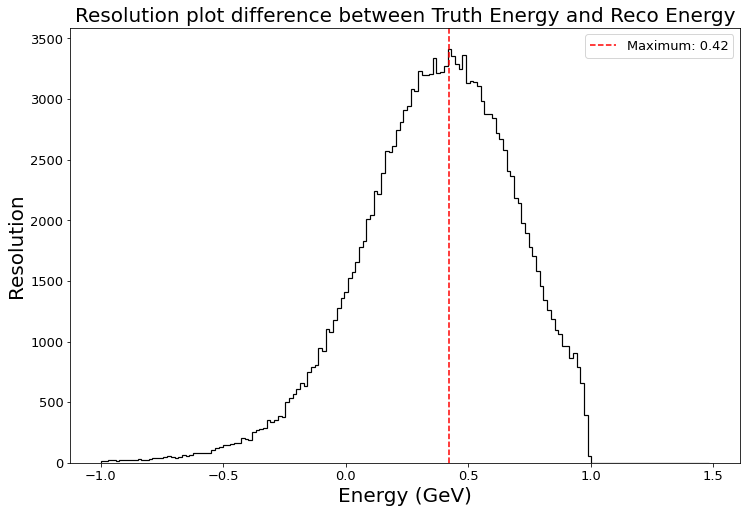

In [102]:
#DIFFERENCE BETWEEN NT AND RECO ENERGY AND RESOLUTION PLOT

epiNT_minus_epiReco_Resolution = []

for i in range(min(len(epiNT), len(epiReco))):
    epiNT_minus_epiReco_Resolution.append((epiNT[i] - epiReco[i])/epiNT[i])

#bin_edges = np.arange(-2, 2, bin_size) 
bin_edges=autobins(diffE,-1,1.5)
plt.figure(figsize=(12,8)) 
hist, bins, _ = plt.hist(diffE, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Difference', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title(f'Difference between truth and reco energy prim pions ', fontsize=20)
plt.yscale('log')


# Find the maximum value and corresponding bin center
max_count = np.max(hist)
max_index = np.argmax(hist)
max_bin_center = (bin_edges[max_index] + bin_edges[max_index + 1]) / 2

# Plot a vertical line at the maximum value
plt.axvline(x=max_bin_center, color='red', linestyle='--', label=f'Maximum: {max_bin_center:.2f}')
plt.legend(fontsize=13)

plt.savefig(f"{folder}/analysisfiles/images/difE_NT_Reco_MAX_part1.png")
plt.show()


# Define histogram parameters
#bin_edges = np.arange(-2, 2, bin_size) 
bin_edges=autobins(epiNT_minus_epiReco_Resolution,-1,1.5)
# Plot histogram
plt.figure(figsize=(12,8)) 
hist, bins, _ = plt.hist(epiNT_minus_epiReco_Resolution, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Resolution', fontsize=20)
plt.title('Resolution plot difference between Truth Energy and Reco Energy', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)

# Find the maximum value and corresponding bin center
max_count = np.max(hist)
max_index = np.argmax(hist)
max_bin_center = (bin_edges[max_index] + bin_edges[max_index + 1]) / 2

# Plot a vertical line at the maximum value
plt.axvline(x=max_bin_center, color='red', linestyle='--', label=f'Maximum: {max_bin_center:.2f}')
plt.legend(fontsize=13)

# Save and show plot
plt.savefig(f"{folder}/analysisfiles/images/epiNT_minus_epiReco_Resolution_MAX_part1.png")
plt.show()

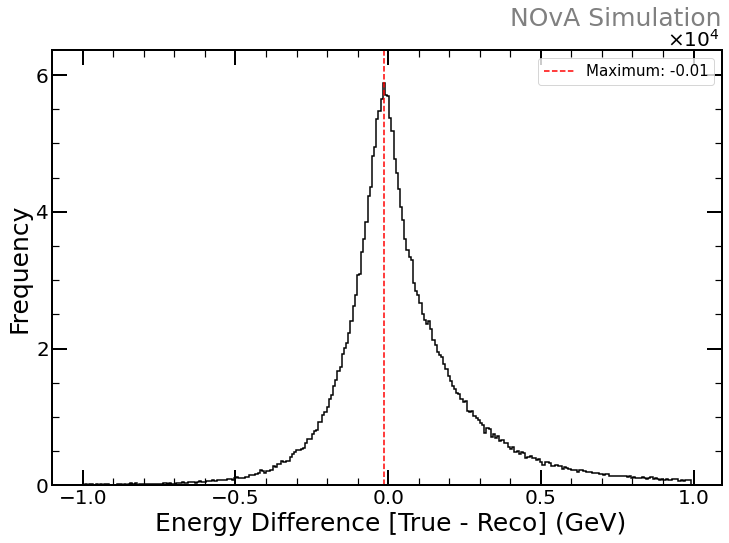

In [7]:
#DIFFERENCE BETWEEN NT AND RECO ENERGY WITHOUT MASS AND RESOLUTION PLOT

epiNTshift_minus_epiReco_Resolution = []

for i in range(min(len(epiNT), len(epiReco))):
    epiNTshift_minus_epiReco_Resolution.append((epiNTshift[i] - epiReco[i])/epiNTshift[i])

#bin_edges = np.arange(-2, 2, bin_size) 
bin_edges=autobins(diffEshift,-1,1)
plt.figure(figsize=(12,8)) 
hist, bins, _ = plt.hist(diffEshift, bins=bin_edges, edgecolor='black', linewidth=1.5, histtype='step')
plt.xlabel(' Energy Difference [True - Reco] (GeV)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
# plt.title(f'Difference between True and Reco pion energy', fontsize=30)

#plt.yscale('log')

# Find the maximum value and corresponding bin center
max_count = np.max(hist)
max_index = np.argmax(hist)
max_bin_center = (bin_edges[max_index] + bin_edges[max_index + 1]) / 2

# Plot a vertical line at the maximum value
plt.axvline(x=max_bin_center, color='red', linestyle='--', label=f'Maximum: {max_bin_center:.2f}')
plt.legend(fontsize=15)
set_plot_style()
set_sn()

#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)
plt.locator_params(axis='x', nbins=6)

plt.savefig(f"{folder}/images/difEshift_NT_Reco_MAX_part1_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/difEshift_NT_Reco_MAX_part1_{folder}.png', bbox_inches='tight')
plt.show()




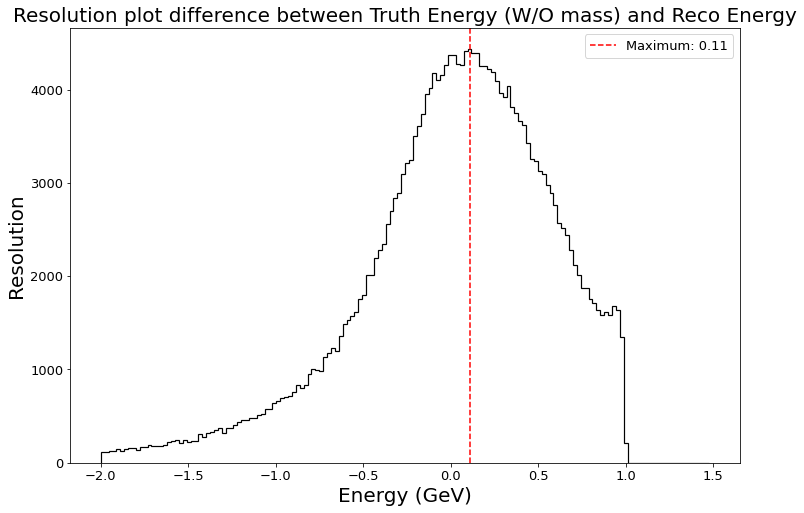

In [25]:
# Define histogram parameters
#bin_edges = np.arange(-2, 2, bin_size) 
bin_edges=autobins(epiNTshift_minus_epiReco_Resolution,-2,1.5)
# Plot histogram
plt.figure(figsize=(12,8)) 
hist, bins, _ = plt.hist(epiNTshift_minus_epiReco_Resolution, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Resolution', fontsize=20)
plt.title('Resolution plot difference between Truth Energy (W/O mass) and Reco Energy', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)

# Find the maximum value and corresponding bin center
max_count = np.max(hist)
max_index = np.argmax(hist)
max_bin_center = (bin_edges[max_index] + bin_edges[max_index + 1]) / 2

# Plot a vertical line at the maximum value
plt.axvline(x=max_bin_center, color='red', linestyle='--', label=f'Maximum: {max_bin_center:.2f}')
plt.legend(fontsize=13)

# Save and show plot
plt.savefig(f"{folder}/analysisfiles/images/epiNTshift_minus_epiReco_Resolution_MAX_part1.png")
plt.show()

+-------------+-------------+
| Parameter   |       Value |
+=============+=============+
| A           |  3.11715    |
+-------------+-------------+
| Mu          | -0.00666338 |
+-------------+-------------+
| Sigma       |  0.111895   |
+-------------+-------------+


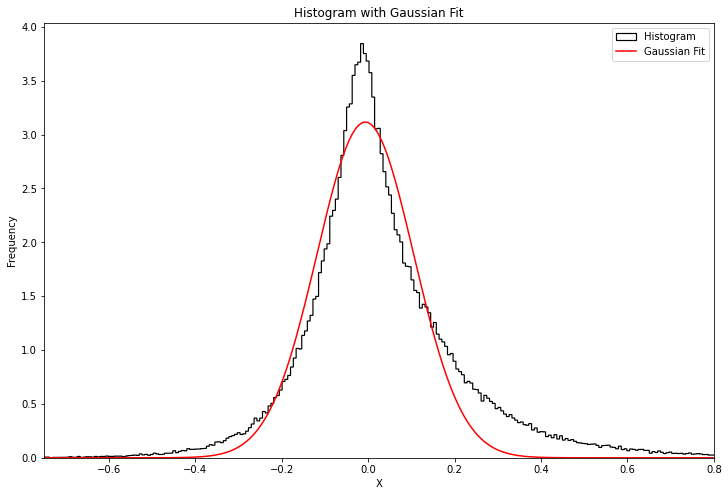

In [10]:
from scipy.optimize import curve_fit
from tabulate import tabulate

# Datos del histograma (por ejemplo)
hist, bin_edges = np.histogram(diffEshift, bins=autobins(diffEshift), density=True)

# Función gaussiana
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma)**2)

# Encontrar el bin con el valor máximo del histograma
max_bin_index = np.argmax(hist)
max_bin_center = 0.5 * (bin_edges[max_bin_index] + bin_edges[max_bin_index + 1])

# Calcular la mitad del valor máximo
half_max = hist[max_bin_index] / 2

# Encontrar los bins donde el valor del histograma cae a la mitad del máximo
left_index = np.where(hist[:max_bin_index] < half_max)[0][-1]
right_index = np.where(hist[max_bin_index:] < half_max)[0][0] + max_bin_index

# Calcular la FWHM
fwhm = bin_edges[right_index] - bin_edges[left_index]

# Definir los límites para el ajuste gaussiano
fit_range = (bin_edges[left_index], bin_edges[right_index])

# Ajustar la función gaussiana
popt, pcov = curve_fit(gaussian, bin_edges[:-1], hist, p0=[np.max(hist), max_bin_center, fwhm/2], bounds=([0, -np.inf, 0], [np.inf, np.inf, np.inf]), method='trf')

# Preparar la tabla con los resultados del ajuste
fit_results = [
    ['Parameter', 'Value'],
    ['A', popt[0]],
    ['Mu', popt[1]],
    ['Sigma', popt[2]],
]

# Presentar la tabla
print(tabulate(fit_results, headers='firstrow', tablefmt='grid'))

# Plot del histograma y el ajuste gaussiano
plt.figure(figsize=(12,8)) 

# Plot del histograma
plt.hist(diffEshift, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step', density=True, label='Histogram')

# Plot del ajuste gaussiano
x_fit = np.linspace(bin_edges[0], bin_edges[-1], 1000)
plt.plot(x_fit, gaussian(x_fit, *popt), color='red', label='Gaussian Fit')

plt.xlabel('X')
plt.ylabel('Frequency')
plt.title('Histogram with Gaussian Fit')
plt.legend(fontsize=13)
plt.xlim(-0.75,0.8)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/Diff_Energy_gaussian_FWHM_fit.png")
plt.show()


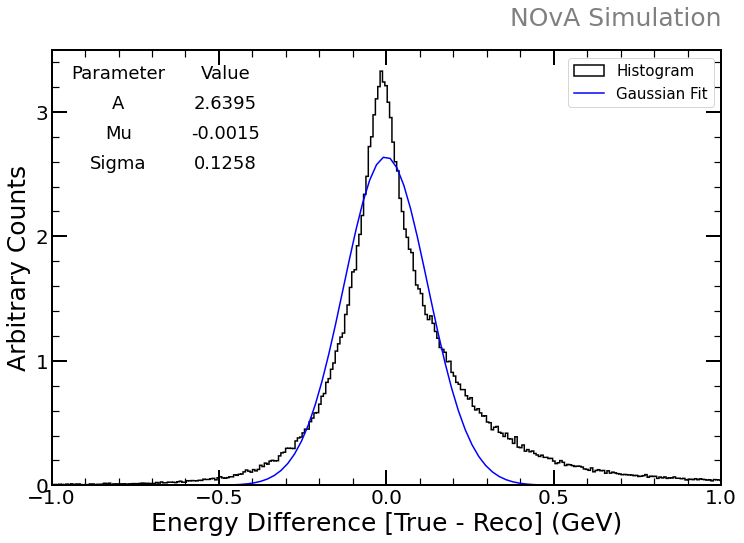

In [8]:
from scipy.optimize import curve_fit
from tabulate import tabulate

# Histogram data (for example)
hist, bin_edges = np.histogram(diffEshift, bins=autobins(diffEshift), density=True)

# Gaussian function
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma)**2)

# Find the bin with the maximum value of the histogram
max_bin_index = np.argmax(hist)
max_bin_center = 0.5 * (bin_edges[max_bin_index] + bin_edges[max_bin_index + 1])

# Calculate half of the maximum value
half_max = hist[max_bin_index] / 2

# Find the bins where the histogram value falls to half of the maximum
left_index = np.where(hist[:max_bin_index] < half_max)[0][-1]
right_index = np.where(hist[max_bin_index:] < half_max)[0][0] + max_bin_index

# Calculate the FWHM
fwhm = bin_edges[right_index] - bin_edges[left_index]

# Define the limits for Gaussian fitting
fit_range = (bin_edges[left_index], bin_edges[right_index])

# Fit the Gaussian function
popt, pcov = curve_fit(gaussian, bin_edges[:-1], hist, p0=[np.max(hist), max_bin_center, fwhm/2], bounds=([0, -np.inf, 0], [np.inf, np.inf, np.inf]), method='trf')

# Prepare the table with the fitting results
fit_results = [
    ['Parameter', 'Value'],
    ['A', f'{popt[0]:.4f}'],
    ['Mu', f'{popt[1]:.4f}'],
    ['Sigma', f'{popt[2]:.4f}'],
]

# Plot the histogram and the Gaussian fit
plt.figure(figsize=(12,8)) 

# Plot the histogram
plt.hist(diffEshift, bins=bin_edges, edgecolor='black', linewidth=1.5, histtype='step', density=True, label='Histogram')

# Plot the Gaussian fit
x_fit = np.linspace(bin_edges[0], bin_edges[-1], 1000)
plt.plot(x_fit, gaussian(x_fit, *popt), color='blue', label='Gaussian Fit', linewidth=1.5)

# Present the table within the plot, with reduced padding and moved to the middle-right section
table = plt.table(cellText=fit_results, loc='upper left', edges='open', colWidths=[0.4, 0.4])
table.auto_set_font_size(False)
table.set_fontsize(18)
table.scale(0.4, 2.5)

# Justify the content within the table cells
for i in range(len(fit_results)):
    for j in range(len(fit_results[0])):
        table[(i, j)].get_text().set_ha('center')  # horizontal alignment
        table[(i, j)].get_text().set_va('center')  # vertical alignment

# Set grid to the table
for _, cell in table._cells.items():
    cell.set_linewidth(0.05)
    cell.set_edgecolor('black')

plt.xlabel('Energy Difference [True - Reco] (GeV)', fontsize=25)
plt.ylabel('Arbitrary Counts', fontsize=25)
#plt.title('Gaussian fit (FWHM) ', fontsize=30)
plt.legend(fontsize=15)
plt.xlim(-1,1)

set_plot_style()

#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)
plt.locator_params(axis='x', nbins=6)




plt.savefig(f"{folder}/images/Diff_Energy_gaussian_FWHM_fit_with_table_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/Diff_Energy_gaussian_FWHM_fit_with_table_{folder}.png', bbox_inches='tight')
plt.show()


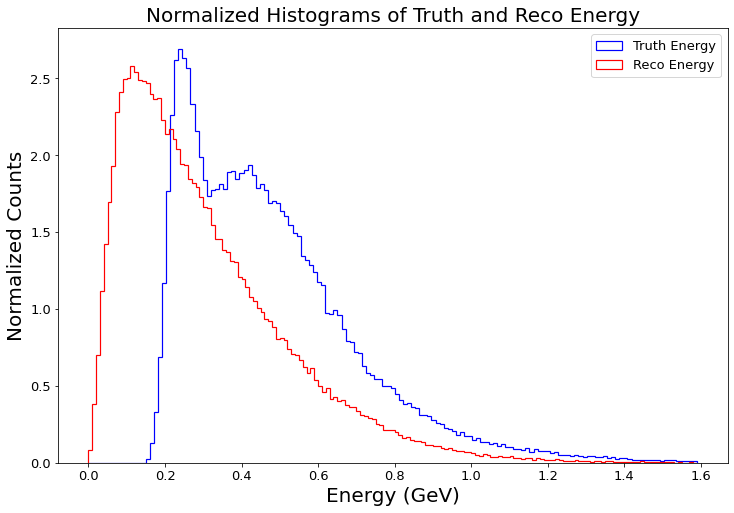

In [104]:
#COMPARISON NT AND RECO ENERGY

# Define histogram parameters
#bin_size = 0.025
#bin_edges = np.arange(0, 1.6, bin_size) 

# Calculate histograms
hist_nt, _ = np.histogram(epiNT, bins=autobins(epiNT,0,1.6), density=True)
hist_reco, _ = np.histogram(epiReco, bins=autobins(epiReco,0,1.6), density=True)

# Plot both normalized histograms on the same plot
plt.figure(figsize=(12,8)) 

# Plot truth energy histogram
plt.hist(epiNT, bins=autobins(epiNT,0,1.6), edgecolor='blue', linewidth=1.2, histtype='step', label='Truth Energy', density=True)

# Plot reco energy histogram
plt.hist(epiReco, bins=autobins(epiReco,0,1.6), edgecolor='red', linewidth=1.2, histtype='step', label='Reco Energy', density=True)

plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Normalized Counts', fontsize=20)
plt.title('Normalized Histograms of Truth and Reco Energy', fontsize=20)
plt.legend(fontsize=13)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/energy_comparison_histogram_part1.png")
plt.show()

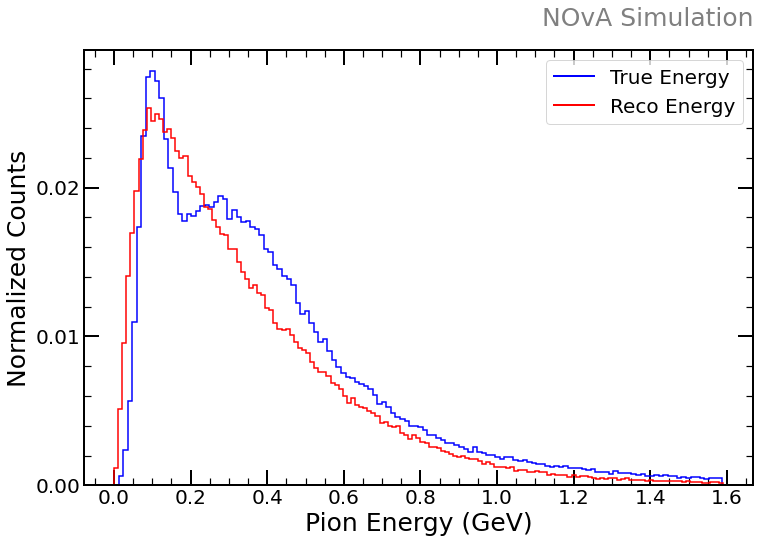

In [9]:
#COMPARISON NT AND RECO ENERGY WITHOUT MASS
# Define histogram parameters
#bin_size = 0.025
#bin_edges = np.arange(0, 1.6, bin_size) 

#normalize
weights = np.ones_like(epiNTshift) / len(epiNTshift)
weights2 = np.ones_like(epiReco) / len(epiReco)
# Calculate histograms
# hist_nt, _ = np.histogram(epiNTshift, bins=autobins(epiNTshift,0,1.6), density=True)
# hist_reco, _ = np.histogram(epiReco, bins=autobins(epiReco,0,1.6), density=True)

# Plot both normalized histograms on the same plot
plt.figure(figsize=(12,8)) 

# Plot truth energy histogram
plt.hist(epiNTshift, bins=autobins(epiNTshift,0,1.6), edgecolor='blue', linewidth=1.5, histtype='step', label='True Energy', weights=weights)

# Plot reco energy histogram
plt.hist(epiReco, bins=autobins(epiReco,0,1.6), edgecolor='red', linewidth=1.5, histtype='step', label='Reco Energy', weights=weights2)

plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel('Normalized Counts', fontsize=25)
#plt.title('Comparison between True and Reco pion energy', fontsize=30)
plt.legend(fontsize=20)

set_plot_style(['True Energy', 'Reco Energy'])

#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)


plt.savefig(f"{folder}/images/energy_shifted_comparison_histogram_part1_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/energy_shifted_comparison_histogram_part1_{folder}.png', bbox_inches='tight')
plt.show()

In [50]:
epi_1=[]
for elements in epiNTshift:
    if elements < 0.180:
        epi_1.append(elements)

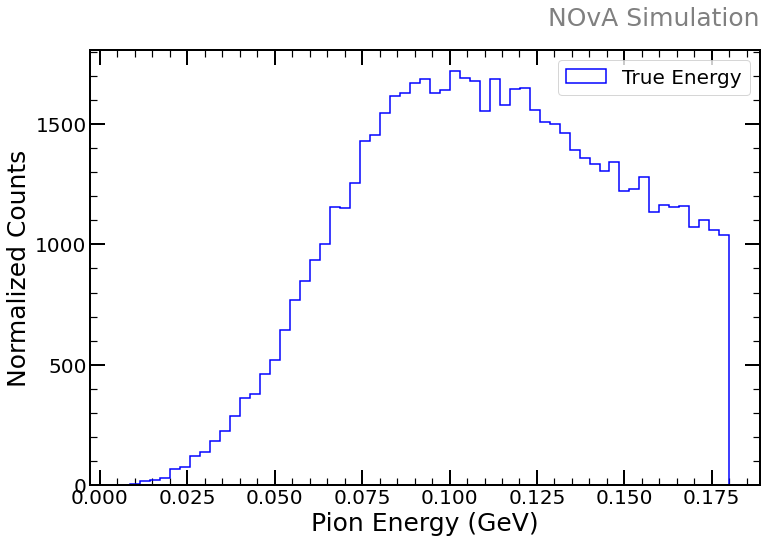

In [52]:
#COMPARISON NT AND RECO ENERGY WITHOUT MASS
# Define histogram parameters
#bin_size = 0.025
#bin_edges = np.arange(0, 1.6, bin_size) 

#normalize
# weights = np.ones_like(epi_1) / len(epi_1)
# Calculate histograms
# hist_nt, _ = np.histogram(epiNTshift, bins=autobins(epiNTshift,0,1.6), density=True)
# hist_reco, _ = np.histogram(epiReco, bins=autobins(epiReco,0,1.6), density=True)

# Plot both normalized histograms on the same plot
plt.figure(figsize=(12,8)) 

# Plot truth energy histogram
plt.hist(epi_1, bins=autobins(epi_1,0,1.6), edgecolor='blue', linewidth=1.5, histtype='step', label='True Energy')

plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel('Normalized Counts', fontsize=25)
#plt.title('Comparison between True and Reco pion energy', fontsize=30)
plt.legend(fontsize=20)

set_plot_style()

#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)


# plt.savefig(f"{folder}/images/energy_shifted_comparison_histogram_part1_{folder}.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/energy_shifted_comparison_histogram_part1_{folder}.png', bbox_inches='tight')
plt.show()

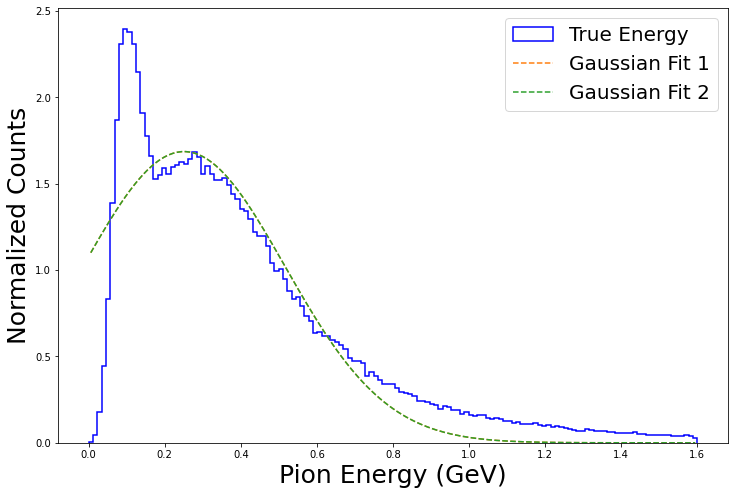

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming epiNTshift contains your data
data = epiNTshift

# Define a function for a Gaussian (normal) distribution
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-((x - mean) / stddev)**2 / 2)

# Automatically determine bins using numpy's histogram function
hist, bins = np.histogram(data, bins='auto', range=(0, 1.6), density=True)

# Find bin centers
bin_centers = (bins[:-1] + bins[1:]) / 2

# Initial guesses for Gaussian parameters
initial_guess1 = [1.0, 0.5, 0.1]  # Amplitude, mean, stddev for peak 1
initial_guess2 = [1.0, 1.0, 0.1]  # Amplitude, mean, stddev for peak 2

# Fit the first Gaussian
params1, covariance1 = curve_fit(gaussian, bin_centers, hist, p0=initial_guess1)

# Fit the second Gaussian
params2, covariance2 = curve_fit(gaussian, bin_centers, hist, p0=initial_guess2)

# Plotting the histogram
plt.figure(figsize=(12, 8))
plt.hist(data, bins=bins, edgecolor='blue', linewidth=1.5, histtype='step', label='True Energy', density=True)

# Plot the fitted Gaussians
plt.plot(bin_centers, gaussian(bin_centers, *params1), label='Gaussian Fit 1', linestyle='--')
plt.plot(bin_centers, gaussian(bin_centers, *params2), label='Gaussian Fit 2', linestyle='--')

plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel('Normalized Counts', fontsize=25)
plt.legend(fontsize=20)

plt.show()


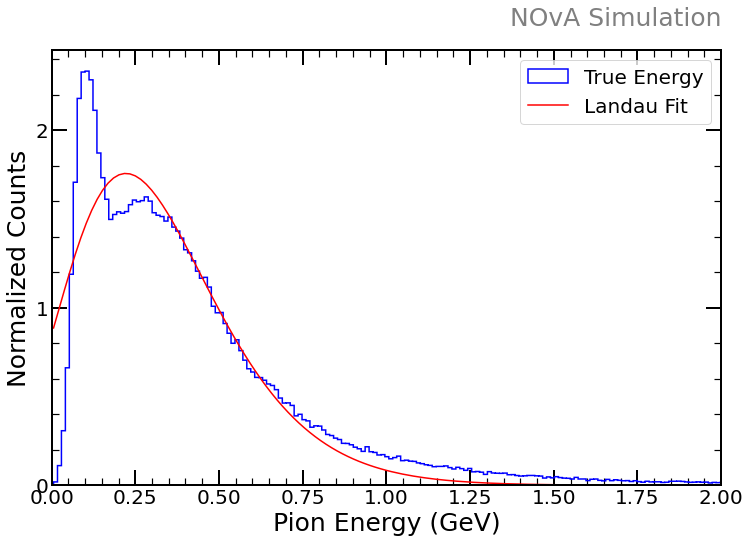

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the Landau PDF using an approximation
def landau_pdf(x, mpv, eta):
    # coefficients
    c1 = 0.22278298
    c2 = 0.00668818
    c3 = 0.00317816
    c4 = 0.04168902
    c5 = 0.03044837

    # shifted x
    x_shifted = (x - mpv) / eta

    # constants
    exp_val = np.exp(-0.5 * x_shifted - c1 * np.exp(-x_shifted))
    poly_val = 1 + c2 * x_shifted + c3 * x_shifted ** 2 + c4 * x_shifted ** 3 + c5 * x_shifted ** 4
    return exp_val * poly_val / eta

# Generate histogram data
counts, bin_edges = np.histogram(epiNTshift, bins=autobins(epiNTshift, 0, 1.6), density=True)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Initial guess for the parameters [mpv, eta, amplitude]
initial_guess = [np.mean(epiNTshift), np.std(epiNTshift), np.max(counts)]

# Define the fitting function
def landau_fit(x, mpv, eta, A):
    return A * landau_pdf(x, mpv, eta)

# Fit the Landau distribution to the histogram data
popt, _ = curve_fit(landau_fit, bin_centers, counts, p0=initial_guess)

# Plotting
plt.figure(figsize=(12, 8)) 

# Plot truth energy histogram
plt.hist(epiNTshift, bins=autobins(epiNTshift, 0, 1.6), edgecolor='blue', linewidth=1.5, histtype='step', label='True Energy', density=True)

# Plot the Landau fit
x_fit = np.linspace(bin_edges[0], bin_edges[-1], 1000)
y_fit = landau_fit(x_fit, *popt)
plt.plot(x_fit, y_fit, 'r-', label='Landau Fit')

plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel('Normalized Counts', fontsize=25)
plt.legend(fontsize=20)
plt.xlim(0,2)

set_plot_style()

# Change the number of ticks on the y-axis
plt.locator_params(axis='y', nbins=4)

plt.show()



C:\Users\maldi\AppData\Local\Temp\ipykernel_5204\3206423804.py:11: DeprecationWarning: scipy.log is deprecated and will be removed in SciPy 2.0.0, use numpy.lib.scimath.log instead
  if x > mpv * log(10.):


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

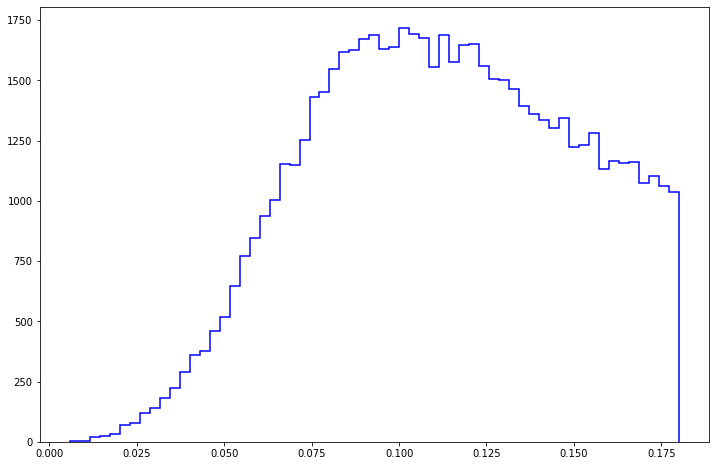

In [51]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# Define the Landau distribution function
def landau(x, mpv, eta):
    from scipy import exp
    from scipy import sqrt
    from scipy import log
    a = (mpv - x*eta)
    if x > mpv * log(10.):
        return 0.0
    u = log(x/mpv)
    return exp(-u - exp(-u))

# Generate some sample data (replace this with your actual data)
# epi_1 = np.random.normal(loc=0.5, scale=0.2, size=1000)

# Function to calculate bins automatically
def autobins(data, xmin, xmax):
    bins = np.histogram_bin_edges(data, bins='auto')
    return bins

# Plotting the histogram
plt.figure(figsize=(12, 8))

# Plot truth energy histogram
counts, bins, _ = plt.hist(epi_1, bins=autobins(epi_1, 0, 1.6), edgecolor='blue', linewidth=1.5, histtype='step', label='True Energy')

# Perform the Landau fit
bin_centers = (bins[:-1] + bins[1:]) / 2
popt, _ = curve_fit(landau, bin_centers, counts, p0=[0.5, 1])

# Plot the fitted Landau curve
plt.plot(bin_centers, landau(bin_centers, *popt), color='red', linewidth=2, label='Landau Fit')

plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel('Normalized Counts', fontsize=25)
plt.legend(fontsize=20)
plt.locator_params(axis='y', nbins=4)

plt.show()



In [88]:
folder='DIS'

In [89]:
#EXTRACTING THE PION ENERGY FOR THE EVENTS WITH DETECTED PIONS
start_time = time.time()

#NT energies
temp=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part1')

epis = [[] for _ in range(4)]
#store the energy of the pions depending on how much there are in the event
for event in temp:
    l = len(event)
    if l < len(epis):
        sum=0
        for i in range(l):
            sum=sum+float(event[i])-0.139
        epis[l].append(sum)
    

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.30371785163879395 seconds


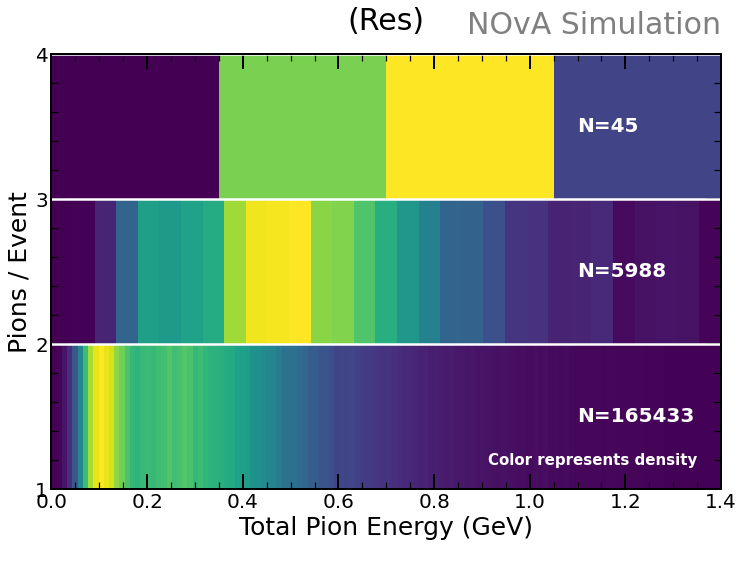

In [27]:
# Define x bins
#x_bins = np.linspace(0, 1.5, 100)

xstart=0
xend=1.4

bbins = []

for i in range(len(epis)):
    if i==0:
        bbins.append(np.linspace(xstart, xend, 100))
    else:
        bbins.append(np.linspace(xstart, xend, numbins(epis[i],xstart, xend)))

# Define y values
y_values = [0.5, 1.5, 2.5,3.5]

# Define number of pions per event
num_pions_per_event = [len(epi) for epi in epis]

plt.figure(figsize=(12,8)) 

# Plot each histogram
for i, (epi, y_value, num_pions, bbin) in enumerate(zip(epis, y_values, num_pions_per_event, bbins), start=1):
    plt.hist2d(epi, np.zeros_like(epi)+y_value, bins=[bbin, 1], cmap='viridis')
    plt.text(1.1, y_value, f'N={(i-1)*num_pions}', color='white', fontsize=20, ha='left', va='center', fontweight='bold')


#plt.colorbar(label='Frequency')
plt.xlabel('Total Pion Energy (GeV)', fontsize=25)
plt.ylabel('Pions / Event',fontsize=25)
set_plot_style()
#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=3)
plt.axhline(y=2, color='white', linewidth=2.5)
plt.axhline(y=3, color='white', linewidth=2.5)
plt.axhline(y=4, color='white', linewidth=2.5)
plt.ylim(1, 4)
plt.title(f'({folder})',y=1.042, fontsize=30)
plt.text(1.35, 1.2, 'Color represents density', color='white', fontsize=15, ha='right', va='center',fontweight='bold')
plt.savefig(f"{folder}/analysisfiles/images/hetamapTotalEnergy_RecoPions_part1_with_ntE_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/hetamapTotalEnergy_RecoPions_part1_with_ntE_{folder}.png', bbox_inches='tight')
plt.show()

In [90]:
#filling all the lists with equal number of data to normalize it.
elements=[]
for i, lists in enumerate(epis):
    elements.append(len(epis[i]))
    
import random
maxim=len(epis[1])
for i, lists in enumerate(epis):
    if len(lists) != 0:
        if len(lists) < maxim:
            n = maxim - len(lists)
            for _ in range(n):
                epis[i].append(random.uniform(3.7, 5))

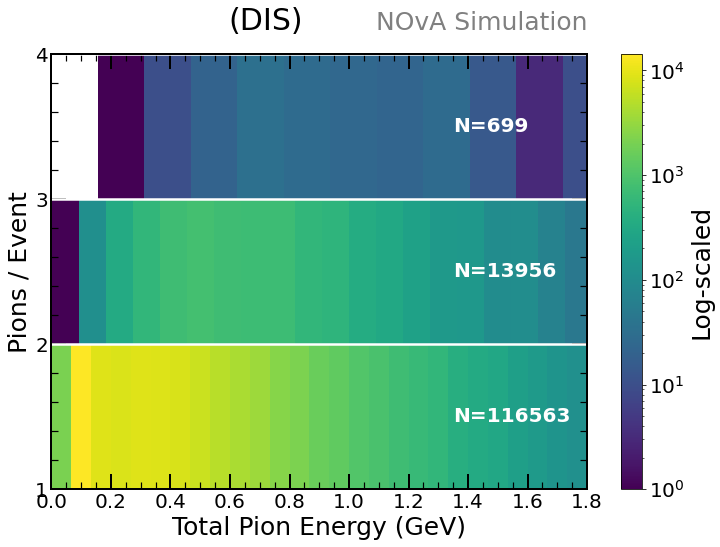

In [94]:
#heatmap with normalization global
# Define x bins
#x_bins = np.linspace(0, 1.5, 100)
from matplotlib.colors import LogNorm
xstart=0
xend=5

bbins = []

bbins.append(np.linspace(xstart, xend, 100))
bbins.append(np.linspace(xstart, xend, numbins(epis[1],0, 1.6)))
bbins.append(np.linspace(xstart, xend, numbins(epis[2],0, 1.6)))
bbins.append(np.linspace(xstart, xend, numbins(epis[3],0, 0.9)))
# bbins.append(np.linspace(xstart, xend, numbins(epis[4],0, 0.1)))
# print(len(bbins[1]))
# print(lens[1])
# print(len(bbins[2]))
# print(lens[2])
# print(len(bbins[3]))
# print(lens[3])
# print(len(bbins[4]))
# print(lens[4])
# for i in range(len(episnt)):
#     if i==0:
#         bbins.append(np.linspace(xstart, xend, 100))
#     else:
#         bbins.append(np.linspace(xstart, xend, numbins(episnt[i],0, 1.6)))

# Define y values
y_values = [0.5, 1.5, 2.5,3.5,4.5]

# Define number of pions per event
num_pions_per_event = [len(epi) for epi in epis]

plt.figure(figsize=(12,8)) 

# Plot each histogram
for i, (epi, y_value, num_pions, bbin) in enumerate(zip(epis, y_values, num_pions_per_event, bbins), start=1):
    plt.hist2d(epi, np.zeros_like(epi)+y_value, bins=[bbin, 1], cmap='viridis',norm=LogNorm())
#     if i > 1:
#         cbar = plt.colorbar()
    if i!=1:
        plt.text(1.35, y_value, f'N={(elements[i-1])*(i-1)}', color='white', fontsize=20, ha='left', va='center', fontweight='bold')

#         plt.text(1.35, y_value, f'N={lens[i-1]}', color='white', fontsize=20, ha='left', va='center', fontweight='bold')

colorbar= plt.colorbar(label='Log-scaled')
colorbar.ax.yaxis.label.set_fontsize(25) 
colorbar.ax.tick_params(labelsize=20)
# Add NOνA Simulation text inside the plot square at the title position
#plt.text(1.0, 1.05, 'NOvA Simulation', fontsize=30, color='gray', ha='right', va='top', transform=plt.gca().transAxes)

#change the number of ticks in the y axis

#plt.tick_params(axis='both', which='major', length=20, width=1.5, direction='in')
set_plot_style()
plt.locator_params(axis='y', nbins=4)
#plt.colorbar(label='Frequency')
plt.xlabel('Total Pion Energy (GeV)', fontsize=25)
plt.ylabel('Pions / Event',fontsize=25)
plt.ylim(1, 4)
plt.xlim(0,1.8)
# plt.title(f'Reconstructed',x=0.3, y=1.03,fontsize=30)
# plt.title(f'ND',x=0.4, y=1.03,fontsize=30)
plt.xticks(fontsize=20) 
plt.yticks(fontsize=20)
plt.axhline(y=2, color='white', linewidth=2.5)
plt.axhline(y=3, color='white', linewidth=2.5)
plt.axhline(y=4, color='white', linewidth=2.5)
plt.title(f'({folder})',x=0.4,y=1.042,fontsize=30)
# Add the image
# image_path = 'novastyle.png'  # Specify the path to your image file
# plt.figimage(plt.imread(image_path), 350, 515, alpha=1)
# plt.text(1.35, 1.2, 'Color represents density', color='white', fontsize=15, ha='right', va='center',fontweight='bold')
plt.savefig(f"{folder}/analysisfiles/images/hetamapTotalEnergy_RecoPions_part1_with_ntE_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/hetamapTotalEnergy_RecoPions_part1_with_ntE_{folder}.png', bbox_inches='tight')

plt.show()

In [66]:
folder='Res'

In [67]:
#EXTRACTING THE NEUTRINO ENERGY FOR THE EVENTS WITH DETECTED PIONS
#Here Im looking that the same amount of nt events are in reco events to avoid counting unidentified pions.

start_time = time.time()


#save all the neutrino energies
temp=[]
nue_d=[]
temp=read_file(folder, 'analysisfiles/nue_part1')
nue_d = [float(element) for sublist in temp for element in sublist]   

#then store the list of NT original numpi
temp=[]
numpiNT=[]
temp=read_file(folder, 'analysisfiles/numpiNT_part1')
numpiNT = [int(element) for sublist in temp for element in sublist] 

#then store the list of Reco numpi
temp=[]
numpiReco=[]
temp=read_file(folder, 'analysisfiles/numpiReco_part1')
numpiReco = [int(element) for sublist in temp for element in sublist] 
    
    
#then I'll save 2 lists, one with only the info of the 1to1 pions and other with same numpi in NT and Reco

j=0
nue_d_1pion = []
for event in nue_d:
    if numpiNT[j] == 1 and numpiReco[j] == 1:
        nue_d_1pion.append(event)
    j = j+1
    
    
#save the info of the nu energies per number of pion in event   
nues = [[] for _ in range(4)]
j=0
nue_d_pi2pi = []
for i, event in enumerate(nue_d):
    if numpiNT[i] < len(nues):
        if numpiNT[i] == numpiReco[i]:
            #append in the all pi2pi list
            nue_d_pi2pi.append(event)
            #then append in the separate numpi list for the heatmap
            #this list is keeping only the cases where all neutrinos are reconstructed. 
            nues[numpiReco[i]].append(event)

%store nue_d_1pion
%store nue_d_pi2pi

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Stored 'nue_d_1pion' (list)
Stored 'nue_d_pi2pi' (list)
Elapsed time: 0.9266848564147949 seconds


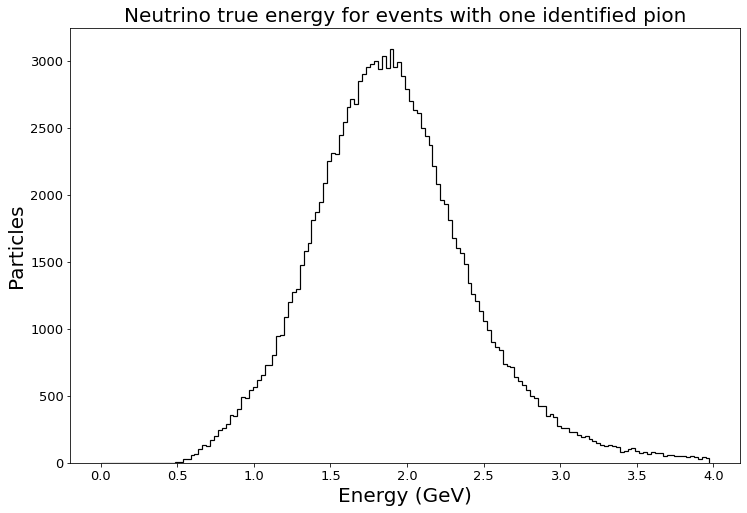

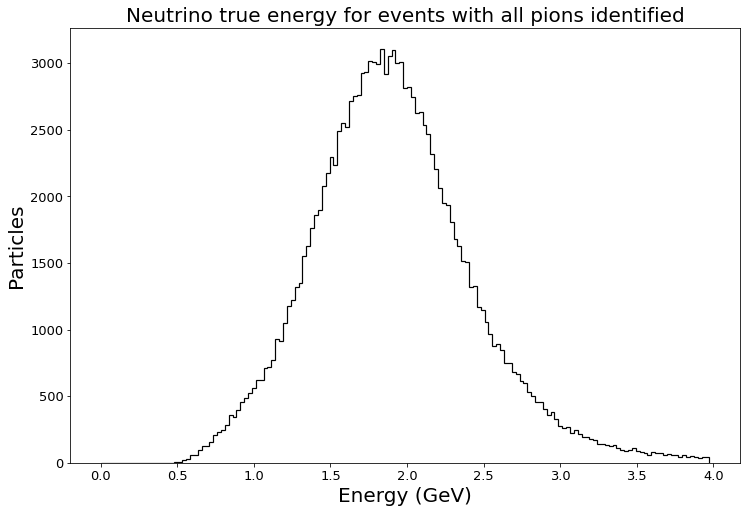

In [79]:
#TRUTH ENERGY OF PRIM PIONS
#bin_size = 0.025
#bin_edges = np.arange(0, 4, bin_size) 

plt.figure(figsize=(12,8)) 
plt.hist(nue_d_1pion, bins=autobins(nue_d_1pion,0,4), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title(f'Neutrino true energy for events with one identified pion', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
#plt.yscale('log')
plt.savefig(f"{folder}/analysisfiles/images/nue_1pion_pi2pi_part1.png")
plt.show()

plt.figure(figsize=(12,8)) 
plt.hist(nue_d_pi2pi, bins=autobins(nue_d_pi2pi,0,4), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Energy (GeV)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title(f'Neutrino true energy for events with all pions identified', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
#plt.yscale('log')
plt.savefig(f"{folder}/analysisfiles/images/nue_All_pi2pi_part1.png")
plt.show()

In [68]:
#filling all the lists with equal number of data to normalize it.
elements=[]
for i, lists in enumerate(nues):
    elements.append(len(nues[i]))
    
import random
maxim=len(nues[1])
for i, lists in enumerate(nues):
    if len(lists) != 0:
        if len(lists) < maxim:
            n = maxim - len(lists)
            for _ in range(n):
                nues[i].append(random.uniform(3.7, 5))

In [45]:
print(elements)

[0, 66264, 3493, 111]


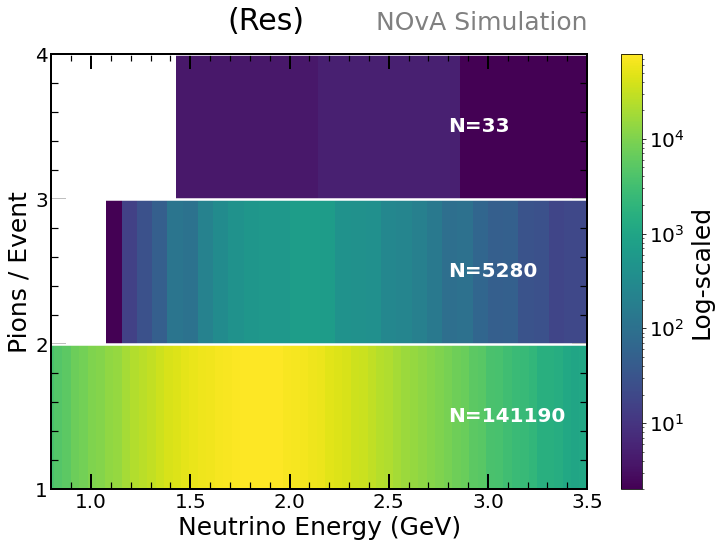

In [70]:
#heatmap with normalization
from matplotlib.colors import LogNorm
xstart=0
xend=5

bbins = []

bbins.append(np.linspace(xstart, xend, 100))
bbins.append(np.linspace(xstart, xend, numbins(nues[1],0, 3)))
bbins.append(np.linspace(xstart, xend, numbins(nues[2],0, 1.7)))
bbins.append(np.linspace(xstart, xend, numbins(nues[3],0, 0.2)))
# bbins.append(np.linspace(xstart, xend, numbins(nues[4],0, 1.5)))
# bbins.append(np.linspace(xstart, xend, numbins(nues[5],0, 0.5)))
# print(len(bbins[1]))
# print(lensR[1])
# print(len(bbins[2]))
# print(lensR[2])
# print(len(bbins[3]))
# print(lensR[3])
# print(len(bbins[4]))
# print(lensR[4])
# for i in range(len(episnt)):
#     if i==0:
#         bbins.append(np.linspace(xstart, xend, 100))
#     else:
#         bbins.append(np.linspace(xstart, xend, numbins(episnt[i],0, 1.6)))

# Define y values
y_values = [0.5, 1.5, 2.5, 3.5, 4.5]

# Define number of pions per event
num_pions_per_event = [len(nue) for nue in nues]

plt.figure(figsize=(12,8)) 

# Plot each histogram
for i, (nue, y_value, num_pions, bbin) in enumerate(zip(nues, y_values, num_pions_per_event, bbins), start=1):
    plt.hist2d(nue, np.zeros_like(nue)+y_value, bins=[bbin, 1], cmap='viridis',norm=LogNorm())
#     if i > 1:
#         cbar = plt.colorbar()
    if i!=1:
        plt.text(2.8, y_value, f'N={(elements[i-1])*(i-1)}', color='white', fontsize=20, ha='left', va='center', fontweight='bold')
#         plt.text(1.1, y_value, f'N={(i-1)*num_pions}', color='white', fontsize=20, ha='left', va='center', fontweight='bold')
#         plt.text(1.38, y_value, f'N={lensR[i-1]}', color='white', fontsize=20, ha='left', va='center', fontweight='bold')

colorbar= plt.colorbar(label='Log-scaled')
colorbar.ax.yaxis.label.set_fontsize(25) 
colorbar.ax.tick_params(labelsize=20)
# Add NOνA Simulation text inside the plot square at the title position
#plt.text(1.0, 1.05, 'NOvA Simulation', fontsize=30, color='gray', ha='right', va='top', transform=plt.gca().transAxes)

#change the number of ticks in the y axis

#plt.tick_params(axis='both', which='major', length=20, width=1.5, direction='in')
set_plot_style()
plt.locator_params(axis='y', nbins=4)

#plt.colorbar(label='Frequency')
plt.xlabel('Neutrino Energy (GeV)', fontsize=25)
plt.ylabel('Pions / Event',fontsize=25)
plt.title(f'({folder})',x=0.4,y=1.042,fontsize=30)
plt.ylim(1, 4)
plt.xlim(0.8,3.5)
# plt.title(f'ND',x=0.4, y=1.03,fontsize=30)
plt.xticks(fontsize=20) 
plt.yticks(fontsize=20)
plt.axhline(y=2, color='white', linewidth=2.5)
plt.axhline(y=3, color='white', linewidth=2.5)
plt.axhline(y=4, color='white', linewidth=2.5)
# Add the image
# image_path = 'novastyle.png'  # Specify the path to your image file
# plt.figimage(plt.imread(image_path), 345, 505, alpha=1)
plt.savefig(f"{folder}/analysisfiles/images/hetamapNeutrinoEnergy_fordetectedPions_part1.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/hetamapNeutrinoEnergy_fordetectedPions_part1_{folder}.png', bbox_inches='tight')

plt.show()

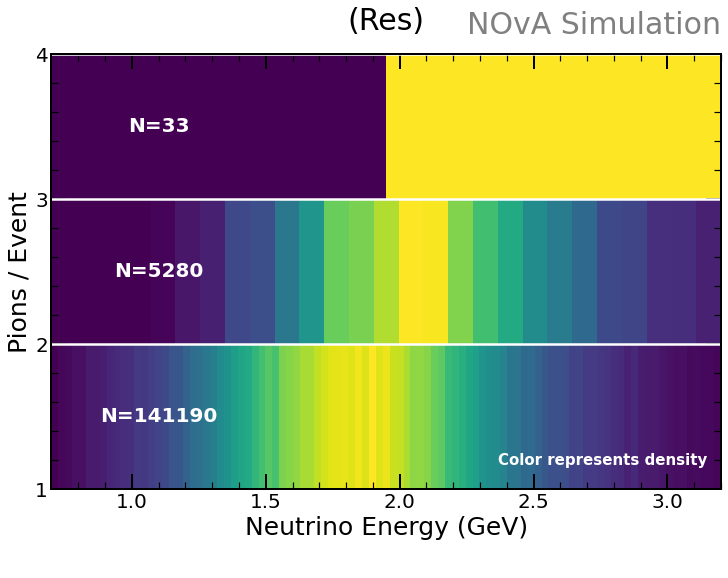

In [21]:
# Define x bins
#THIS GRAPH DOES NOT WORKL. IS NOT USEFUL AS IT IS.
#x_bins = np.linspace(0, 4, 100)
xstart=0.7
xend=3.2

bbins = []

for i in range(len(nues)):
    if i==0:
        bbins.append(np.linspace(xstart, xend, 100))
    else:
        bbins.append(np.linspace(xstart, xend, numbins(nues[i],xstart,xend)))

# Define y values
y_values = [0.5, 1.5, 2.5, 3.5]

# Define number of pions per event
num_pions_per_event = [len(nueh) for nueh in nues]

plt.figure(figsize=(12,8)) 

# Plot each histogram
for i, (nueh, y_value, num_pions, bbin) in enumerate(zip(nues, y_values, num_pions_per_event, bbins), start=1):
    plt.hist2d(nueh, np.zeros_like(nueh)+y_value, bins=[bbin, 1], cmap='viridis')
    plt.text(1.1, y_value, f'N={(i-1)*num_pions}', color='white', fontsize=20, ha='center', va='center', fontweight='bold')

set_plot_style()
#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=3)

#plt.colorbar(label='Frequency')
plt.xlabel('Neutrino Energy (GeV)',fontsize=25)
plt.ylabel('Pions / Event',fontsize=25)
plt.ylim(1, 4)
plt.axhline(y=2, color='white', linewidth=2.5)
plt.axhline(y=3, color='white', linewidth=2.5)
plt.axhline(y=4, color='white', linewidth=2.5)
plt.title(f'({folder})',y=1.042,fontsize=30)
plt.text(3.15, 1.2, 'Color represents density', color='white', fontsize=15, ha='right', va='center',fontweight='bold')
plt.savefig(f"{folder}/analysisfiles/images/hetamapNeutrinoEnergy_fordetectedPions_part1.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/hetamapNeutrinoEnergy_fordetectedPions_part1_{folder}.png', bbox_inches='tight')

plt.show()

In [18]:
folder='MEC'

In [15]:
#NOTE on the CM working.
#when the two lists are given to the matrix, the first list in the confussion_matrix fnuction represents the y axis.

#the function will take each entry in the second list, and plot the correpsondingvalue in the x axis and then
#will plot the analog (same position in the other list) value in the corresponding y axis. 

In [19]:
start_time = time.time()

#NOW LETS EXTRACT THE NUMPI INFO FOR THE CONFUSSION MATRIX

#store the list of NT original numpi
temp=[]
numpint=[]
temp=read_file(folder, 'analysisfiles/numpiNT_part1')
numpint = [int(element) for sublist in temp for element in sublist] 

#store the list of Reco numpi
temp=[]
numpiR=[]
temp=read_file(folder, 'analysisfiles/numpiReco_part1')
numpiR = [int(element) for sublist in temp for element in sublist] 
    
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.006379604339599609 seconds


In [12]:
import seaborn as sns
from sklearn.metrics import confusion_matrix


# Create the confusion matrix
confusion = confusion_matrix(numpiR, numpint)

# Filter out rows and columns for numbers 1, 2, and 3
relevant_indices = [0, 1, 2]
confusion_relevant = confusion[relevant_indices][:, relevant_indices]

# Calculate the global percentage for each entry
total_samples = np.sum(confusion_relevant)
confusion_percentage = confusion_relevant / total_samples * 100

# Plot the matrix with improved formatting
plt.figure(figsize=(10,8)) 

# Plot raw numbers
sns.heatmap(confusion_relevant, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["1", "2", "3"],
            yticklabels=["1", "2", "3"],
            annot_kws={"fontsize": 15})

# Add percentage values on top of the numbers
for i in range(3):
    for j in range(3):
        plt.text(j + 0.5, i + 0.4, f"\n({confusion_percentage[i, j]:.2f}%)",
                 ha="center", va="center", color="red", fontsize=15)  # Adjust font size
plt.gca().invert_yaxis()
plt.xlabel("True number of pions",fontsize=20)
plt.ylabel("Reco number of pions",fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title("Confusion Matrix Number of True vs Reco pions",fontsize=20)
plt.savefig(f"{folder}/analysisfiles/images/ConfussinMatrixTvsR_part1.png")
plt.show()

IndexError: index 2 is out of bounds for axis 0 with size 2

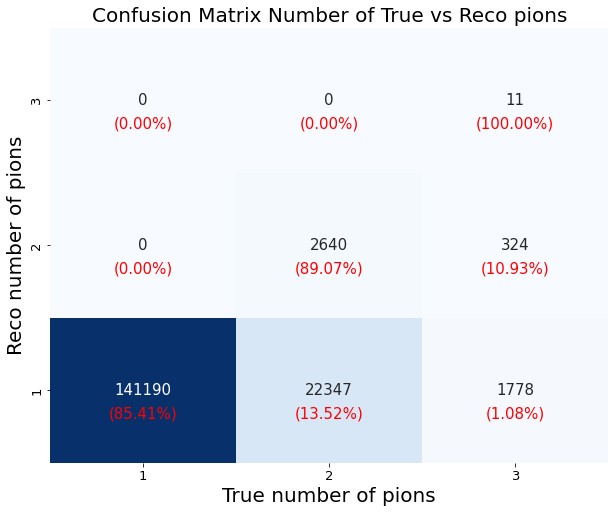

In [107]:
#PERCENTAGE PER ROW

import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

# Assuming numpiR and numpint are defined earlier

# Create the confusion matrix
confusion = confusion_matrix(numpiR, numpint)

# Filter out rows and columns for numbers 1, 2, and 3
relevant_indices = [0, 1, 2]
confusion_relevant = confusion[relevant_indices][:, relevant_indices]

# Calculate the percentage per row
row_sums = confusion_relevant.sum(axis=1, keepdims=True)
confusion_percentage_per_row = confusion_relevant / row_sums * 100

# Plot the matrix with improved formatting
plt.figure(figsize=(10, 8))

# Plot raw numbers
sns.heatmap(confusion_relevant, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["1", "2", "3"],
            yticklabels=["1", "2", "3"],
            annot_kws={"fontsize": 15})

# Add percentage values on top of the numbers
for i in range(3):
    for j in range(3):
        plt.text(j + 0.5, i + 0.4, f"\n({confusion_percentage_per_row[i, j]:.2f}%)",
                 ha="center", va="center", color="red", fontsize=15)  # Adjust font size
plt.gca().invert_yaxis()
plt.xlabel("True number of pions",fontsize=20)
plt.ylabel("Reco number of pions",fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title("Confusion Matrix Number of True vs Reco pions",fontsize=20)
plt.savefig(f"{folder}/analysisfiles/images/ConfussinMatrixTvsR_normalized_row_part1.png")
plt.show()



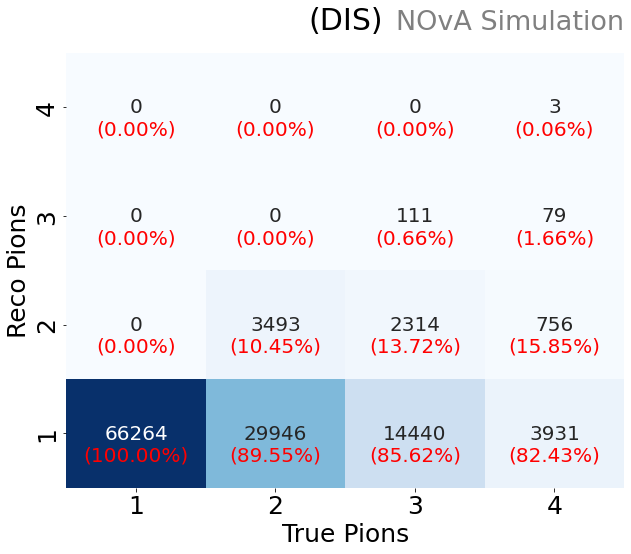

In [16]:
#PERCENTAGE PER COLUMN

import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

# Assuming numpiR and numpint are defined earlier

# Create the confusion matrix
confusion = confusion_matrix(numpiR, numpint)

# Filter out rows and columns for numbers 1, 2, and 3
relevant_indices = [0, 1,2,3]
confusion_relevant = confusion[relevant_indices][:, relevant_indices]

# Calculate the percentage per column
col_sums = confusion_relevant.sum(axis=0, keepdims=True)
confusion_percentage_per_column = confusion_relevant / col_sums * 100

# Plot the matrix with improved formatting
plt.figure(figsize=(10, 8))

# Plot raw numbers
sns.heatmap(confusion_relevant, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["1", "2","3","4"],
            yticklabels=["1", "2","3","4"],
            annot_kws={"fontsize": 20})

# Add percentage values on top of the numbers
for i in range(len(relevant_indices)):
    for j in range(len(relevant_indices)):
        plt.text(j + 0.5, i + 0.4, f"\n({confusion_percentage_per_column[i, j]:.2f}%)",
                 ha="center", va="center", color="red", fontsize=20)  # Adjust font size
plt.gca().invert_yaxis()
plt.xlabel("True Pions",fontsize=25)
plt.ylabel("Reco Pions",fontsize=25)
# Set tick font size
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.title(f"({folder})",y=1.04,fontsize=30)
# Add NOνA Simulation text inside the plot square at the title position
plt.text(1.0, 1.1, 'NOvA Simulation', fontsize=27, color='gray', ha='right', va='top', transform=plt.gca().transAxes)

# Change the width of the frame surrounding the plot
for spine in plt.gca().spines.values():
    spine.set_linewidth(2)  # Adjust the linewidth as needed

# Save and show plot
# plt.savefig(f"{folder}/images/ConfussinMatrixTvsR_normalized_column_part1.png.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/ConfussinMatrixTvsR_normalized_column_part1.png_{folder}.png', bbox_inches='tight')


plt.show()


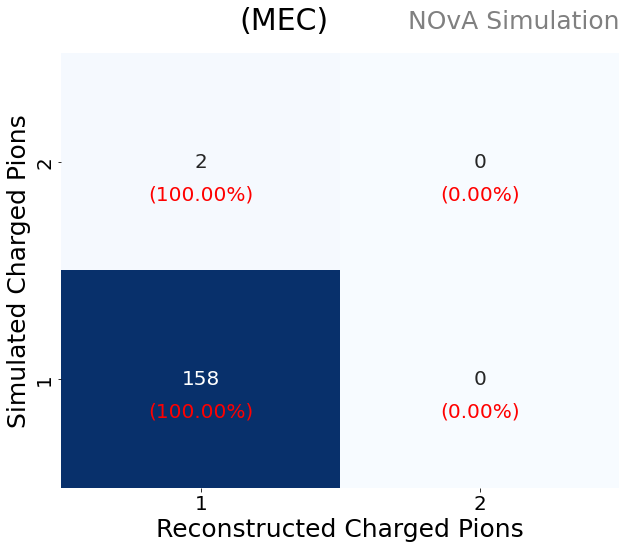

In [20]:
#FIXED PLOTS
#PERCENTAGE PER ROW

import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

# Assuming numpiR and numpint are defined earlier

# Create the confusion matrix
confusion = confusion_matrix(numpint, numpiR)

# Filter out rows and columns for numbers 1, 2, and 3
relevant_indices = [0, 1,2,3]
confusion_relevant = confusion[relevant_indices][:, relevant_indices]

# Calculate the percentage per row
row_sums = confusion_relevant.sum(axis=1, keepdims=True)
confusion_percentage_per_row = confusion_relevant / row_sums * 100

# Plot the matrix with improved formatting
plt.figure(figsize=(10, 8))

# Plot raw numbers
sns.heatmap(confusion_relevant, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["1", "2","3","4"],
            yticklabels=["1", "2","3","4"],
            annot_kws={"fontsize": 20})

# Add percentage values on top of the numbers
for i in range(len(relevant_indices)):
    for j in range(len(relevant_indices)):
        plt.text(j + 0.5, i + 0.4, f"\n({confusion_percentage_per_row[i, j]:.2f}%)",
                 ha="center", va="center", color="red", fontsize=20)  # Adjust font size
plt.gca().invert_yaxis()
plt.xlabel("Reconstructed Charged Pions",fontsize=25)
plt.ylabel("Simulated Charged Pions",fontsize=25)
# Set tick font size
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title(f"({folder})",x=0.4,y=1.04,fontsize=30)
# Add NOνA Simulation text inside the plot square at the title position
plt.text(1.0, 1.1, fr'NOvA Simulation', fontsize=25, color='gray', ha='right', va='top', transform=plt.gca().transAxes)

# Save and show plot
plt.savefig(f"{folder}/images/ConfussinMatrixTvsR_normalized_column_part1.png.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/ConfussinMatrixTvsR_normalized_column_part1.png_{folder}.png', bbox_inches='tight')

plt.show()


In [38]:
folder='NoCut'

In [4]:
#now lets check the NT and reco vertex position for the identified particles

start_time = time.time()

#store the vertex position
temp=[]
temp=read_file(folder, 'analysisfiles/vtxpos_part1')

vtxXpos = []
vtxYpos = []
vtxZpos = []

for event in temp:
    #event = event[1:-1]
    l = len(event)
    nveces=l/3
    nn=0
    for i in range(int(nveces)):
        vtxXpos.append(float(event[i+nn]))
        vtxYpos.append(float(event[i+1+nn]))
        vtxZpos.append(float(event[i+2+nn]))
        nn=nn+2

%store vtxXpos
%store vtxYpos
%store vtxZpos


#store the prong start position
temp=[]
temp=read_file(folder, 'analysisfiles/coorstart_part1')

prngXpos = []
prngYpos = []
prngZpos = []

for event in temp:
    #event = event[1:-1]
    l = len(event)
    nveces=l/3
    nn=0
    for i in range(int(nveces)):
        prngXpos.append(float(event[i+nn]))
        prngYpos.append(float(event[i+1+nn]))
        prngZpos.append(float(event[i+2+nn]))
        nn=nn+2
        
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Stored 'vtxXpos' (list)
Stored 'vtxYpos' (list)
Stored 'vtxZpos' (list)
Elapsed time: 1.5959513187408447 seconds


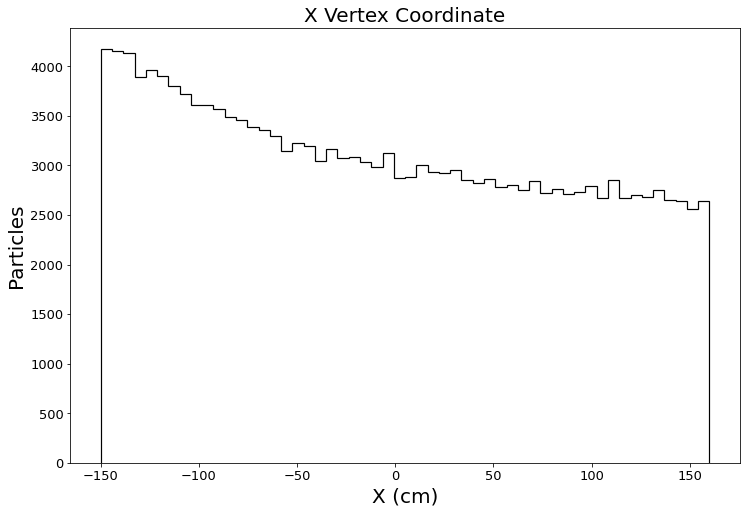

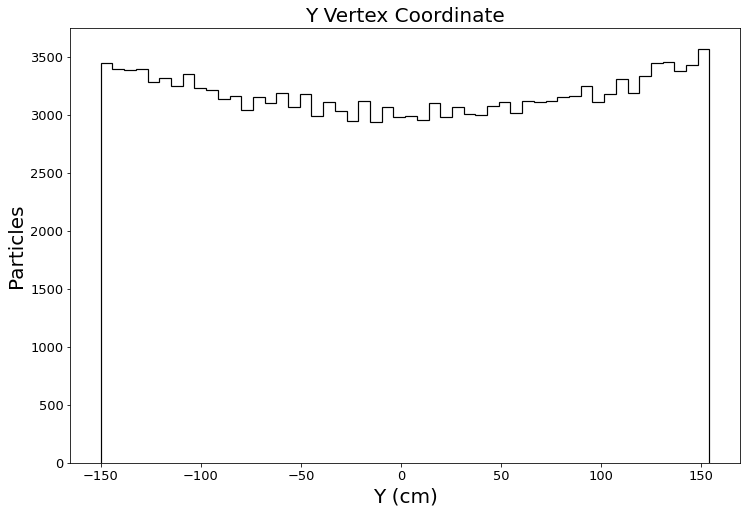

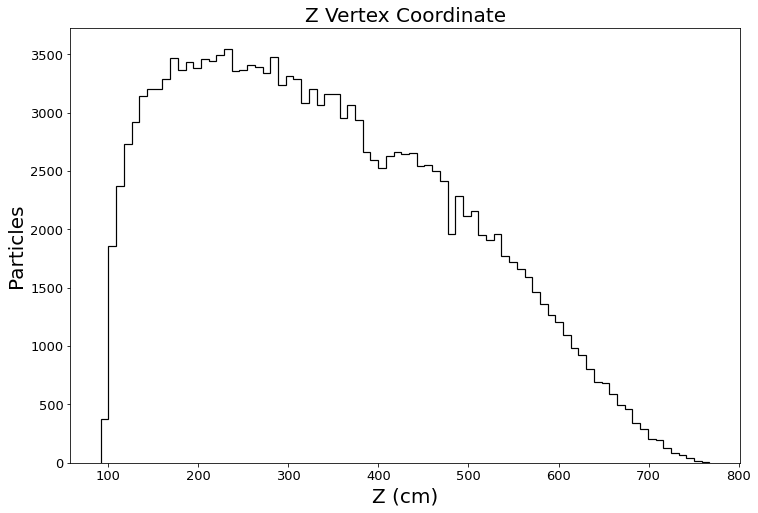

In [84]:
bin_size = 10


#X
# Define histogram parameters
#data_min = np.min(vtxXpos)
#data_max = np.max(vtxXpos)
#hist_min = data_min - 30
#hist_max = data_max + 30

#num_bins = int((hist_max - hist_min) / bin_size)
#bin_edges = np.linspace(hist_min, hist_max, num_bins + 1)
#bin_edges = np.arange(0, 3, bin_size) 

bin_edges=autobins(vtxXpos)
    
plt.figure(figsize=(12, 8)) 
plt.hist(vtxXpos, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('X (cm)', fontsize=30)
plt.ylabel('Particles', fontsize=30)
plt.title('X Vertex Coordinate', fontsize=30)
#plt.yscale('log')
plt.xticks(fontsize=20) 
plt.yticks(fontsize=20)

plt.savefig(f"{folder}/analysisfiles/images/vtxx_part1.png")
plt.show()


#Y
# Define histogram parameters
bin_edges=autobins(vtxYpos)

plt.figure(figsize=(12, 8))  
plt.hist(vtxYpos, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Y (cm)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title('Y Vertex Coordinate', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/vtxY_part1.png")
plt.show()


#Z
# Define histogram parameters
bin_edges=autobins(vtxZpos)    

plt.figure(figsize=(12, 8)) 
plt.hist(vtxZpos, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Z (cm)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title('Z Vertex Coordinate', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/vtxZ_part1.png")
plt.show()


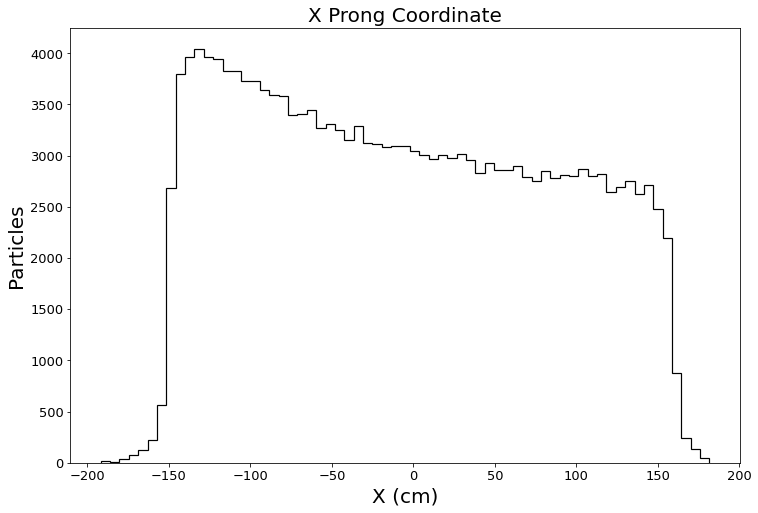

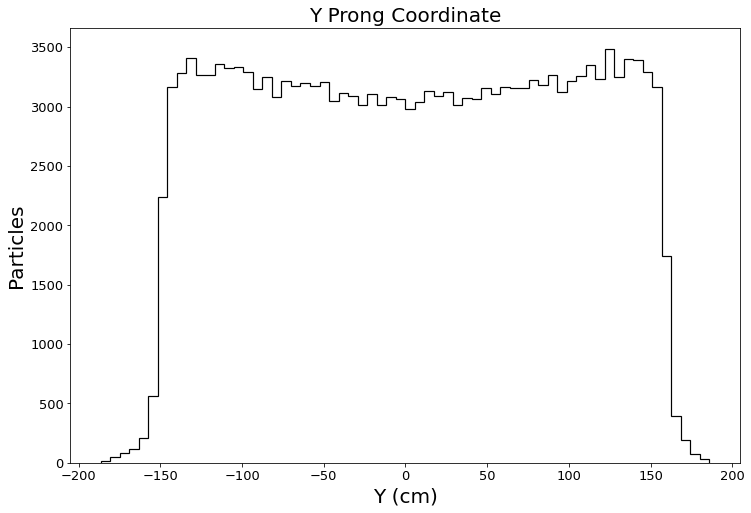

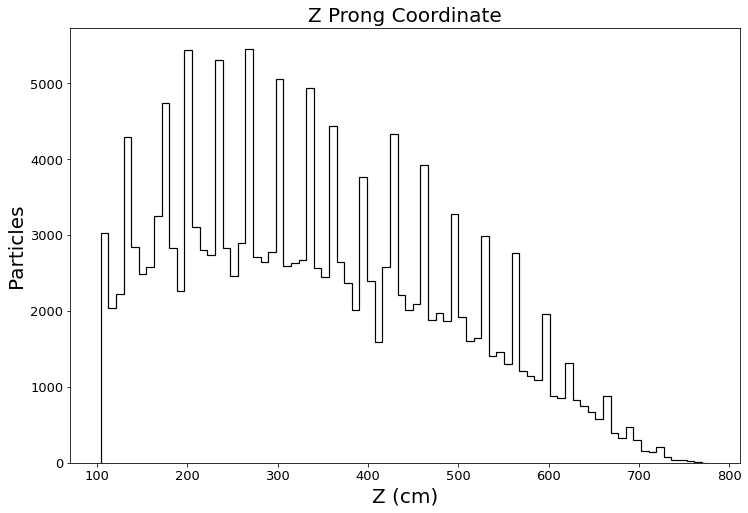

In [85]:
bin_size = 10


#X
# Define histogram parameters
bin_edges=autobins(prngXpos)  
plt.figure(figsize=(12, 8)) 
plt.hist(prngXpos, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('X (cm)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title('X Prong Coordinate', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/ProngX_part1.png")
plt.show()


#Y
# Define histogram parameters
bin_edges=autobins(prngYpos)  
plt.figure(figsize=(12, 8)) 
plt.hist(prngYpos, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Y (cm)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title('Y Prong Coordinate', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/ProngY_part1.png")
plt.show()


#Z
# Define histogram parameters
bin_edges=autobins(prngZpos)      
plt.figure(figsize=(12, 8))  
plt.hist(prngZpos, bins=bin_edges, edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Z (cm)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title('Z Prong Coordinate', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/ProngZ_part1.png")
plt.show()


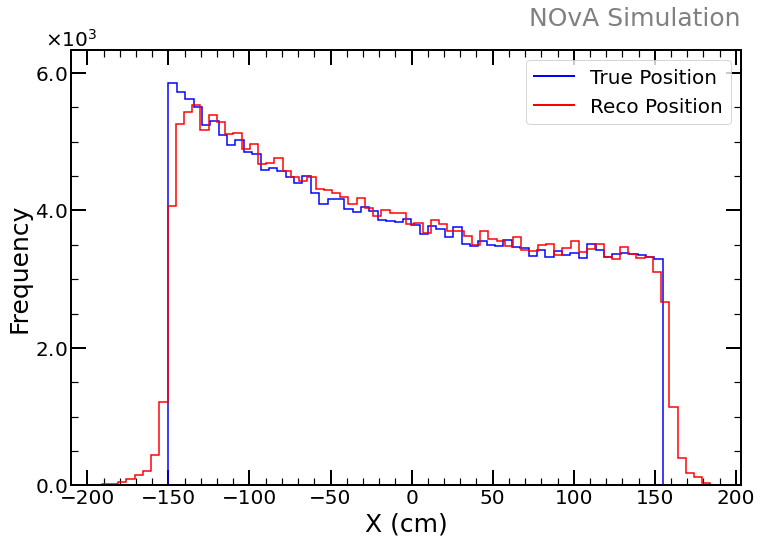

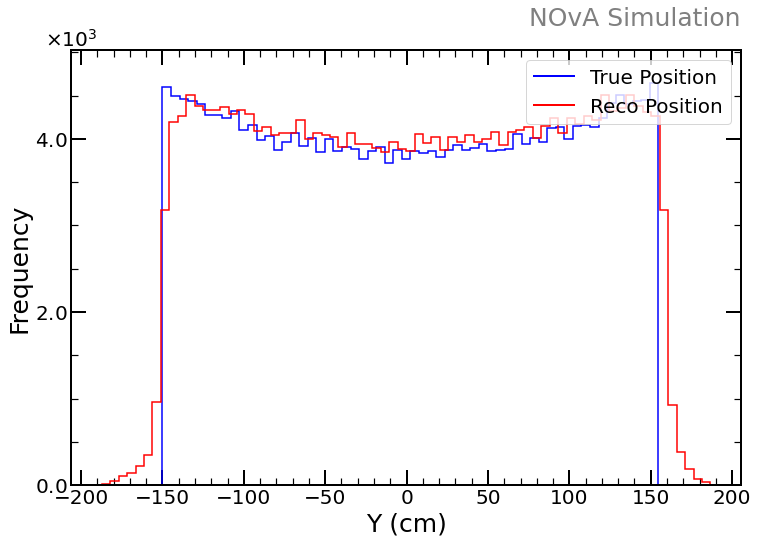

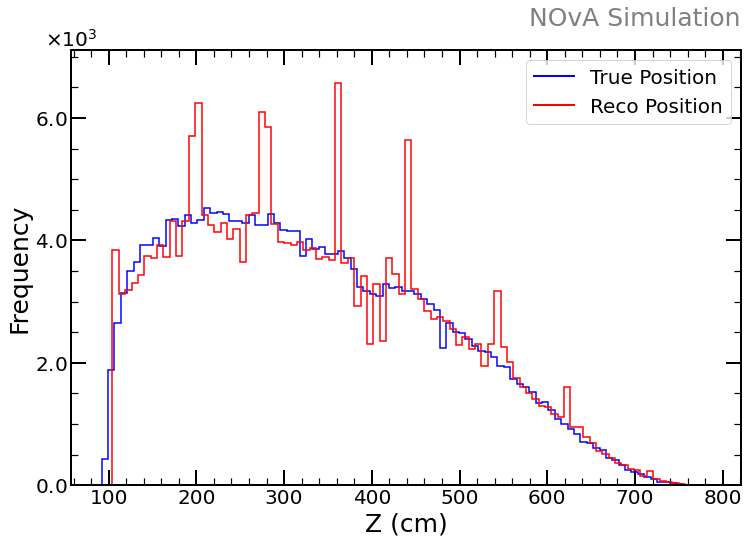

In [9]:
#NOW COMPARE BOTH
# Define histogram parameters
#bin_size = 10
#bin_edges = np.arange(-200, 200, bin_size) 

# Calculate histograms
# hist_nt, _ = np.histogram(vtxXpos, bins=autobins(vtxXpos), density=True)
# hist_reco, _ = np.histogram(prngXpos, bins=autobins(prngXpos), density=True)

# Plot both normalized histograms on the same plot
plt.figure(figsize=(12, 8)) 

# Plot truth energy histogram
plt.hist(vtxXpos, bins=autobins(vtxXpos), edgecolor='blue', linewidth=1.5, histtype='step', label='True vtx pos')

# Plot reco energy histogram
plt.hist(prngXpos, bins=autobins(prngXpos), edgecolor='red', linewidth=1.5, histtype='step', label='Reco png pos')

plt.xlabel('X (cm)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
# plt.title('X position', fontsize=30)
set_plot_style(['True Position', 'Reco Position'])
set_sn2()
#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)
plt.savefig(f"{folder}/analysisfiles/images/Xpos_comparison_histogram_nomralized_part1.png")
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/Xpos_comparison_histogram_nomralized_part1_{folder}.png', bbox_inches='tight')

plt.show()


# Calculate histograms
# hist_nt, _ = np.histogram(vtxYpos, bins=autobins(vtxYpos), density=True)
# hist_reco, _ = np.histogram(prngYpos, bins=autobins(prngYpos), density=True)

# Plot both normalized histograms on the same plot
plt.figure(figsize=(12, 8)) 

# Plot truth energy histogram
plt.hist(vtxYpos, bins=autobins(vtxYpos), edgecolor='blue', linewidth=1.5, histtype='step', label='True vtx pos')

# Plot reco energy histogram
plt.hist(prngYpos, bins=autobins(prngYpos), edgecolor='red', linewidth=1.5, histtype='step', label='Reco png pos')

set_plot_style(['True Position', 'Reco Position'])
set_sn2()
#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)

plt.xlabel('Y (cm)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
# plt.title('Truth and Reco pion Y position', fontsize=30)

plt.savefig(f"{folder}/analysisfiles/images/Ypos_comparison_histogram_nomralized_part1.png")
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/Ypos_comparison_histogram_nomralized_part1_{folder}.png', bbox_inches='tight')

plt.show()


#bin_edges = np.arange(0, 900, bin_size) 
# Calculate histograms
# hist_nt, _ = np.histogram(vtxZpos, bins=autobins(vtxZpos), density=True)
# hist_reco, _ = np.histogram(prngZpos, bins=autobins(prngZpos), density=True)

# Plot both normalized histograms on the same plot
plt.figure(figsize=(12, 8)) 

# Plot truth energy histogram
plt.hist(vtxZpos, bins=autobins(vtxZpos), edgecolor='blue', linewidth=1.5, histtype='step', label='True vtx pos')

# Plot reco energy histogram
plt.hist(prngZpos, bins=autobins(prngZpos), edgecolor='red', linewidth=1.5, histtype='step', label='Reco png pos')
set_plot_style(['True Position', 'Reco Position'])
set_sn2()
#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)

plt.xlabel('Z (cm)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
# plt.title('Truth and Reco pion Z position', fontsize=30)

plt.savefig(f"{folder}/analysisfiles/images/Zpos_comparison_histogram_nomralized_part1.png")
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/Zpos_comparison_histogram_nomralized_part1_{folder}.png', bbox_inches='tight')

plt.show()

In [45]:
#SCATTER PLOT BETWEEN THE PION ENERGY AND THE LEPTON ENERGY FOR 1 PION AND +1 PION EVENTS

#checking the cvn value of the identified pions

start_time = time.time()

Lpdgs_nopion = read_file(f'{folder}/analysisfiles', 'pdgs_perevent_nonpion_part1')
Lcalenergies_nopion = read_file(f'{folder}/analysisfiles', 'calenergies_perevent_nonpion_part1')
Lcalenergies_pion = read_file(f'{folder}/analysisfiles', 'calenergies_part1')
 
list1pionE = []
list1pluspionE = []
list1pi_leptonE = []
list1pluspi_leptonE = []

for a, element in enumerate(Lcalenergies_pion):
    #if only one element, means only on pion
    if len(element) == 1:
        for b, event in enumerate(Lpdgs_nopion[a]):
            if event == '11' or event == '13' or event == '15':
                list1pionE.append(float(Lcalenergies_pion[a][0]))
                list1pi_leptonE.append(float(Lcalenergies_nopion[a][b]))
    if len(element) > 1:
        sum=0
        for event in element:
            sum = sum + float(event)
        for b, event in enumerate(Lpdgs_nopion[a]):
            if event == '11' or event == '13' or event == '15':
                list1pluspi_leptonE.append(float(Lcalenergies_nopion[a][b]))
                list1pluspionE.append(sum)
                
print(len(list1pionE))
print(len(list1pluspionE))
print(len(list1pi_leptonE))
print(len(list1pluspi_leptonE))
        
    
    
        
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

155517
2698
155517
2698
Elapsed time: 1.0842740535736084 seconds


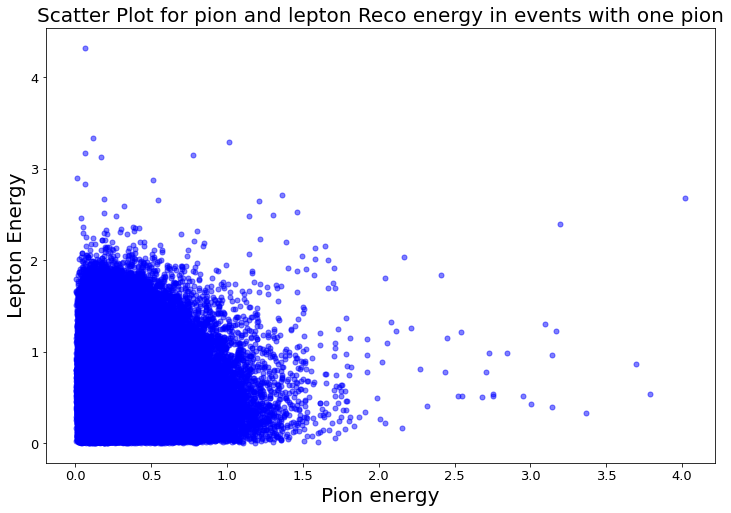

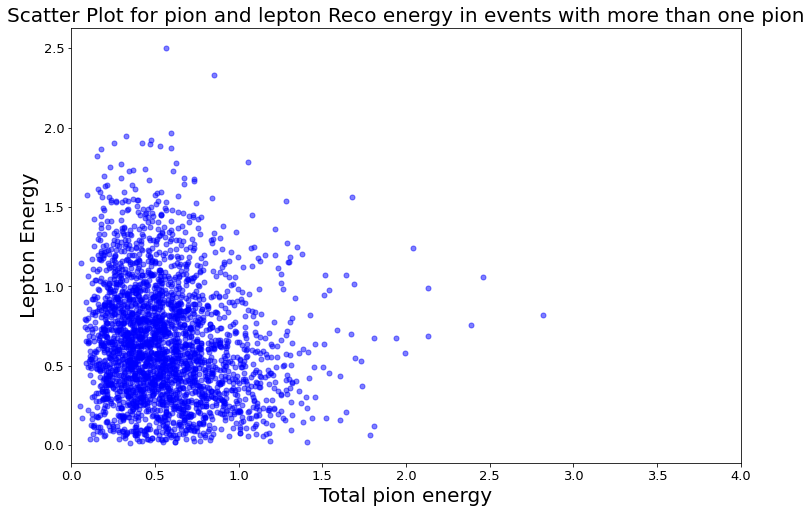

In [87]:
plt.figure(figsize=(12, 8)) 

plt.scatter(list1pionE, list1pi_leptonE, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('Pion energy',fontsize=20)
plt.ylabel('Lepton Energy',fontsize=20)
plt.title('Scatter Plot for pion and lepton Reco energy in events with one pion',fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
#plt.ylim(0,1)
plt.savefig(f"{folder}/analysisfiles/images/scatter_Reco_1PiE_vs_LeptE_part1.png")
plt.show()


plt.figure(figsize=(12, 8)) 
plt.scatter(list1pluspionE, list1pluspi_leptonE, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('Total pion energy',fontsize=20)
plt.ylabel('Lepton Energy',fontsize=20)
plt.title('Scatter Plot for pion and lepton Reco energy in events with more than one pion',fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.xlim(0,4)
plt.savefig(f"{folder}/analysisfiles/images/scatter_Reco_1plusPiE_vs_LeptE_part1.png")
plt.show()

In [7]:
folder='DIS'

In [8]:
#checking the cvn value of the identified pions

start_time = time.time()
#true energies
temp=[]
energiesnt=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part1')
energiesnt = [float(element) for sublist in temp for element in sublist]  

#Reco energies
temp=[]
calenergies=[]
temp=read_file(folder, 'analysisfiles/calenergies_part1')
calenergies = [float(element) for sublist in temp for element in sublist]  

#CVN
temp=[]
cvn=[]
temp=read_file(folder, 'analysisfiles/CVN_part1')
cvn = [float(element) for sublist in temp for element in sublist]  
 
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.409512996673584 seconds


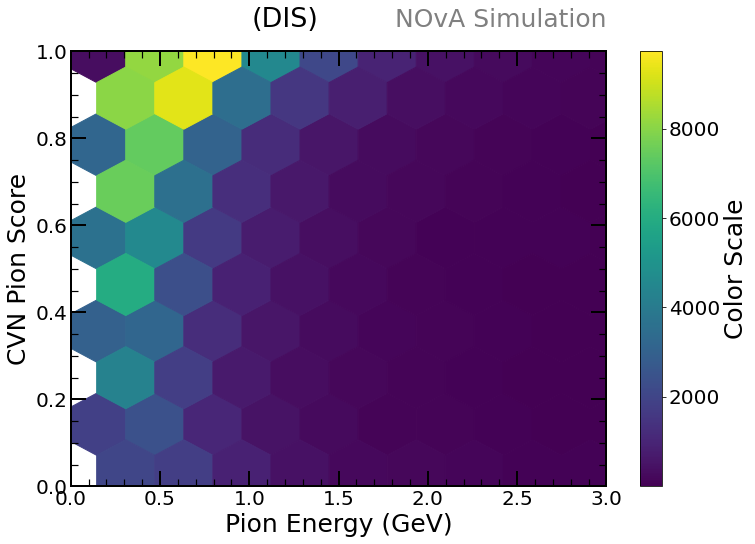

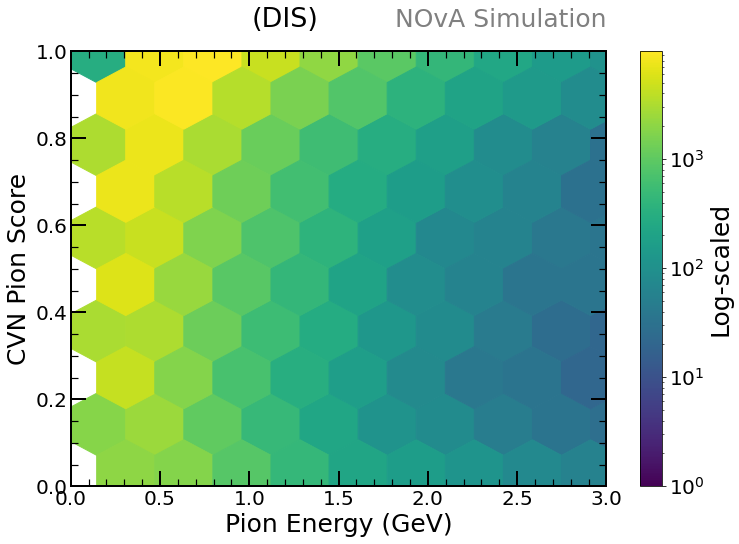

In [9]:
# Ensure energies and theta2 are numpy arrays
energies_hb = np.array(energiesnt)
theta_hb = np.array(cvn)

# Sample the data
# sample_size = 500000  # Sample 100,000 points
# indices = np.random.choice(len(energies_hb), sample_size, replace=False)
# sampled_energies = energies_hb[indices]
# sampled_theta2 = theta2_hb[indices]

# Create the plot
plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(energies_hb, theta_hb, gridsize=50, cmap='viridis', mincnt=1)

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Color Scale', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.xlim(0,3)
plt.savefig(f"{folder}/analysisfiles/images/pionenergy_vs_cvn_normal_part1_{folder}.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()

plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(energies_hb, theta_hb, gridsize=50, cmap='viridis', mincnt=1, norm=mcolors.LogNorm())

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Log-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.xlim(0,3)
plt.savefig(f"{folder}/analysisfiles/images/pionenergy_vs_cvn_logscaled_part1_{folder}.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()

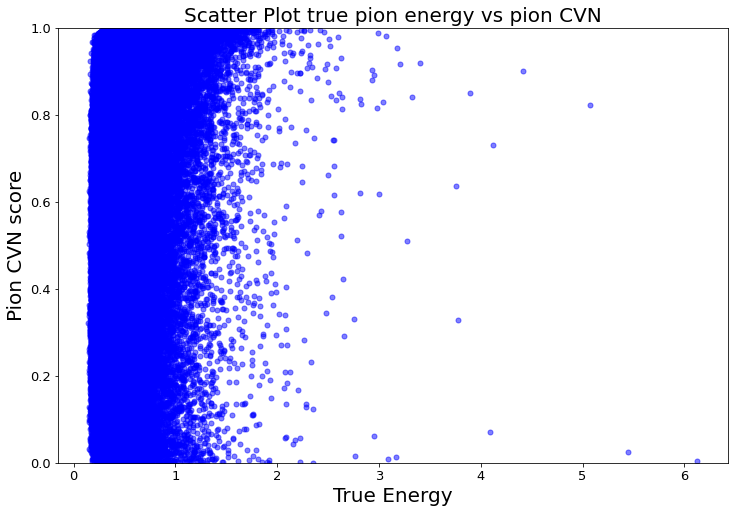

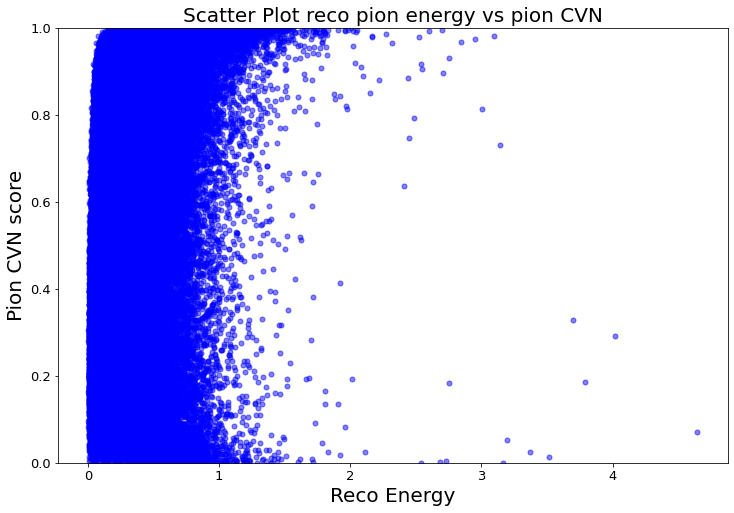

In [88]:
plt.figure(figsize=(12, 8)) 

plt.scatter(energiesnt, cvn, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('True Energy',fontsize=20)
plt.ylabel('Pion CVN score',fontsize=20)
plt.title('Scatter Plot true pion energy vs pion CVN',fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.ylim(0,1)
plt.savefig(f"{folder}/analysisfiles/images/scatter_Et_CVN_part1.png")
plt.show()


plt.figure(figsize=(12, 8)) 
plt.scatter(calenergies, cvn, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('Reco Energy',fontsize=20)
plt.ylabel('Pion CVN score',fontsize=20)
plt.title('Scatter Plot reco pion energy vs pion CVN',fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.ylim(0,1)
plt.savefig(f"{folder}/analysisfiles/images/scatter_Er_CVN_part1.png")
plt.show()

In [29]:
folder='NoCut'

In [22]:
#checking the cvn value of the identified pions

start_time = time.time()
#CVN
temp=[]
cvn=[]
temp=read_file(folder, 'analysisfiles/CVN_part1')
cvn = [float(element) for sublist in temp for element in sublist]  

#calenergies           
temp=[]
calenergies=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part1')
calenergies = [float(element) for sublist in temp for element in sublist] 

            
#after that, lets see how is the behavior of the cvn values with respect to ranges of energy.

energy_ranges = [(0, 0.2), (0.2, 0.5), (0.5, 1), (1, 1.5), (1.5, 2)]

# Initialize a list to store filtered runs for each energy range
cvns = [[] for _ in range(len(energy_ranges))] 

for j, event in enumerate(calenergies):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            cvns[i].append(cvn[j])

        
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.6015899181365967 seconds


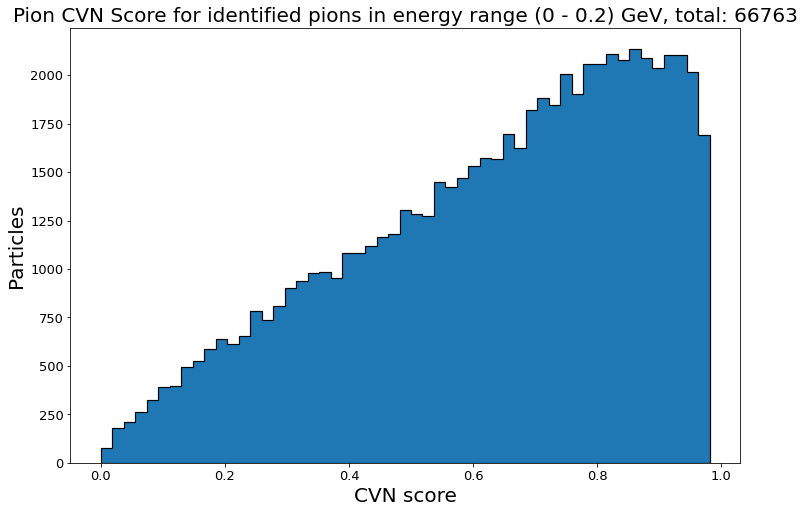

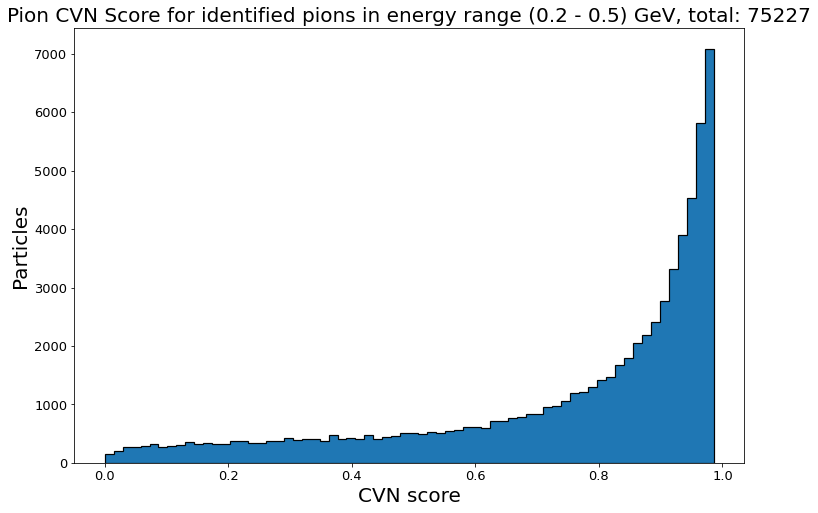

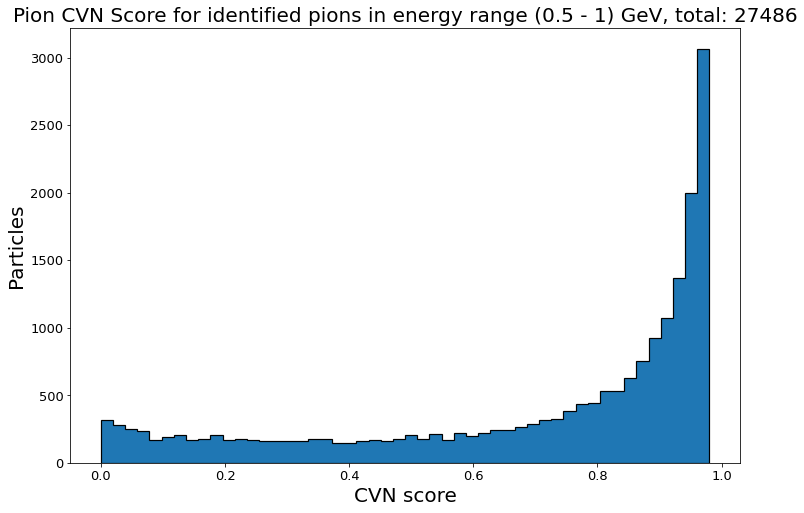

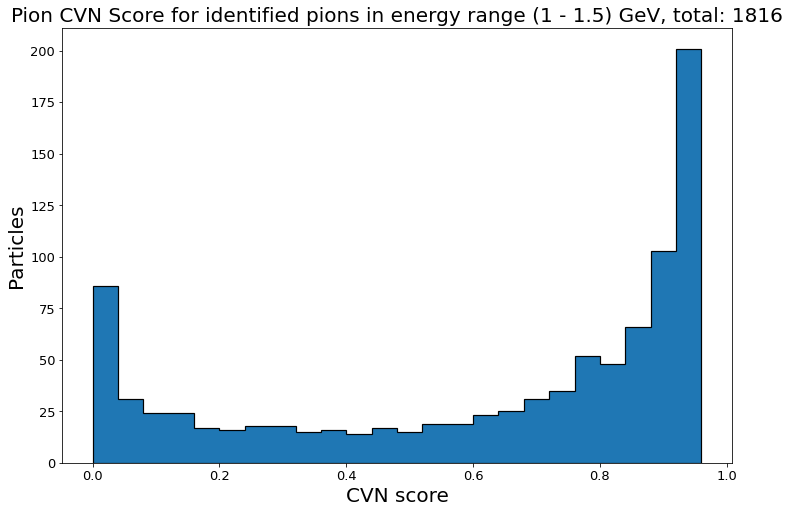

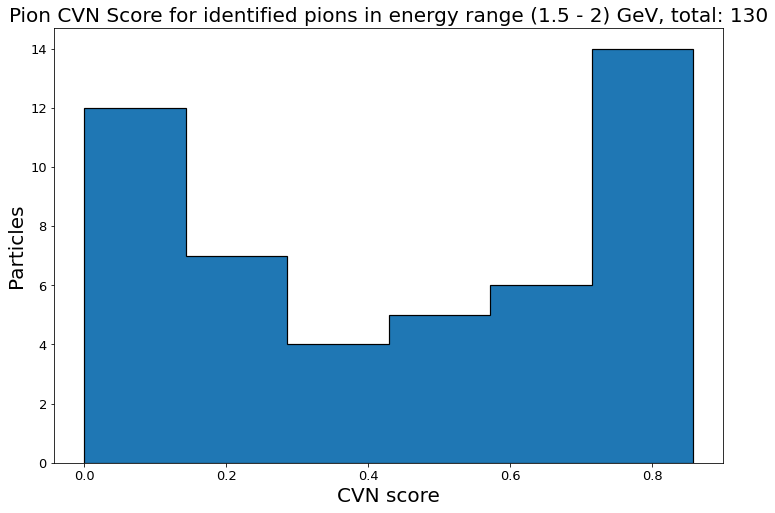

In [89]:
#bin_size = 0.025
#bin_edges = np.arange(0, 1, bin_size) 

for i, (start, end) in enumerate(energy_ranges):
    plt.figure(figsize=(12, 8)) 
    plt.hist(cvns[i], bins=autobins(cvns[i],0,1), edgecolor='black', histtype = 'stepfilled', linewidth=1.2)
    plt.xlabel('CVN score', fontsize=20)
    plt.ylabel('Particles', fontsize=20)
    plt.xticks(fontsize=13) 
    plt.yticks(fontsize=13)
    plt.title(f'Pion CVN Score for identified pions in energy range ({start} - {end}) GeV, total: {len(cvns[i])}', fontsize=20)
    plt.savefig(f"{folder}/analysisfiles/images/cvn_pion_Energy_range_{start}_to_{end}_part1.png")
    plt.show()

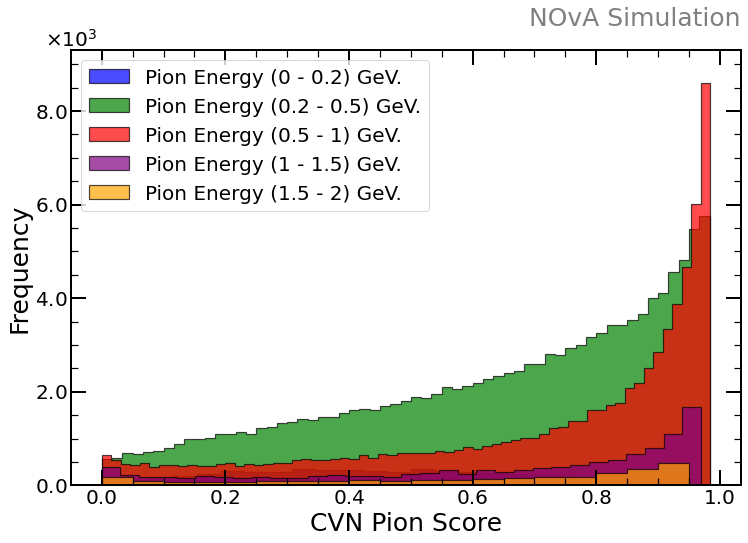

In [6]:
#bin_size = 0.025
#bin_edges = np.arange(0, 1, bin_size) 

# Define colors for each histogram
colors = ['blue', 'green', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12, 8)) 
combined_subplot = plt.subplot(111)

# Plot individual histograms with specified colors
for i, (start, end) in enumerate(energy_ranges):
    plt.hist(cvns[i], bins=autobins(cvns[i],0,1), edgecolor='black', linewidth=1.2, histtype = 'stepfilled',alpha=0.7, label=f'Pion Energy ({start} - {end}) GeV.', color=colors[i])#{len(cvns[i])} events', color=colors[i])

plt.xlabel('CVN Pion Score', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
# plt.title(f'Pion CVN Score for pion energy ranges', fontsize=30)
set_plot_style()
set_sn2()
plt.legend(fontsize=20, loc='upper left')

plt.savefig(f"{folder}/analysisfiles/images/cvn_combined_energy_ranges_part1_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/cvn_combined_energy_ranges_part1_{folder}.png', bbox_inches='tight')

plt.show()

In [51]:
#CHECKING THE BEHAVIOUR OF THE PIONS AND BKG PARTICLES BEFORE AND AFTER A THRESHOLD CUT

start_time = time.time()
#without threshold
#CVN
temp=[]
cvn=[]
temp=read_file(folder, 'analysisfiles/CVN_part1')
cvn = [float(element) for sublist in temp for element in sublist]  

temp=[]
cvn_nopi=[]
temp=read_file(folder, 'analysisfiles/cvns_perevent_nonpion_part1')

for event in temp:
    event = event[1:-1]
    for g in range(len(event)):
        cvn_nopi.append(float(event[g]))
        

#now apply the threshold
threshold = 0.35

cvn_tr = []
for element in cvn:
    if element > threshold:
        cvn_tr.append(element)

cvn_nopi_tr = []
for element in cvn_nopi:
    if element > threshold:
        cvn_nopi_tr.append(element)
        
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.80141282081604 seconds


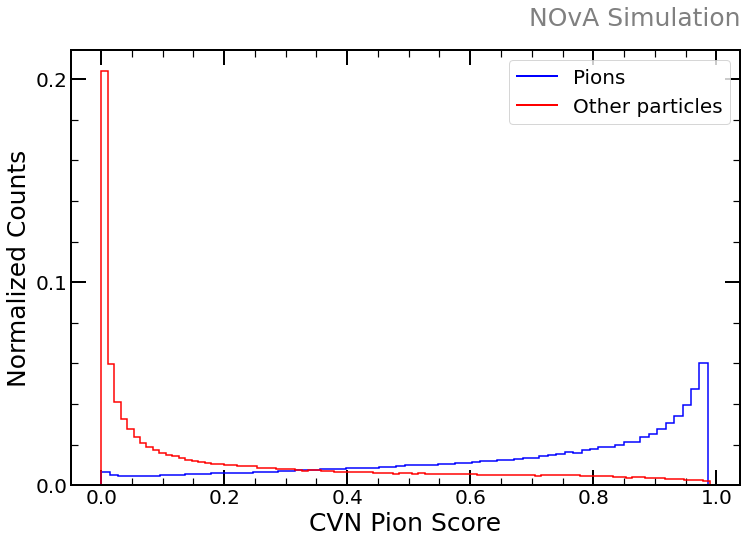

In [35]:
#plot normalized comparison between cvn for pi and no pi

# Calculate histograms
weights = np.ones_like(cvn) / len(cvn)
weights2 = np.ones_like(cvn_nopi) / len(cvn_nopi)

plt.figure(figsize=(12, 8)) 
plt.hist(cvn, bins=autobins(cvn,0,1), edgecolor='blue', linewidth=1.5, histtype='step', label='Pions (Signal)', weights=weights)
plt.hist(cvn_nopi, bins=autobins(cvn_nopi,0,1), edgecolor='red', linewidth=1.5, histtype='step', label='Other particles (Background)', weights=weights2)

plt.xlabel('CVN Pion Score', fontsize=25)
plt.ylabel('Normalized Counts', fontsize=25)
# plt.title('Pion CVN Score for identified particles', fontsize=30)
plt.legend(fontsize=20)

set_plot_style(['Pions','Other particles'])
#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=4)

plt.savefig(f"{folder}/images/cvn_pion_no_pion_total_part1_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/cvn_pion_no_pion_total_part1_{folder}.png', bbox_inches='tight')
plt.show()

In [25]:
folder='Res'

In [26]:
#lest check the behavior of the cvn depending the number of pp
start_time = time.time()
truepp=[]
truepp=read_file2(folder, 'analysisfiles/allpdgNT_part1')

recopp=[]
recopp=read_file2(folder, 'analysisfiles/allpdgReco_part1')


cvn =[]
cvn=read_file(folder, 'analysisfiles/CVN_part1')


#check first depending the number of pp RECO, from 3 to 6:

cvn3=[]
cvn4=[]
cvn5=[]
cvn6=[]
for i, event in enumerate(recopp):
    l=len(event)
    eventcvn=cvn[i]
    #summ=sum(float(element) for element in eventcvn)
    if l ==3:
        for element in eventcvn:
            cvn3.append(float(element))
    if l ==4:
        for element in eventcvn:
            cvn4.append(float(element))
    if l ==5:
        for element in eventcvn:
            cvn5.append(float(element))
    if l ==6:
        for element in eventcvn:
            cvn6.append(float(element))

#now check dependind the number of pions

cvn1pi=[]
cvn2pi=[]
cvn3pi=[]
for i, event in enumerate(cvn):
    l=len(event)
    eventcvn=cvn[i]
    #summ=sum(float(element) for element in eventcvn)
    if l ==1:
        for element in eventcvn:
            cvn1pi.append(float(element))
    if l ==2:
        for element in eventcvn:
            cvn2pi.append(float(element))
    if l ==3:
        for element in eventcvn:
            cvn3pi.append(float(element))



end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 1.0705580711364746 seconds


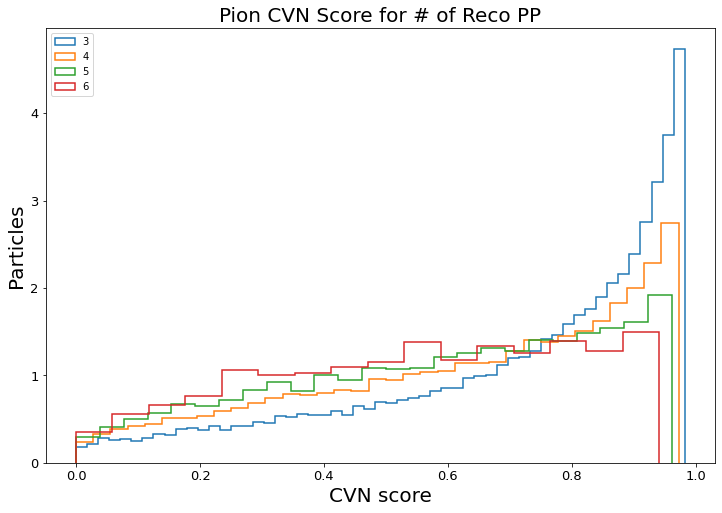

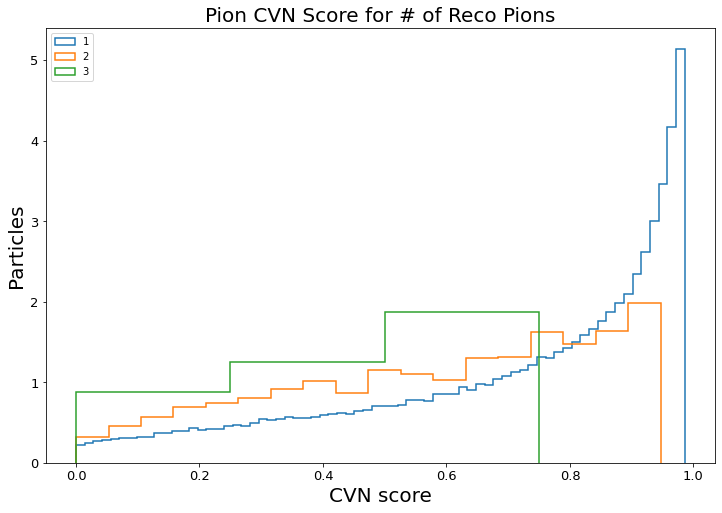

In [27]:
plt.figure(figsize=(12, 8)) 
plt.hist(cvn3, bins=autobins(cvn3,0,1), histtype='step', linewidth=1.5, density=True,label='3')
plt.hist(cvn4, bins=autobins(cvn4,0,1),  histtype='step', linewidth=1.5, density=True,label='4')
plt.hist(cvn5, bins=autobins(cvn5,0,1),  histtype='step', linewidth=1.5, density=True,label='5')
plt.hist(cvn6, bins=autobins(cvn6,0,1),  histtype='step', linewidth=1.5, density=True,label='6')
plt.xlabel('CVN score', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title(f'Pion CVN Score for # of Reco PP', fontsize=20)
#plt.savefig(f"{folder}/analysisfiles/images/cvn_pion_total_part1.png")
plt.legend(loc='upper left')
plt.show()





plt.figure(figsize=(12, 8)) 
plt.hist(cvn1pi, bins=autobins(cvn1pi,0,1), histtype='step', linewidth=1.5,density=True,label='1')
plt.hist(cvn2pi, bins=autobins(cvn2pi,0,1), histtype='step', linewidth=1.5,density=True,label='2')
plt.hist(cvn3pi, bins=autobins(cvn3pi,0,1), histtype='step', linewidth=1.5,density=True,label='3')
plt.xlabel('CVN score', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title(f'Pion CVN Score for # of Reco Pions', fontsize=20)
#plt.savefig(f"{folder}/analysisfiles/images/cvn_pion_total_part1.png")
plt.legend(loc='upper left')
plt.show()



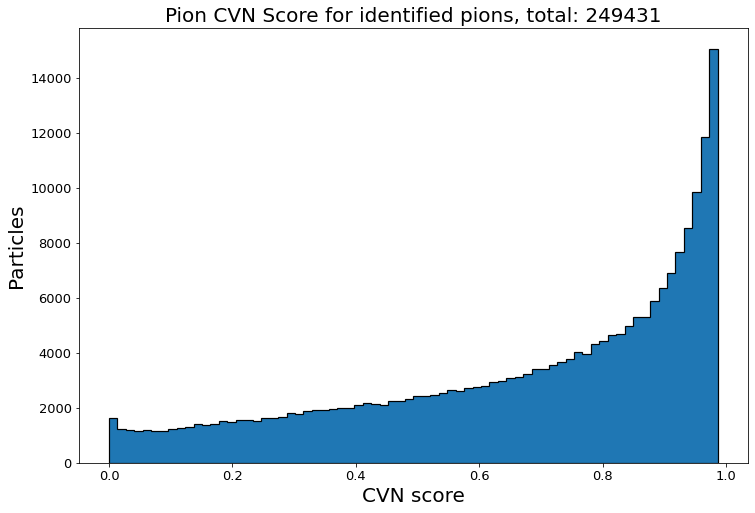

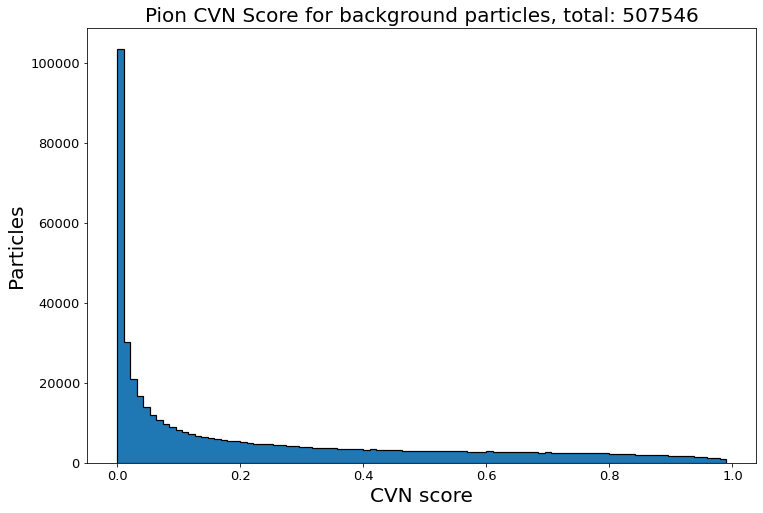

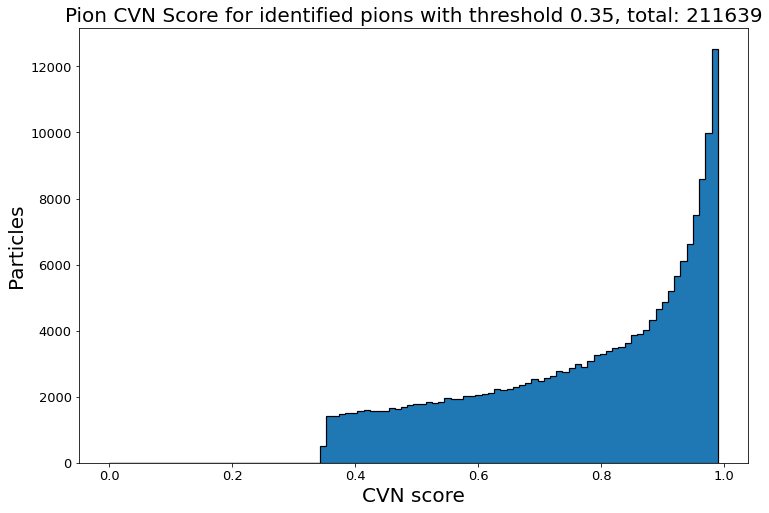

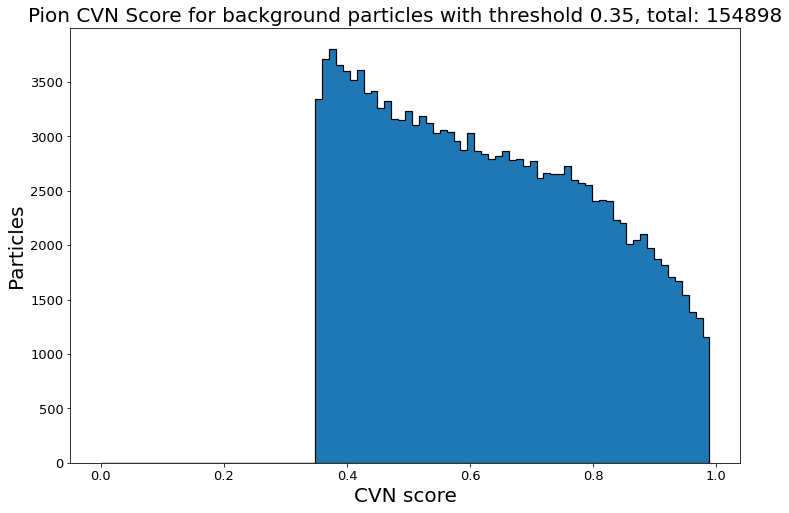

In [10]:
#bin_size = 0.025
#bin_edges = np.arange(0, 1, bin_size) 



plt.figure(figsize=(12, 8)) 
plt.hist(cvn, bins=autobins(cvn,0,1), edgecolor='black', histtype='stepfilled', linewidth=1.2)
plt.xlabel('CVN score', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title(f'Pion CVN Score for identified pions, total: {len(cvn)}', fontsize=20)
plt.savefig(f"{folder}/analysisfiles/images/cvn_pion_total_part1.png")
plt.show()

plt.figure(figsize=(12, 8)) 
plt.hist(cvn_nopi, bins=autobins(cvn_nopi,0,1), edgecolor='black',histtype='stepfilled', linewidth=1.2)
plt.xlabel('CVN score', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title(f'Pion CVN Score for background particles, total: {len(cvn_nopi)}', fontsize=20)
plt.savefig(f"{folder}/analysisfiles/images/cvn_nopion_total_part1.png")
plt.show()

plt.figure(figsize=(12, 8)) 
plt.hist(cvn_tr, bins=autobins(cvn_tr,0,1), edgecolor='black',histtype='stepfilled', linewidth=1.2)
plt.xlabel('CVN score', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title(f'Pion CVN Score for identified pions with threshold {threshold}, total: {len(cvn_tr)}', fontsize=20)
plt.savefig(f"{folder}/analysisfiles/images/cvn_pion_threshold_{threshold}_part1.png")
plt.show()

plt.figure(figsize=(12, 8)) 
plt.hist(cvn_nopi_tr, bins=autobins(cvn_nopi_tr,0,1), edgecolor='black',histtype='stepfilled', linewidth=1.2)
plt.xlabel('CVN score', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.title(f'Pion CVN Score for background particles with threshold {threshold}, total: {len(cvn_nopi_tr)}', fontsize=20)
plt.savefig(f"{folder}/analysisfiles/images/cvn_nopion_threshold_{threshold}_part1.png")
plt.show()

In [13]:
folder='DIS'

In [14]:
#lets check also the difference in alpha and theta for energy ranges

start_time = time.time()

temp=[]
theta=[]
temp=read_file(folder, 'analysisfiles/theta_part1')
theta = [float(element)*(180 / math.pi) for sublist in temp for element in sublist] 

%store theta


temp=[]
alpha=[]
temp=read_file(folder, 'analysisfiles/alpha_part1')      

for event in temp:
    l = len(event)
    num =int(l/3)-1
    mm=0
    for i in range(num):
        mm=mm+3
        vector1 = np.array([float(event[0]), float(event[1]), float(event[2])])
        vector2 = np.array([float(event[mm]), float(event[mm+1]), float(event[mm+2])])
        dot_product = np.dot(vector1, vector2)
        magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
        cosine_theta = dot_product / magnitude_product
        #save the cosine
        #alpha.append(cosine_theta)
        angle_radians = np.arccos(cosine_theta)
        degrees_angle = angle_radians * (180 / math.pi)
        #alpha.append(angle_radians)
        alpha.append(degrees_angle)

%store alpha

temp=[]
calenergies=[]
temp=read_file(folder, 'analysisfiles/calenergies_part1')
calenergies = [float(element) for sublist in temp for element in sublist] 

            
#after that, lets see how is the behavior of the cvn values with respect to ranges of energy.

energy_ranges = [(0, 0.2), (0.2, 0.5), (0.5, 1), (1, 1.5), (1.5, 2)]

# Initialize a list to store filtered angles for each energy range
alphas = [[] for _ in range(len(energy_ranges))] 
thetas = [[] for _ in range(len(energy_ranges))] 

for j, event in enumerate(calenergies):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphas[i].append(alpha[j])
            thetas[i].append(theta[j])
print(len(alpha))
print(len(theta))
        
%store thetas
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Stored 'theta' (list)
Stored 'alpha' (list)
131230
131230
Stored 'thetas' (list)
Elapsed time: 3.571728229522705 seconds


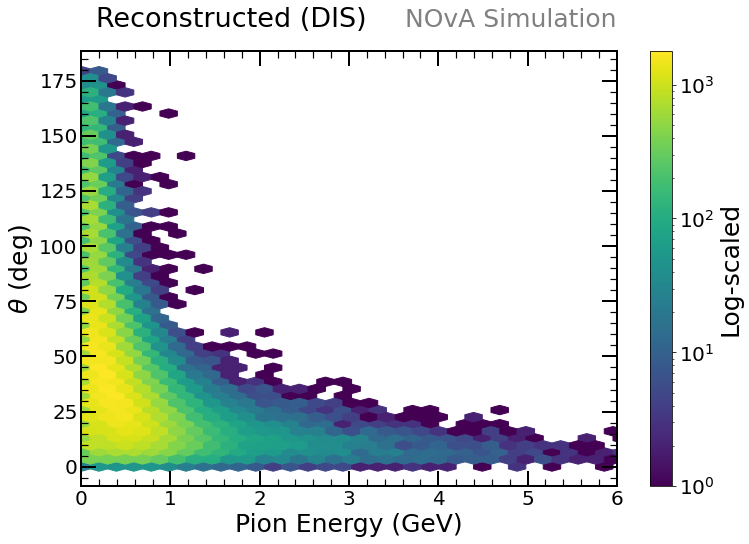

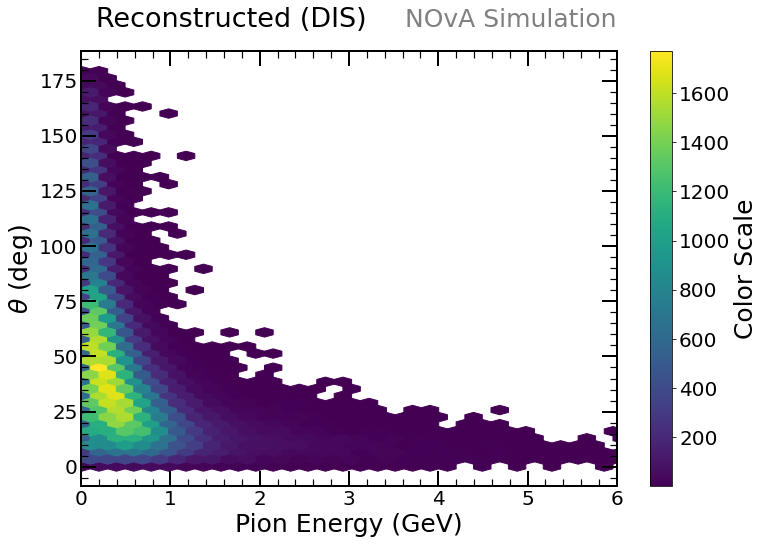

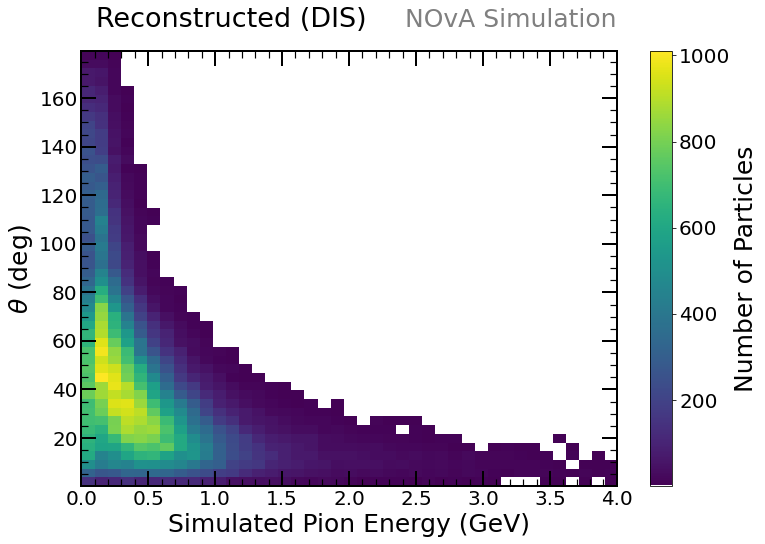

In [15]:


# Ensure energies and theta2 are numpy arrays
energies_hb = np.array(calenergies)
theta_hb = np.array(theta)

# Sample the data
# sample_size = 500000  # Sample 100,000 points
# indices = np.random.choice(len(energies_hb), sample_size, replace=False)
# sampled_energies = energies_hb[indices]
# sampled_theta2 = theta2_hb[indices]

# Create the plot
plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(energies_hb, theta_hb, gridsize=50, cmap='viridis', mincnt=1, norm=mcolors.LogNorm())

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Log-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel(fr'$\theta$ (deg)', fontsize=25)
plt.title(f'Reconstructed ({folder})', x=0.28,y=1.042,fontsize=27)
set_plot_style()
plt.xlim(0, 6)
#plt.savefig(f"{folder}/analysisfiles/images/scatter_E_theta_part1_{folder}.png", bbox_inches='tight')
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

# plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png", bbox_inches='tight')

plt.show()



# Create the plot
plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(energies_hb, theta_hb, gridsize=50, cmap='viridis', mincnt=1)

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Color Scale', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Pion Energy (GeV)', fontsize=25)
plt.ylabel(fr'$\theta$ (deg)', fontsize=25)
plt.title(f'Reconstructed ({folder})', x=0.28,y=1.042,fontsize=27)
set_plot_style()
plt.xlim(0, 6)
#plt.savefig(f"{folder}/analysisfiles/images/scatter_E_theta_normal_part1_{folder}.png", bbox_inches='tight')
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_normal_part1_{folder}.png', bbox_inches='tight')

# plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/scatter_E_theta_normal_part1_{folder}.png", bbox_inches='tight')

plt.show()


plt.figure(figsize=(12, 8))

# Create a 2D histogram with square bins
counts, xedges, yedges = np.histogram2d(energies_hb, theta_hb, bins=(100, 50))

# Define a custom colormap with white for zero counts
colors = plt.cm.viridis(np.linspace(0, 1, 256))
colors[0] = [1, 1, 1, 1]  # Set the first color to white
cmap = ListedColormap(colors)

# Create the norm
norm = mcolors.Normalize(vmin=0.1, vmax=np.max(counts))

# Plot the histogram with the custom colormap
plt.imshow(counts.T, origin='lower', cmap=cmap, norm=norm, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], aspect='auto')

# Add color bar
cb = plt.colorbar()
cb.set_label('Number of Particles', fontsize=25)
cb.ax.tick_params(labelsize=20)

# Set labels and title
plt.xlabel('Simulated Pion Energy (GeV)', fontsize=25)
plt.ylabel(r'$\theta$ (deg)', fontsize=25)
plt.title(f'Reconstructed ({folder})', x=0.28, y=1.042, fontsize=27)
set_plot_style()
plt.xlim(0, 4)

# Save the plot
# plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/scatter_E_alpha_normal_part2_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_normal_part1_{folder}.png', bbox_inches='tight')
plt.show()


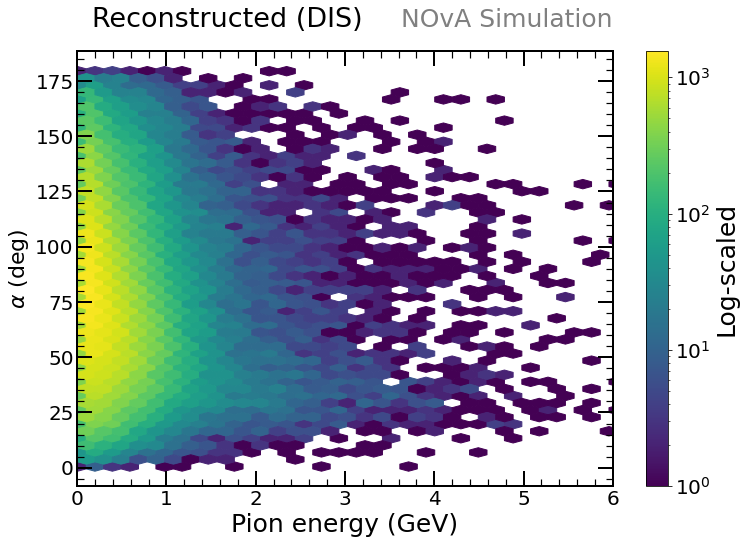

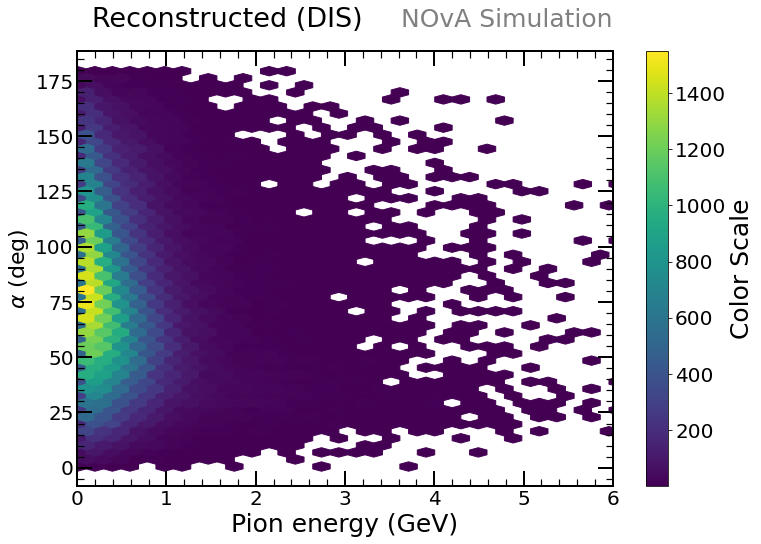

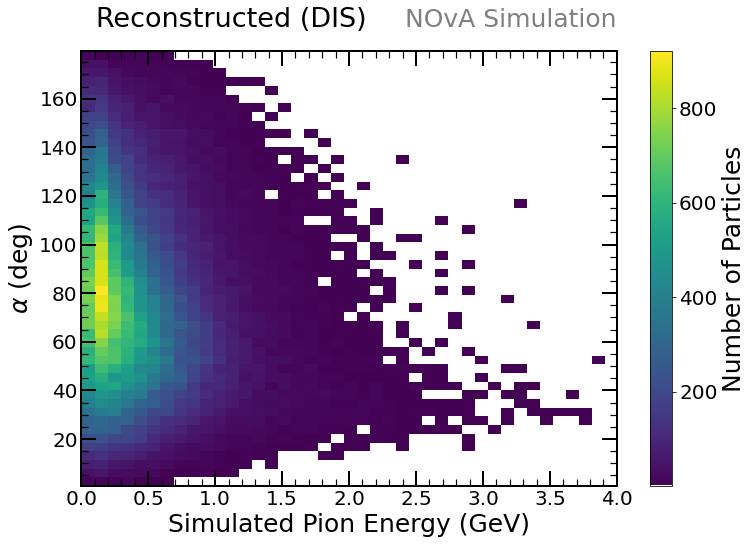

In [16]:
import matplotlib.colors as mcolors

# Ensure energies and theta2 are numpy arrays
energies_hb = np.array(calenergies)
alpha_hb = np.array(alpha)

# Sample the data
# sample_size = 500000  # Sample 100,000 points
# indices = np.random.choice(len(energies_hb), sample_size, replace=False)
# sampled_energies = energies_hb[indices]
# sampled_theta2 = theta2_hb[indices]

# Create the plot
plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(energies_hb, alpha_hb, gridsize=50, cmap='viridis', mincnt=1, norm=mcolors.LogNorm())

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Log-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 

# Set labels and title
plt.xlabel('Pion energy (GeV)', fontsize=25)
plt.ylabel(fr'$\alpha$ (deg)', fontsize=22)
plt.title(f'Reconstructed ({folder})', x=0.28,y=1.042,fontsize=27)
set_plot_style()
plt.xlim(0, 6)
#plt.savefig(f"{folder}/analysisfiles/images/scatter_E_alpha_part1_{folder}.png", bbox_inches='tight')
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_alpha_part1_{folder}.png', bbox_inches='tight')

# plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/scatter_E_alpha_part1_{folder}.png", bbox_inches='tight')
plt.show()



# Create the plot
plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(energies_hb, alpha_hb, gridsize=50, cmap='viridis', mincnt=1)

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Color Scale', fontsize=25)
cb.ax.tick_params(labelsize=20) 

# Set labels and title
plt.xlabel('Pion energy (GeV)', fontsize=25)
plt.ylabel(fr'$\alpha$ (deg)', fontsize=22)
plt.title(f'Reconstructed ({folder})', x=0.28,y=1.042,fontsize=27)
set_plot_style()
plt.xlim(0, 6)
#plt.savefig(f"{folder}/analysisfiles/images/scatter_E_alpha_normal_part1_{folder}.png", bbox_inches='tight')
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_alpha_normal_part1_{folder}.png', bbox_inches='tight')

# plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/scatter_E_alpha_normal_part1_{folder}.png", bbox_inches='tight')
plt.show()




plt.figure(figsize=(12, 8))

# Create a 2D histogram with square bins
counts, xedges, yedges = np.histogram2d(energies_hb, alpha_hb, bins=(100, 50))

# Define a custom colormap with white for zero counts
colors = plt.cm.viridis(np.linspace(0, 1, 256))
colors[0] = [1, 1, 1, 1]  # Set the first color to white
cmap = ListedColormap(colors)

# Create the norm
norm = mcolors.Normalize(vmin=0.1, vmax=np.max(counts))

# Plot the histogram with the custom colormap
plt.imshow(counts.T, origin='lower', cmap=cmap, norm=norm, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], aspect='auto')

# Add color bar
cb = plt.colorbar()
cb.set_label('Number of Particles', fontsize=25)
cb.ax.tick_params(labelsize=20)

# Set labels and title
plt.xlabel('Simulated Pion Energy (GeV)', fontsize=25)
plt.ylabel(r'$\alpha$ (deg)', fontsize=25)
plt.title(f'Reconstructed ({folder})', x=0.28, y=1.042, fontsize=27)
set_plot_style()
plt.xlim(0, 4)

# Save the plot
# plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/scatter_E_alpha_normal_part2_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_alpha_normal_part1_{folder}.png', bbox_inches='tight')
plt.show()

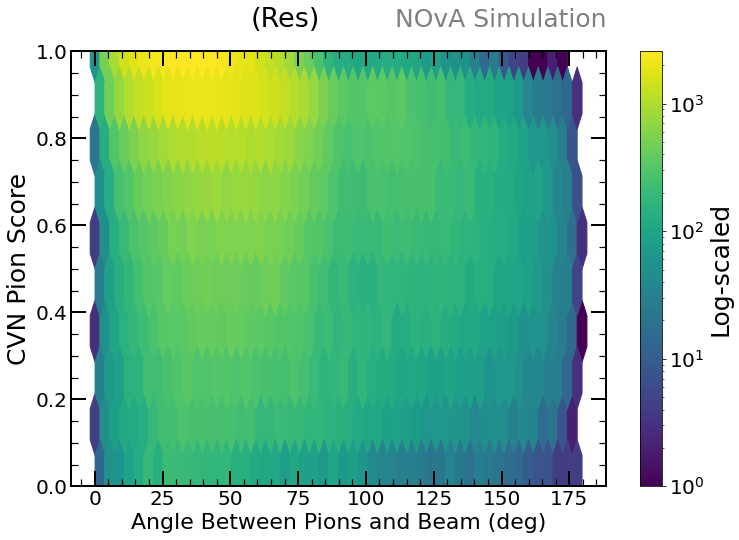

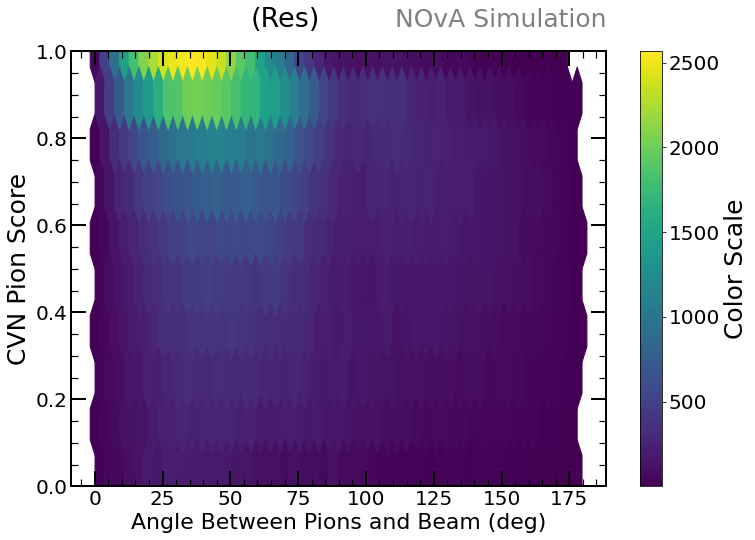

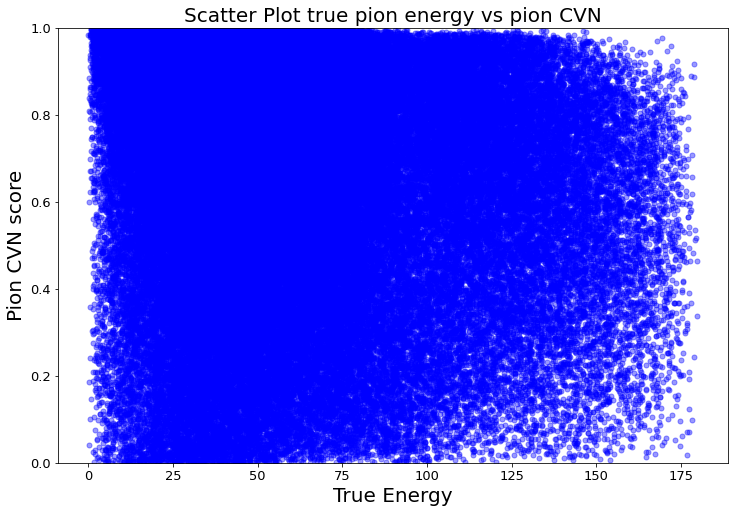

In [104]:
cvn_hb = np.array(cvn)
theta_hb = np.array(theta)

plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(theta_hb, cvn_hb, gridsize=50, cmap='viridis', mincnt=1, norm=mcolors.LogNorm())

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Log-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Angle Between Pions and Beam (deg)', fontsize=22)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.savefig(f"{folder}/analysisfiles/images/heatmap_cvn_vs_theta_logscaled_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()


plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(theta_hb, cvn_hb, gridsize=50, cmap='viridis', mincnt=1)

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Color Scale', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Angle Between Pions and Beam (deg)', fontsize=22)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.savefig(f"{folder}/analysisfiles/images/heatmap_cvn_vs_theta_normal_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()


plt.figure(figsize=(12, 8)) 

plt.scatter(theta, cvn, color='blue', marker='.', s=100, alpha=0.4)
plt.xlabel('True Energy',fontsize=20)
plt.ylabel('Pion CVN score',fontsize=20)
plt.title('Scatter Plot true pion energy vs pion CVN',fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.ylim(0,1)
# plt.savefig(f"{folder}/analysisfiles/images/scatter_Et_CVN_part1.png")
plt.show()


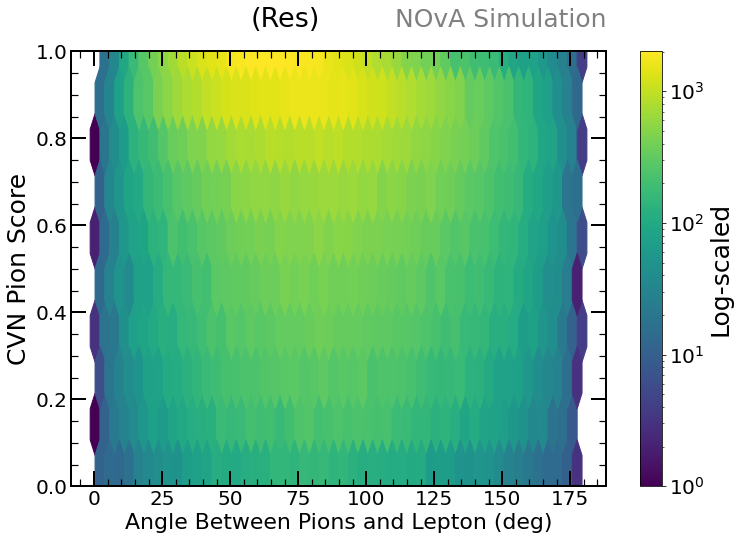

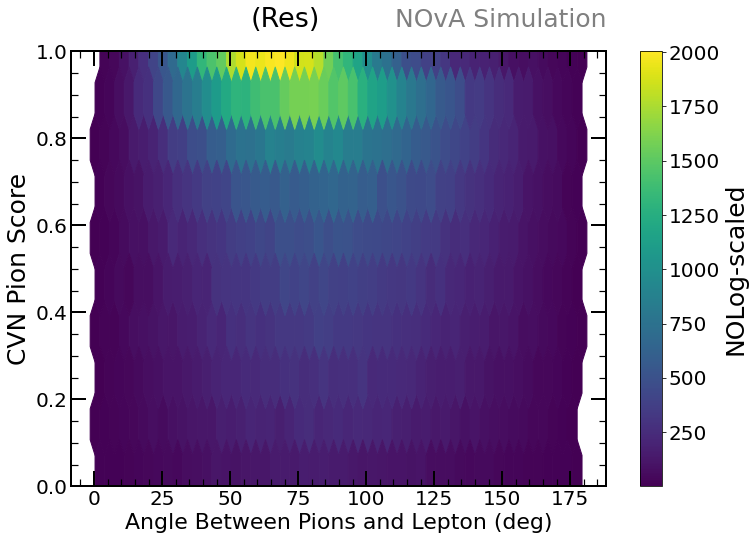

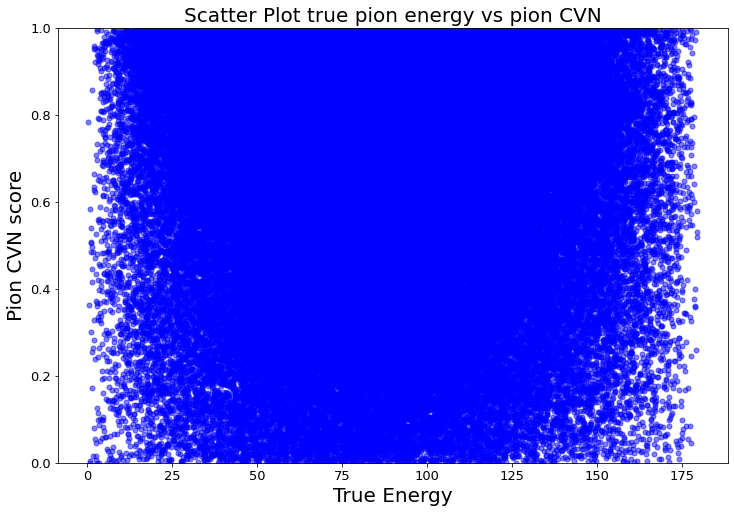

In [105]:
cvn_hb = np.array(cvn)
alpha_hb = np.array(alpha)

plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data #Blues
hb = plt.hexbin(alpha_hb, cvn_hb, gridsize=50, cmap='viridis', mincnt=1, norm=mcolors.LogNorm())

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Log-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Angle Between Pions and Lepton (deg)', fontsize=22)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.savefig(f"{folder}/analysisfiles/images/heatmap_cvn_vs_alpha_logscaled_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()


plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(alpha_hb, cvn_hb, gridsize=50, cmap='viridis', mincnt=1)

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('NOLog-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Angle Between Pions and Lepton (deg)', fontsize=22)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.savefig(f"{folder}/analysisfiles/images/heatmap_cvn_vs_alpha_normal_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()



plt.figure(figsize=(12, 8)) 

plt.scatter(alpha, cvn, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('True Energy',fontsize=20)
plt.ylabel('Pion CVN score',fontsize=20)
plt.title('Scatter Plot true pion energy vs pion CVN',fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.ylim(0,1)
# plt.savefig(f"{folder}/analysisfiles/images/scatter_Et_CVN_part1.png")
plt.show()

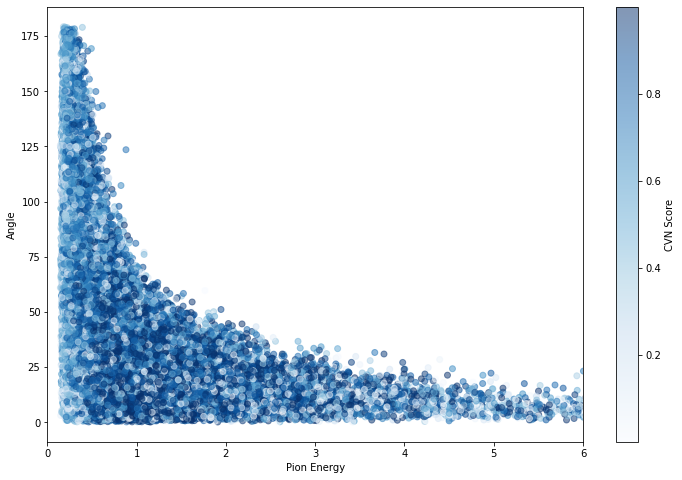

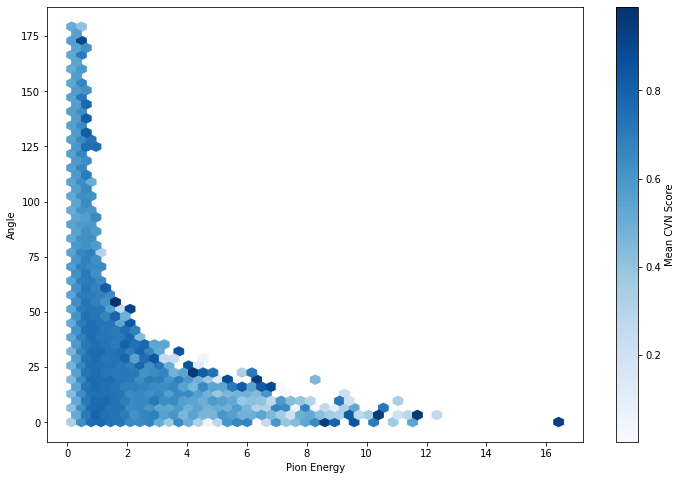

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
pion_energy = np.array(calenergies)
cvn_score = np.array(cvn)
angle = np.array(theta)

# Create a mask for cvn_score values >= 0
mask = cvn_score >= 0

# Apply the mask to all arrays
pion_energy = pion_energy[mask]
cvn_score = cvn_score[mask]
angle = angle[mask]

plt.figure(figsize=(12, 8))
plt.scatter(pion_energy, angle, c=cvn_score, cmap='Blues',alpha=0.5)
plt.colorbar(label='CVN Score')  # Update label to 'CVN Score' to match the actual variable
plt.xlabel('Pion Energy')
plt.ylabel('Angle')  # Update label to 'Angle' to match the actual variable
plt.xlim(0,6)
plt.show()

plt.figure(figsize=(12, 8))
plt.hexbin(pion_energy, angle, C=cvn_score, gridsize=50, cmap='Blues')
plt.colorbar(label='Mean CVN Score')
plt.xlabel('Pion Energy')
plt.ylabel('Angle')
plt.show()


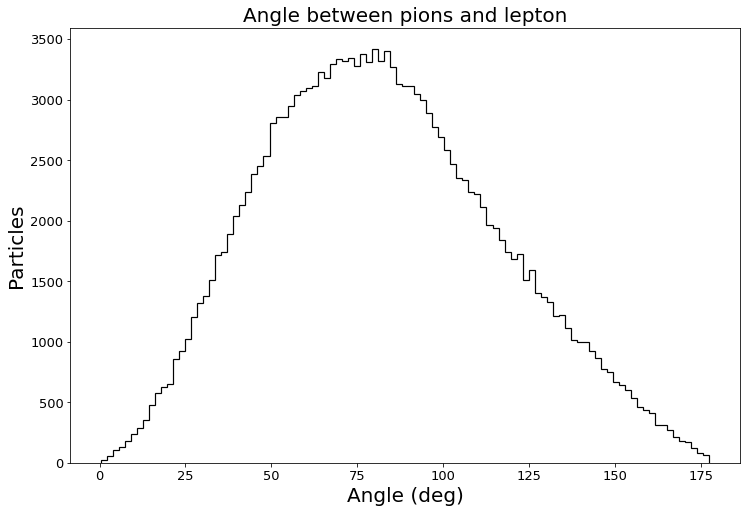

In [72]:
plt.figure(figsize=(12, 8)) 
plt.hist(alpha, bins=autobins(alpha), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Angle (deg)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title('Angle between pions and lepton', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/alpha_part1.png")
plt.show()

In [3]:
#here is being plotted the angle distributions according to the energy range, so in each plot, corresponding to each of the five energy ranges, there must be the 
#distribution for reco and unreco for DIS and Res

#take the 4 values 
#Res
folder='Res'

temp=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part1')
energiesres1=[]
energiesres1=[float(element)-0.138 for sublist in temp for element in sublist] 

temp=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part2')
energiesres2=[]
energiesres2=[float(element)-0.138 for sublist in temp for element in sublist] 

temp=[]
temp=read_file(folder, 'analysisfiles/theta_part1')
thetares1=[]
thetares1 = [float(element)*(180 / math.pi) for sublist in temp for element in sublist]


temp=[]
temp=read_file(folder, 'analysisfiles/theta_part2')
thetares2=[]
thetares2 = [float(element)*(180 / math.pi) for sublist in temp for element in sublist]



temp=[]
temp=read_file(folder, 'analysisfiles/alpha_part1')
alphares1=[]
for event in temp:
    l = len(event)
    num =int(l/3)-1
    mm=0
    for i in range(num):
        mm=mm+3
        vector1 = np.array([float(event[0]), float(event[1]), float(event[2])])
        vector2 = np.array([float(event[mm]), float(event[mm+1]), float(event[mm+2])])
        dot_product = np.dot(vector1, vector2)
        magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
        cosine_theta = dot_product / magnitude_product
        #save the cosine
        #alpha.append(cosine_theta)
        angle_radians = np.arccos(cosine_theta)
        degrees_angle = angle_radians * (180 / math.pi)
        #alpha.append(angle_radians)
        alphares1.append(degrees_angle)

temp=[]
temp=read_file(folder, 'analysisfiles/alpha_part2')
alphares2=[]
for event in temp:
    l = len(event)
    num =int(l/3)-1
    mm=0
    for i in range(num):
        mm=mm+3
        vector1 = np.array([float(event[0]), float(event[1]), float(event[2])])
        vector2 = np.array([float(event[mm]), float(event[mm+1]), float(event[mm+2])])
        dot_product = np.dot(vector1, vector2)
        magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
        cosine_theta = dot_product / magnitude_product
        #save the cosine
        #alpha.append(cosine_theta)
        angle_radians = np.arccos(cosine_theta)
        degrees_angle = angle_radians * (180 / math.pi)
        #alpha.append(angle_radians)
        alphares2.append(degrees_angle)


folder='DIS'

temp=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part1')
energiesdis1=[]
energiesdis1=[float(element)-0.138 for sublist in temp for element in sublist] 

temp=[]
temp=read_file(folder, 'analysisfiles/energiesNT_part2')
energiesdis2=[]
energiesdis2=[float(element)-0.138 for sublist in temp for element in sublist] 

temp=[]
temp=read_file(folder, 'analysisfiles/theta_part1')
thetadis1=[]
thetadis1 = [float(element)*(180 / math.pi) for sublist in temp for element in sublist]


temp=[]
temp=read_file(folder, 'analysisfiles/theta_part2')
thetadis2=[]
thetadis2 = [float(element)*(180 / math.pi) for sublist in temp for element in sublist]


temp=[]
temp=read_file(folder, 'analysisfiles/alpha_part1')
alphadis1=[]
for event in temp:
    l = len(event)
    num =int(l/3)-1
    mm=0
    for i in range(num):
        mm=mm+3
        vector1 = np.array([float(event[0]), float(event[1]), float(event[2])])
        vector2 = np.array([float(event[mm]), float(event[mm+1]), float(event[mm+2])])
        dot_product = np.dot(vector1, vector2)
        magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
        cosine_theta = dot_product / magnitude_product
        #save the cosine
        #alpha.append(cosine_theta)
        angle_radians = np.arccos(cosine_theta)
        degrees_angle = angle_radians * (180 / math.pi)
        #alpha.append(angle_radians)
        alphadis1.append(degrees_angle)

temp=[]
temp=read_file(folder, 'analysisfiles/alpha_part2')
alphadis2=[]
for event in temp:
    l = len(event)
    num =int(l/3)-1
    mm=0
    for i in range(num):
        mm=mm+3
        vector1 = np.array([float(event[0]), float(event[1]), float(event[2])])
        vector2 = np.array([float(event[mm]), float(event[mm+1]), float(event[mm+2])])
        dot_product = np.dot(vector1, vector2)
        magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
        cosine_theta = dot_product / magnitude_product
        #save the cosine
        #alpha.append(cosine_theta)
        angle_radians = np.arccos(cosine_theta)
        degrees_angle = angle_radians * (180 / math.pi)
        #alpha.append(angle_radians)
        alphadis2.append(degrees_angle)

            
#after that, lets see how is the behavior of the cvn values with respect to ranges of energy.

energy_ranges = [(0, 0.2), (0.2, 0.5), (0.5, 1.0), (1.0, 1.5), (1.5, 2.0)]

# Initialize a list to store filtered angles for each energy range
alphasres1 = [[] for _ in range(len(energy_ranges))] 
alphasres2 = [[] for _ in range(len(energy_ranges))] 
thetasres1 = [[] for _ in range(len(energy_ranges))]
thetasres2 = [[] for _ in range(len(energy_ranges))]

alphasdis1 = [[] for _ in range(len(energy_ranges))] 
alphasdis2 = [[] for _ in range(len(energy_ranges))] 
thetasdis1 = [[] for _ in range(len(energy_ranges))]
thetasdis2 = [[] for _ in range(len(energy_ranges))]



#now fill for 4 cases
for j, event in enumerate(energiesres1):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphasres1[i].append(alphares1[j])
            thetasres1[i].append(thetares1[j])

for j, event in enumerate(energiesres2):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphasres2[i].append(alphares2[j])
            thetasres2[i].append(thetares2[j])

for j, event in enumerate(energiesdis1):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphasdis1[i].append(alphadis1[j])
            thetasdis1[i].append(thetadis1[j])

for j, event in enumerate(energiesdis2):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphasdis2[i].append(alphadis2[j])
            thetasdis2[i].append(thetadis2[j])


print('finished')


finished


Area of histogram for DIS (U) in energy range (0 - 0.2) GeV: 355126.78112193244
Area of histogram for Res (U) in energy range (0 - 0.2) GeV: 471946.5664621647
Area of histogram for DIS (R) in energy range (0 - 0.2) GeV: 103691.29348522057
Area of histogram for Res (R) in energy range (0 - 0.2) GeV: 167908.49383503915


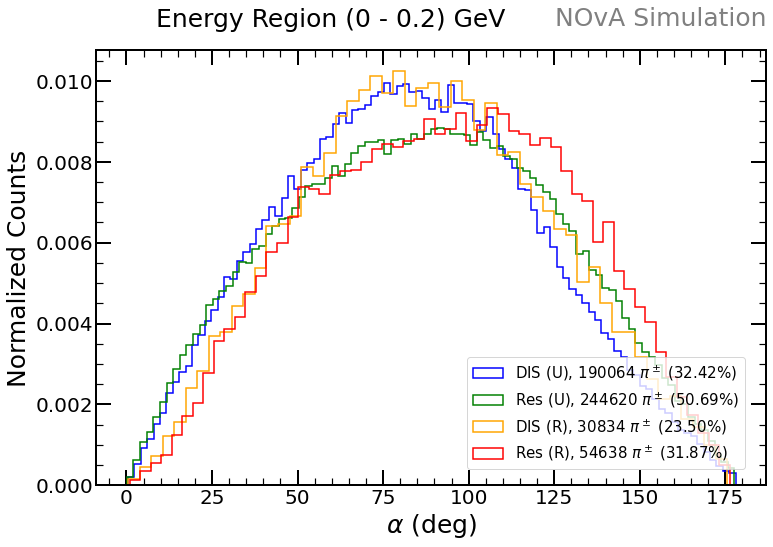

Area of histogram for DIS (U) in energy range (0.2 - 0.5) GeV: 294495.86902708997
Area of histogram for Res (U) in energy range (0.2 - 0.5) GeV: 291116.5714585116
Area of histogram for DIS (R) in energy range (0.2 - 0.5) GeV: 128125.63486634061
Area of histogram for Res (R) in energy range (0.2 - 0.5) GeV: 167823.01842403846


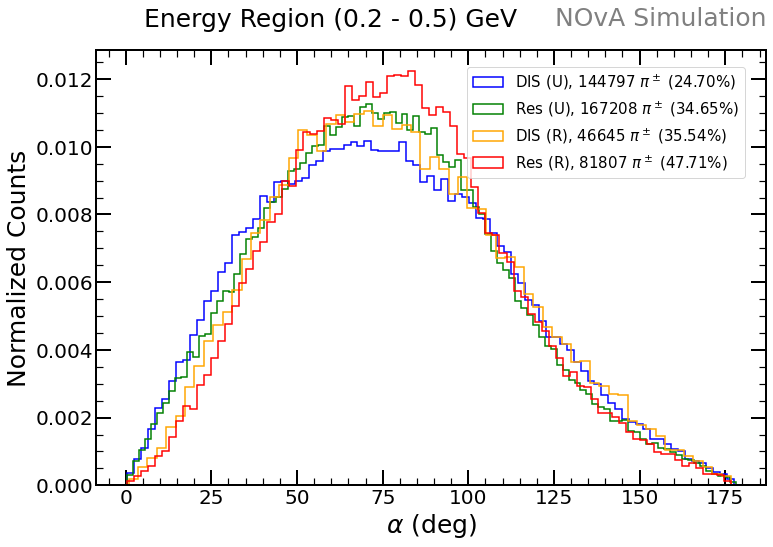

Area of histogram for DIS (U) in energy range (0.5 - 1.0) GeV: 251730.71597049953
Area of histogram for Res (U) in energy range (0.5 - 1.0) GeV: 132387.36200615083
Area of histogram for DIS (R) in energy range (0.5 - 1.0) GeV: 96406.27380846371
Area of histogram for Res (R) in energy range (0.5 - 1.0) GeV: 77185.4569335638


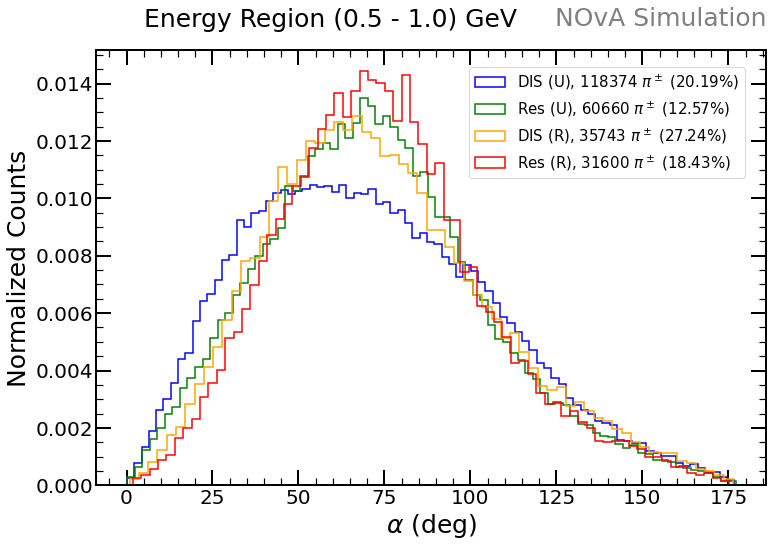

Area of histogram for DIS (U) in energy range (1.0 - 1.5) GeV: 150127.6977222469
Area of histogram for Res (U) in energy range (1.0 - 1.5) GeV: 31424.912009326355
Area of histogram for DIS (R) in energy range (1.0 - 1.5) GeV: 41006.224427225556
Area of histogram for Res (R) in energy range (1.0 - 1.5) GeV: 15739.559859900599


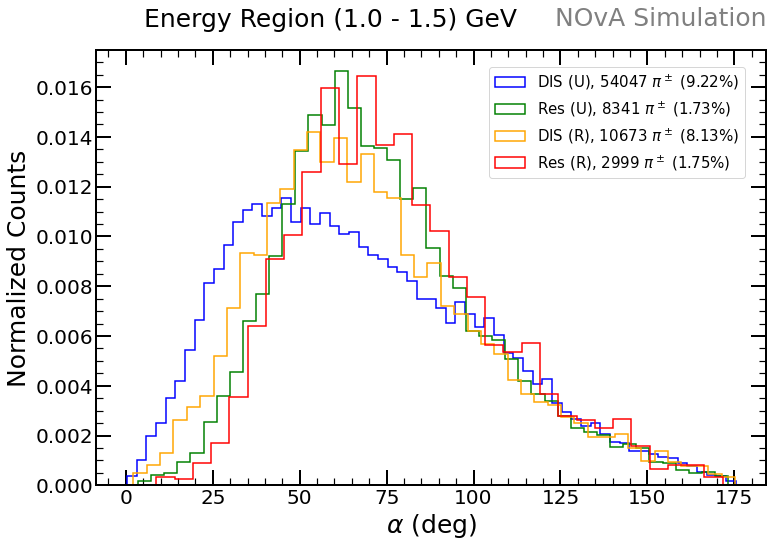

Area of histogram for DIS (U) in energy range (1.5 - 2.0) GeV: 98464.91381552852
Area of histogram for Res (U) in energy range (1.5 - 2.0) GeV: 9012.195698461388
Area of histogram for DIS (R) in energy range (1.5 - 2.0) GeV: 21281.47695264896
Area of histogram for Res (R) in energy range (1.5 - 2.0) GeV: 3983.9624456304036


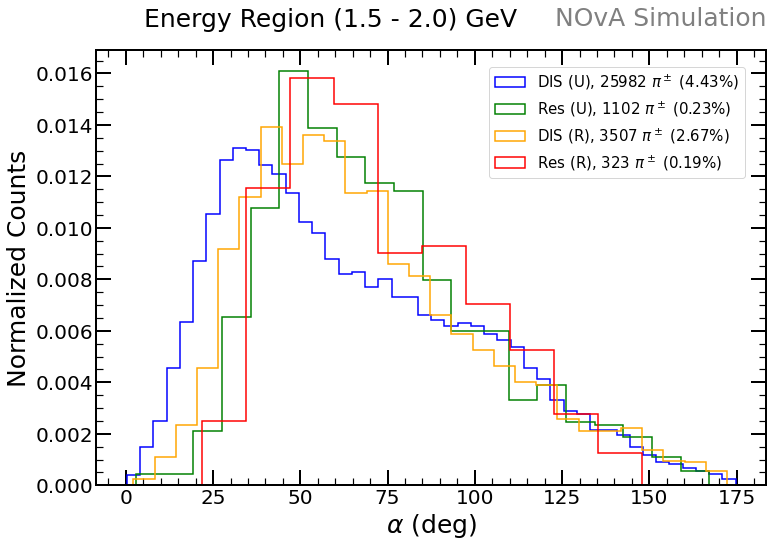

In [9]:
import matplotlib.pyplot as plt
import numpy as np

def histogram_area(data, bin_edges):
    hist, _ = np.histogram(data, bins=bin_edges)
    area = np.sum(hist * np.diff(bin_edges))
    return area

colors = {
    'DIS (U)': 'blue',
    'Res (U)': 'green',
    'DIS (R)': 'orange',
    'Res (R)': 'red'
}

lens = {
    'DIS (U)': len(alphadis2),
    'Res (U)': len(alphares2),
    'DIS (R)': len(alphadis1),
    'Res (R)': len(alphares1)
}

for i, (start, end) in enumerate(energy_ranges):
    plt.figure(figsize=(12, 8)) 

    # Define your datasets
    datasets = [
        (alphasdis2[i], 'DIS (U)'),
        (alphasres2[i], 'Res (U)'),
        (alphasdis1[i], 'DIS (R)'),
        (alphasres1[i], 'Res (R)')
    ]

    # Plot histograms in their original order
    for data, label in datasets:
        weights = np.ones_like(data) / len(data)
        bin_edges = autobins(data)
        percentage = len(data) * 100 / lens[label]
        plt.hist(data, bins=bin_edges, edgecolor=colors[label], linewidth=1.5, histtype='step', label=fr'{label}, {len(data)} $\pi^\pm$ ({percentage:.2f}%)', color=colors[label], density=True)  # Add weights if needed
        area = histogram_area(data, bin_edges)
        print(f'Area of histogram for {label} in energy range ({start} - {end}) GeV: {area}')

    plt.xlabel(fr'$\alpha$ (deg)', fontsize=25)
    plt.ylabel('Normalized Counts', fontsize=25)
    plt.xticks(fontsize=13) 
    plt.yticks(fontsize=13)
    plt.legend(fontsize=15, loc='upper right', bbox_to_anchor=(0.98, 0.98))
    if i == 0:
        plt.legend(fontsize=15, loc='lower right', bbox_to_anchor=(0.98, 0.02))
    set_plot_style()
#     set_sn2()
    plt.title(f'Energy Region ({start} - {end}) GeV', x=0.35, y=1.04, fontsize=25)
    # plt.yscale('log')
    # plt.savefig(f"{folder}/analysisfiles/images/alpha_angle_Erange_{start}_to_{end}_part1.png")
    plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/alpha_angle_new_in_{start}_{end}_part1_2_v2.png', bbox_inches='tight')
#     plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/alpha_angle_new_in_{start}_{end}_part1_2.png", bbox_inches='tight')
    plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/alpha_angle_new_in_0_0.2_part1_2.png'

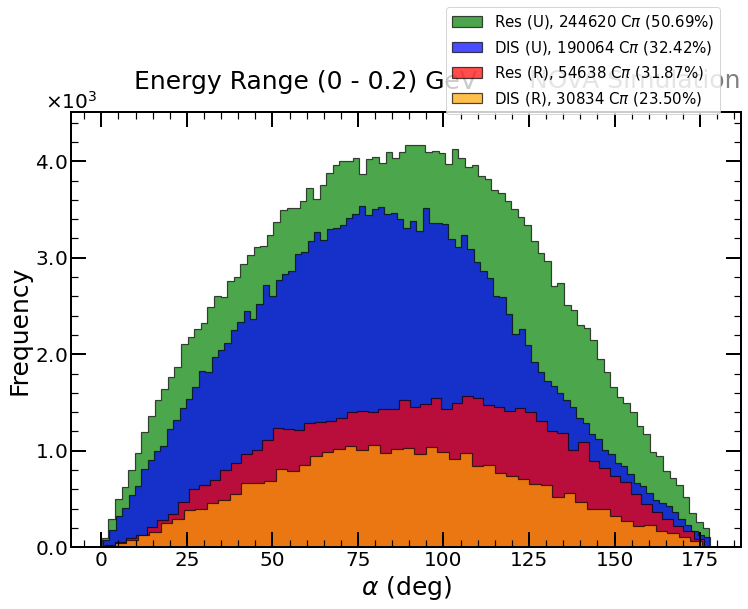

In [6]:
def histogram_area(data, bin_edges):
    hist, _ = np.histogram(data, bins=bin_edges)
    area = np.sum(hist * np.diff(bin_edges))
    return area


colors = {
    'DIS (U)': 'blue',
    'Res (U)': 'green',
    'DIS (R)': 'orange',
    'Res (R)': 'red'
}

lens = {
    'DIS (U)': len(alphadis2),
    'Res (U)': len(alphares2),
    'DIS (R)': len(alphadis1),
    'Res (R)': len(alphares1)
}

for i, (start, end) in enumerate(energy_ranges):
    plt.figure(figsize=(12, 8)) 

    # Define your datasets
    datasets = [
        (alphasdis2[i], 'DIS (U)'),
        (alphasres2[i], 'Res (U)'),
        (alphasdis1[i], 'DIS (R)'),
        (alphasres1[i], 'Res (R)')
    ]

    # Compute the area for each histogram
    areas = []
    for data, label in datasets:
        bin_edges = autobins(data)
        area = histogram_area(data, bin_edges)
        areas.append((area, data, bin_edges, label))

    # Sort datasets by area in descending order
    areas.sort(reverse=True, key=lambda x: x[0])

    # Plot histograms in descending order of their areas
    for area, data, bin_edges, label in areas:
        percentage = len(data) * 100 / lens[label]
        plt.hist(data, bins=bin_edges, edgecolor='black', linewidth=1.2, alpha=0.7, histtype='stepfilled', label=fr'{label}, {len(data)} C$\pi$ ({percentage:.2f}%)', color=colors[label])


    plt.xlabel(fr'$\alpha$ (deg)', fontsize=25)
    plt.ylabel('Frequency', fontsize=25)
    plt.xticks(fontsize=13) 
    plt.yticks(fontsize=13)
    plt.legend(fontsize=15, loc='upper right', bbox_to_anchor=(0.98, 0.98))
    set_plot_style()
    set_sn2()
    plt.title(f'Energy Range ({start} - {end}) GeV',x=0.35,y=1.04, fontsize=25)
    # plt.yscale('log')
    # plt.savefig(f"{folder}/analysisfiles/images/alpha_angle_Erange_{start}_to_{end}_part1.png")
    #plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/alpha_angle_new_in_{start}_{end}_part1_2.png', bbox_inches='tight')
    plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/alpha_angle_new_in_{start}_{end}_part1_2.png", bbox_inches='tight')
    plt.show()



Area of histogram for DIS (U) in energy range (0 - 0.2) GeV: 400733.69301487465
Area of histogram for Res (U) in energy range (0 - 0.2) GeV: 418986.9781684561
Area of histogram for DIS (R) in energy range (0 - 0.2) GeV: 131278.06612316176
Area of histogram for Res (R) in energy range (0 - 0.2) GeV: 174740.718210102


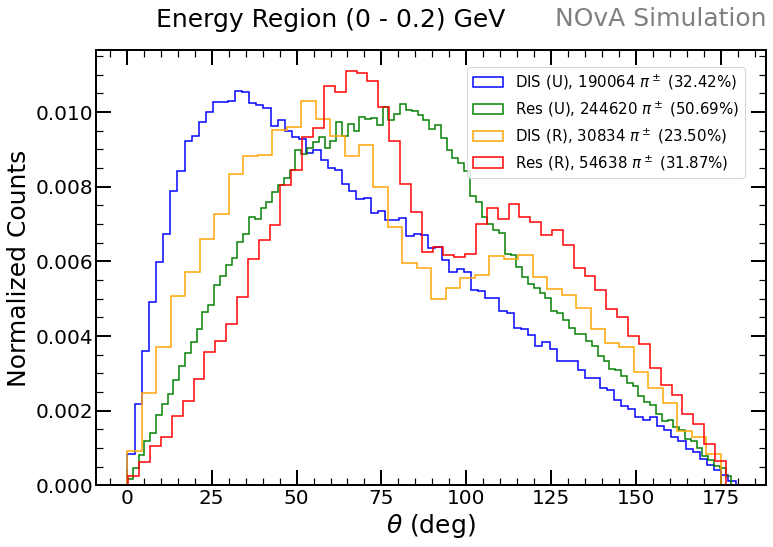

Area of histogram for DIS (U) in energy range (0.2 - 0.5) GeV: 172111.47155913268
Area of histogram for Res (U) in energy range (0.2 - 0.5) GeV: 197569.4960466468
Area of histogram for DIS (R) in energy range (0.2 - 0.5) GeV: 96980.85209508288
Area of histogram for Res (R) in energy range (0.2 - 0.5) GeV: 122518.4718814318


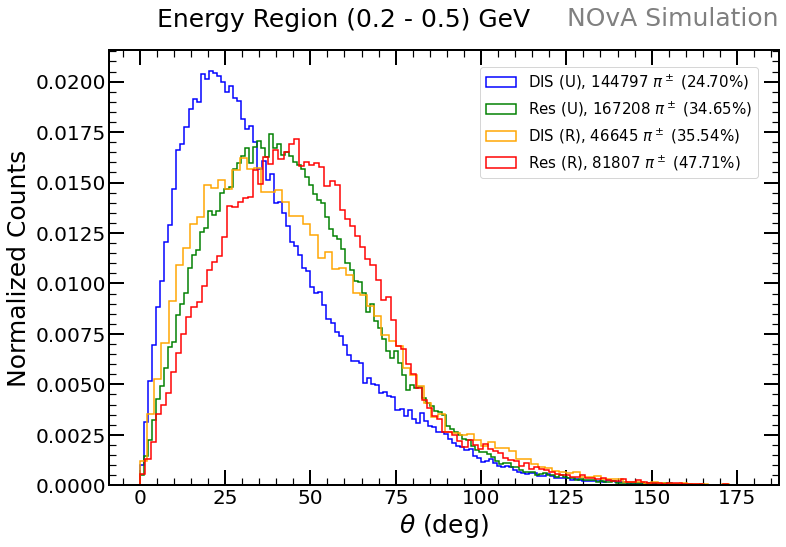

Area of histogram for DIS (U) in energy range (0.5 - 1.0) GeV: 96266.15609255616
Area of histogram for Res (U) in energy range (0.5 - 1.0) GeV: 66540.21186899707
Area of histogram for DIS (R) in energy range (0.5 - 1.0) GeV: 56471.09559564301
Area of histogram for Res (R) in energy range (0.5 - 1.0) GeV: 45658.49098468457


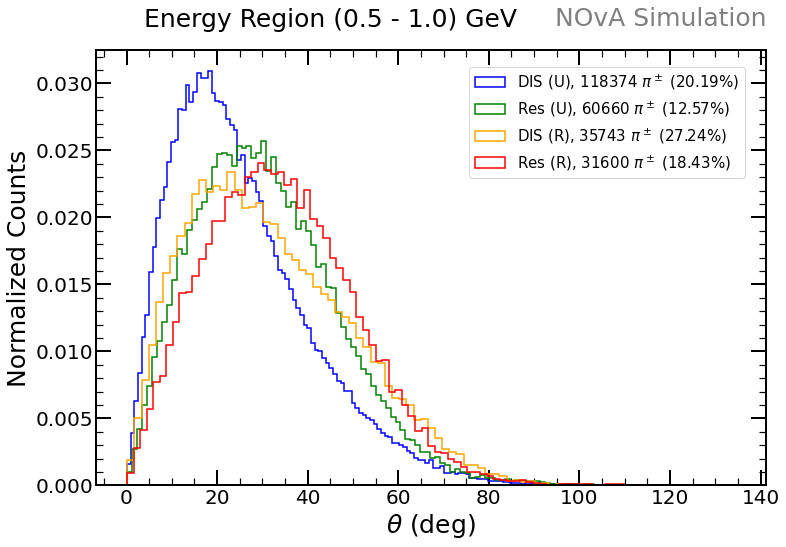

Area of histogram for DIS (U) in energy range (1.0 - 1.5) GeV: 39993.955610142104
Area of histogram for Res (U) in energy range (1.0 - 1.5) GeV: 11877.384354771504
Area of histogram for DIS (R) in energy range (1.0 - 1.5) GeV: 16439.31318956215
Area of histogram for Res (R) in energy range (1.0 - 1.5) GeV: 6215.926824926239


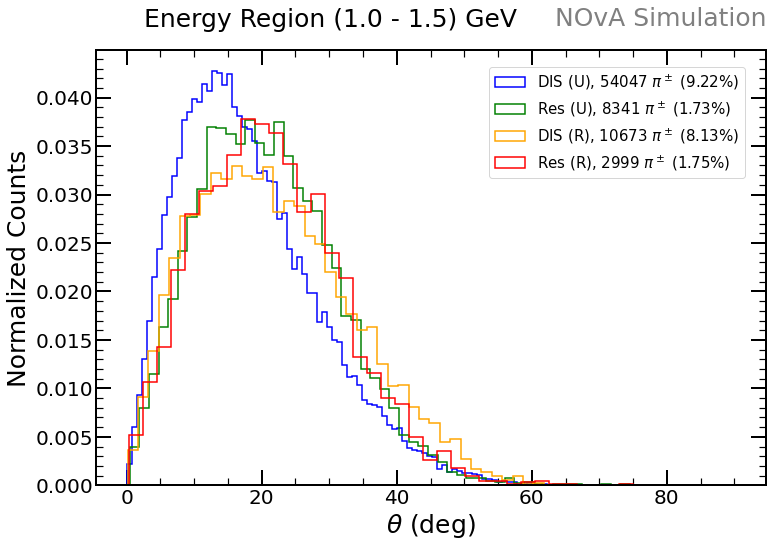

Area of histogram for DIS (U) in energy range (1.5 - 2.0) GeV: 18645.678468580707
Area of histogram for Res (U) in energy range (1.5 - 2.0) GeV: 2742.630200175424
Area of histogram for DIS (R) in energy range (1.5 - 2.0) GeV: 5803.274426481563
Area of histogram for Res (R) in energy range (1.5 - 2.0) GeV: 1424.4335407276633


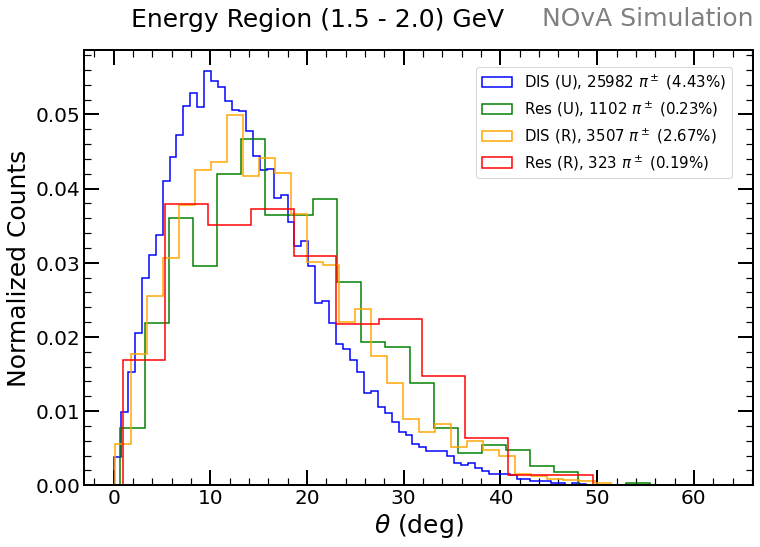

In [10]:
import matplotlib.pyplot as plt
import numpy as np

def histogram_area(data, bin_edges):
    hist, _ = np.histogram(data, bins=bin_edges)
    area = np.sum(hist * np.diff(bin_edges))
    return area

colors = {
    'DIS (U)': 'blue',
    'Res (U)': 'green',
    'DIS (R)': 'orange',
    'Res (R)': 'red'
}

lens = {
    'DIS (U)': len(thetadis2),
    'Res (U)': len(thetares2),
    'DIS (R)': len(thetadis1),
    'Res (R)': len(thetares1)
}

for i, (start, end) in enumerate(energy_ranges):
    plt.figure(figsize=(12, 8)) 

    # Define your datasets
    datasets = [
        (thetasdis2[i], 'DIS (U)'),
        (thetasres2[i], 'Res (U)'),
        (thetasdis1[i], 'DIS (R)'),
        (thetasres1[i], 'Res (R)')
    ]

    # Plot histograms in their original order
    for data, label in datasets:
        weights = np.ones_like(data) / len(data)
        bin_edges = autobins(data)
        percentage = len(data) * 100 / lens[label]
        plt.hist(data, bins=bin_edges, edgecolor=colors[label], linewidth=1.5, histtype='step', label=fr'{label}, {len(data)} $\pi^\pm$ ({percentage:.2f}%)', color=colors[label], density=True)  # Add weights if needed
        area = histogram_area(data, bin_edges)
        print(f'Area of histogram for {label} in energy range ({start} - {end}) GeV: {area}')

    plt.xlabel(fr'$\theta$ (deg)', fontsize=25)
    plt.ylabel('Normalized Counts', fontsize=25)
    plt.xticks(fontsize=13) 
    plt.yticks(fontsize=13)
    plt.legend(fontsize=15, loc='upper right', bbox_to_anchor=(0.98, 0.98))
    set_plot_style()
#     set_sn2()
    plt.title(f'Energy Region ({start} - {end}) GeV', x=0.35, y=1.04, fontsize=25)
    # plt.yscale('log')
    # plt.savefig(f"{folder}/analysisfiles/images/alpha_angle_Erange_{start}_to_{end}_part1.png")
    plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/theta_angle_new_in_{start}_{end}_part1_2_v2.png', bbox_inches='tight')
#     plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/alpha_angle_new_in_{start}_{end}_part1_2.png", bbox_inches='tight')
    plt.show()


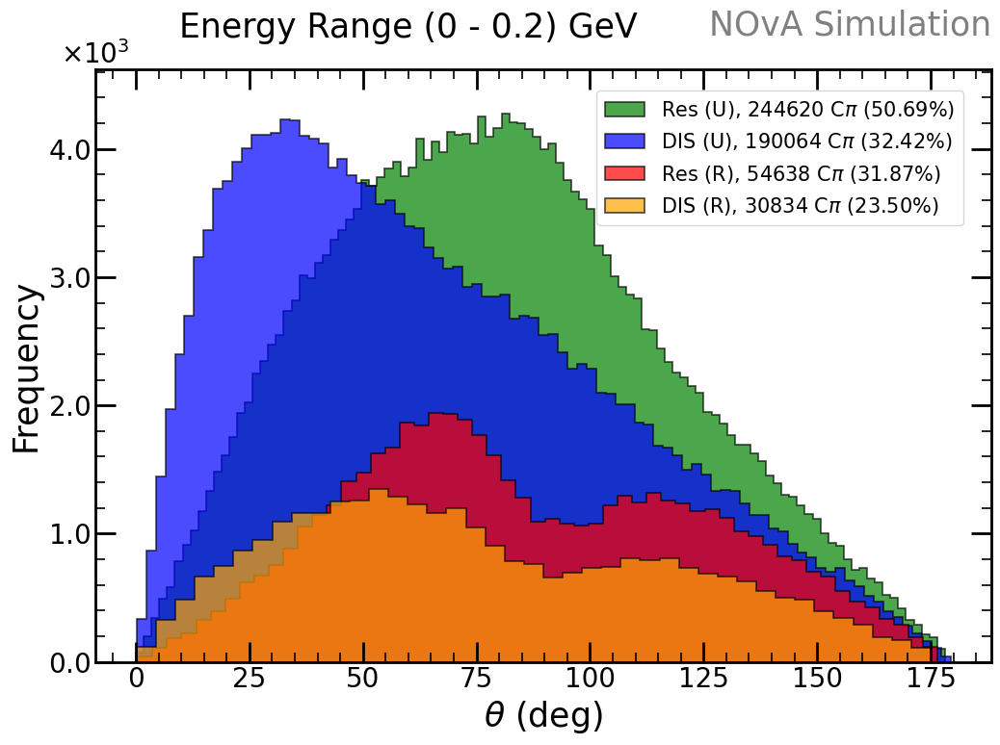

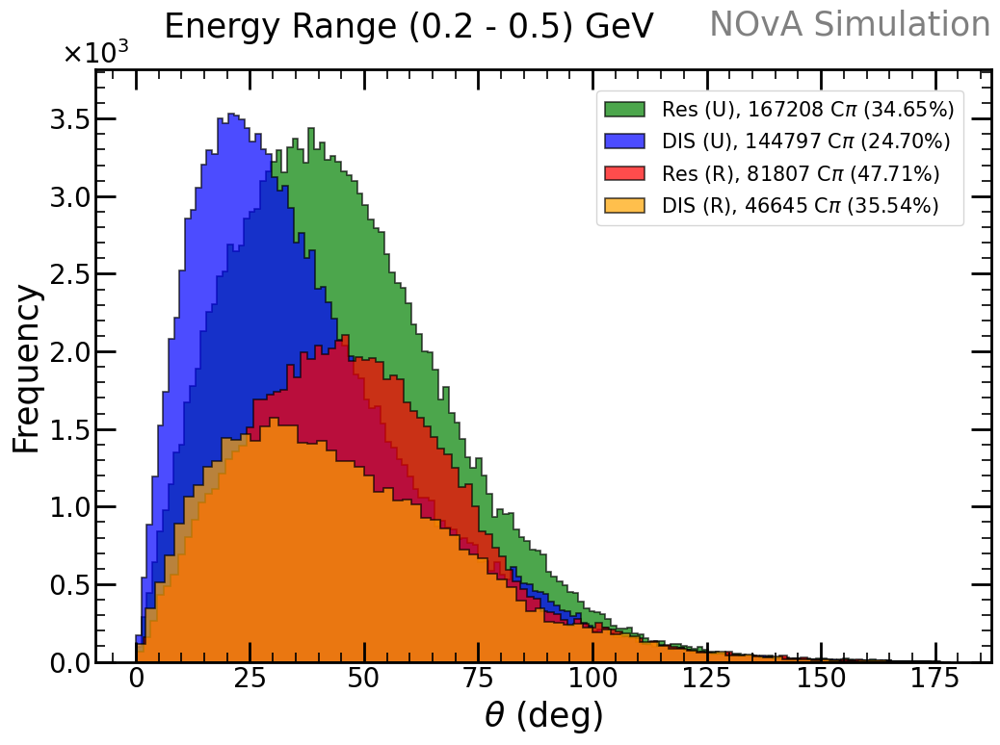

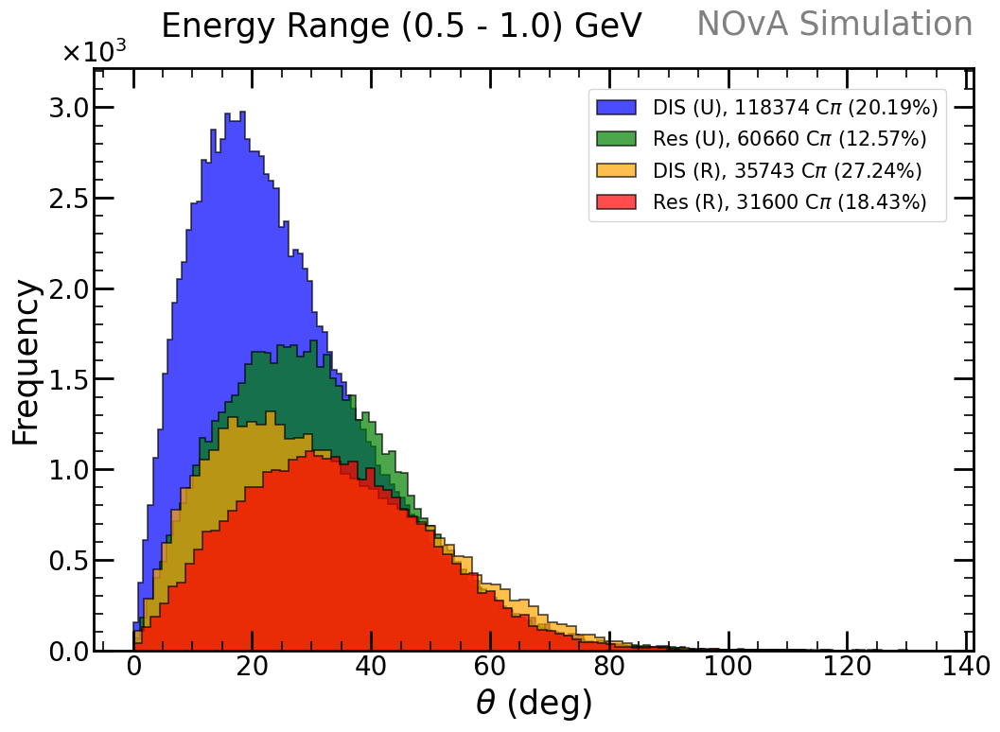

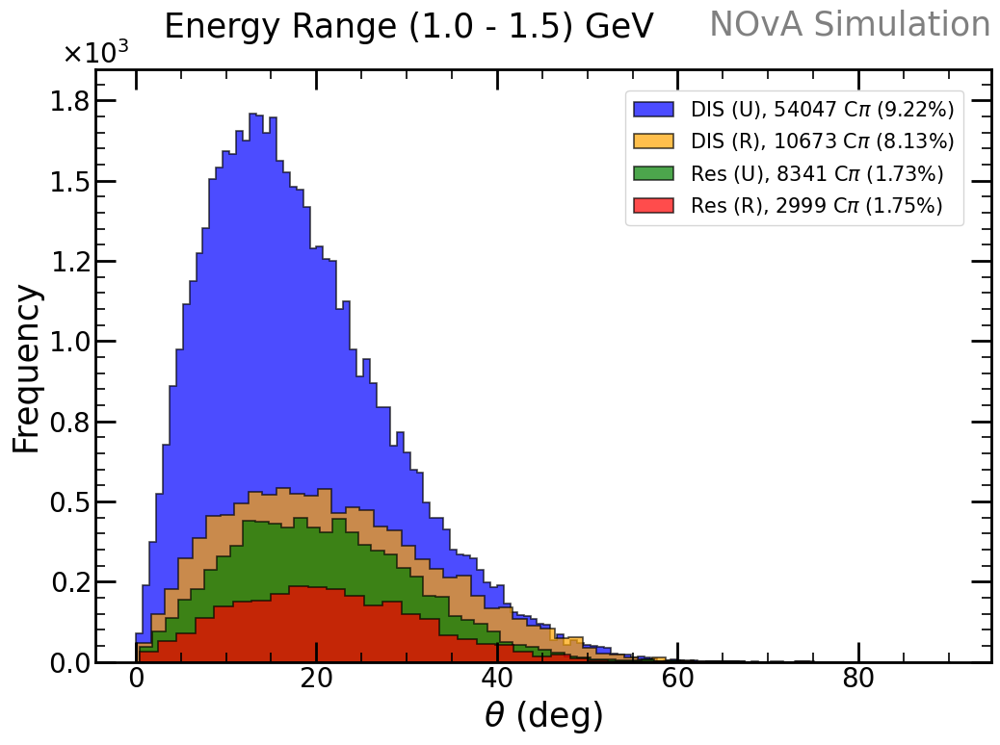

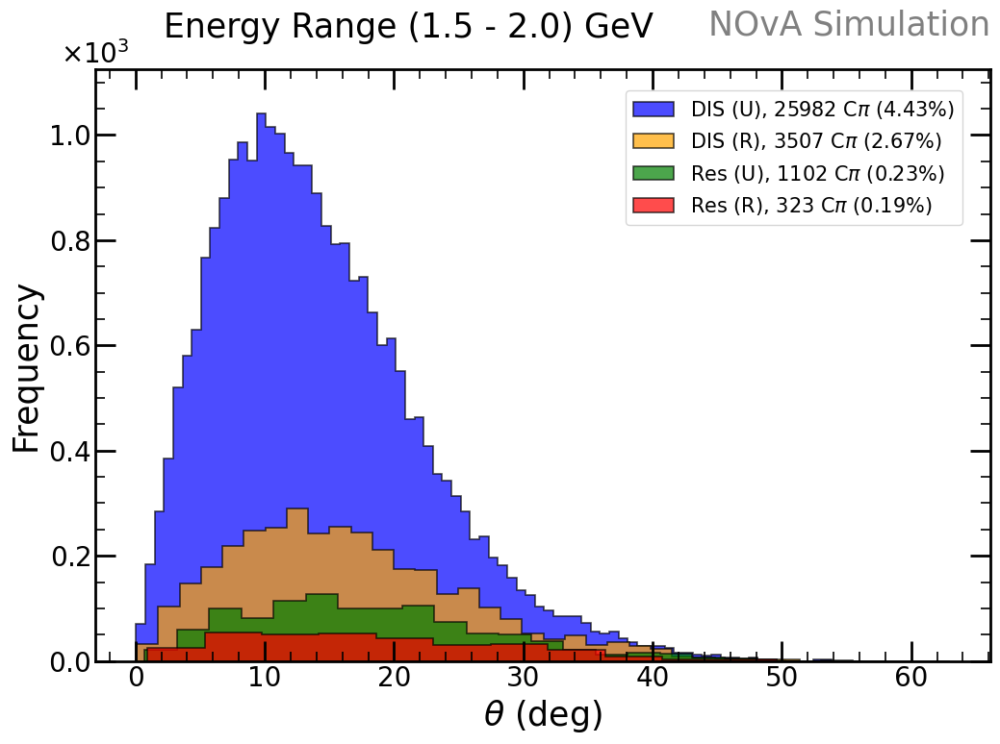

In [51]:
def histogram_area(data, bin_edges):
    hist, _ = np.histogram(data, bins=bin_edges)
    area = np.sum(hist * np.diff(bin_edges))
    return area


colors = {
    'DIS (U)': 'blue',
    'Res (U)': 'green',
    'DIS (R)': 'orange',
    'Res (R)': 'red'
}

lens = {
    'DIS (U)': len(thetadis2),
    'Res (U)': len(thetares2),
    'DIS (R)': len(thetadis1),
    'Res (R)': len(thetares1)
}

for i, (start, end) in enumerate(energy_ranges):
    plt.figure(figsize=(12, 8)) 

    # Define your datasets
    datasets = [
        (thetasdis2[i], 'DIS (U)'),
        (thetasres2[i], 'Res (U)'),
        (thetasdis1[i], 'DIS (R)'),
        (thetasres1[i], 'Res (R)')
    ]

    # Compute the area for each histogram
    areas = []
    for data, label in datasets:
        bin_edges = autobins(data)
        area = histogram_area(data, bin_edges)
        areas.append((area, data, bin_edges, label))

    # Sort datasets by area in descending order
    areas.sort(reverse=True, key=lambda x: x[0])

    # Plot histograms in descending order of their areas
    for area, data, bin_edges, label in areas:
        percentage = len(data) * 100 / lens[label]
        plt.hist(data, bins=bin_edges, edgecolor='black', linewidth=1.2, alpha=0.7, histtype='stepfilled', label=fr'{label}, {len(data)} C$\pi$ ({percentage:.2f}%)', color=colors[label])

    plt.xlabel(fr'$\theta$ (deg)', fontsize=25)
    plt.ylabel('Frequency', fontsize=25)
    plt.legend(fontsize=15, loc='upper right', bbox_to_anchor=(0.98, 0.98))
    set_plot_style()
    set_sn2()
    plt.title(f'Energy Range ({start} - {end}) GeV',x=0.35,y=1.04, fontsize=25)
    # plt.yscale('log')
    # plt.savefig(f"{folder}/analysisfiles/images/alpha_angle_Erange_{start}_to_{end}_part1.png")
    #plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/theta_angle_new_in_{start}_{end}_part1_2.png', bbox_inches='tight')
    plt.savefig(f"/Users/ASUS/Downloads/yo/FreezingMoonV/Chap5/theta_angle_new_in_{start}_{end}_part1_2.png", bbox_inches='tight')
    plt.show()

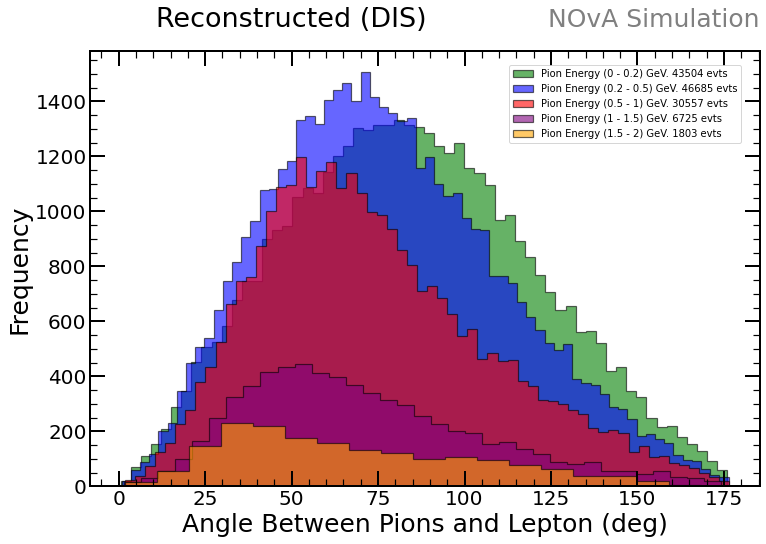

In [14]:
#bin_size = 0.025
#bin_edges = np.arange(0, 1, bin_size) 

# Define colors for each histogram
colors = ['green', 'blue', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12, 8))
combined_subplot = plt.subplot(111)
#hist_min = -2
#hist_max = 2
#num_bins = int((hist_max - hist_min) / bin_size)
#bin_edges = np.linspace(hist_min, hist_max, num_bins + 1)

# Sort the histograms based on their size
#sorted_indices = sorted(range(len(alphas)), key=lambda i: len(alphas[i]), reverse=True)
sorted_indices = range(len(alphas))
# Plot individual normalized histograms with specified colors in sorted order
for i in sorted_indices:
    plt.hist(alphas[i], bins=autobins(alphas[i]), edgecolor='black', linewidth=1.2, histtype='stepfilled', alpha=0.6, label=f'Pion Energy ({energy_ranges[i][0]} - {energy_ranges[i][1]}) GeV. {len(alphas[i])} evts', color=colors[i])

#change the number of ticks in the y axis
plt.locator_params(axis='y', nbins=6)
plt.xlabel('Angle Between Pions and Lepton (deg)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
plt.title(f'Reconstructed ({folder})',x=0.3,y=1.042, fontsize=27)
set_plot_style()
plt.legend(loc='upper right', bbox_to_anchor=(0.98, 0.98))
plt.savefig(f"{folder}/analysisfiles/images/alpha_angles_combined_energy_ranges_part1_{folder}.png", bbox_inches='tight')
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/alpha_angles_combined_energy_ranges_part1_{folder}.png', bbox_inches='tight')
plt.show()


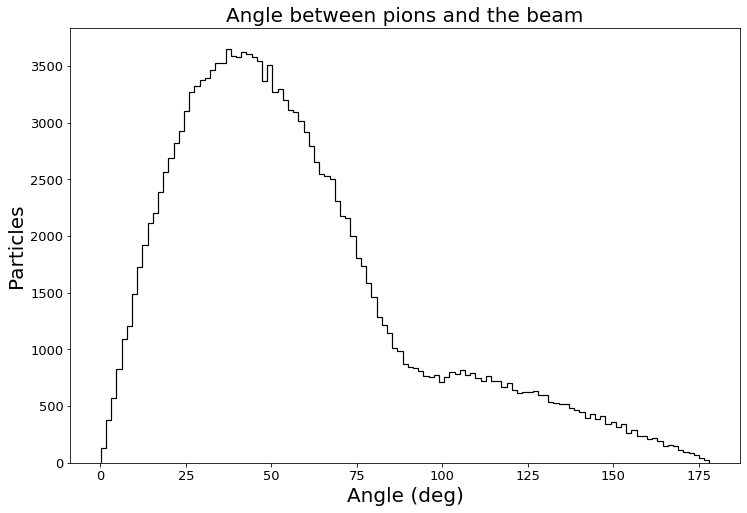

In [89]:
plt.figure(figsize=(12, 8)) 
plt.hist(theta, bins=autobins(theta), edgecolor='black', linewidth=1.2, histtype='step')
plt.xlabel('Angle (deg)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
plt.title('Angle between pions and the beam', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.savefig(f"{folder}/analysisfiles/images/theta_part1.png")
plt.show()

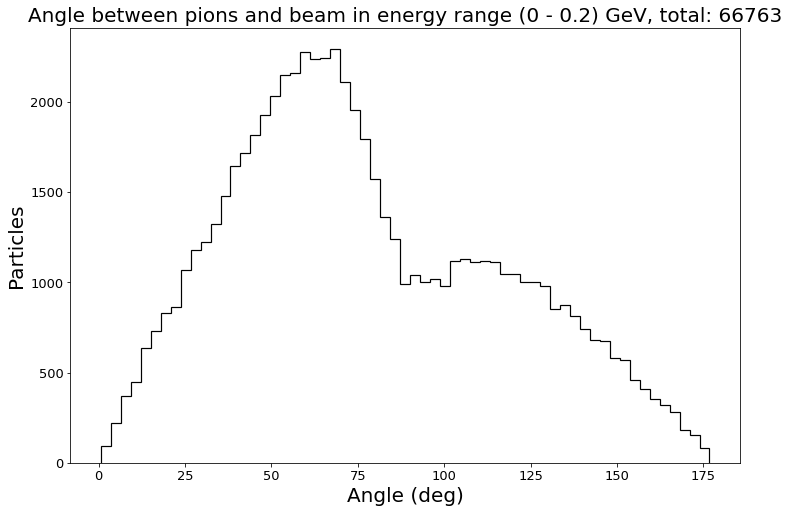

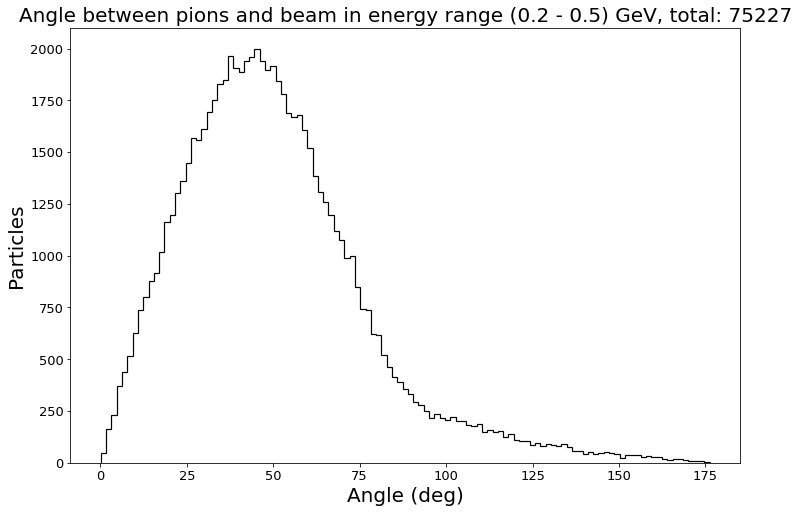

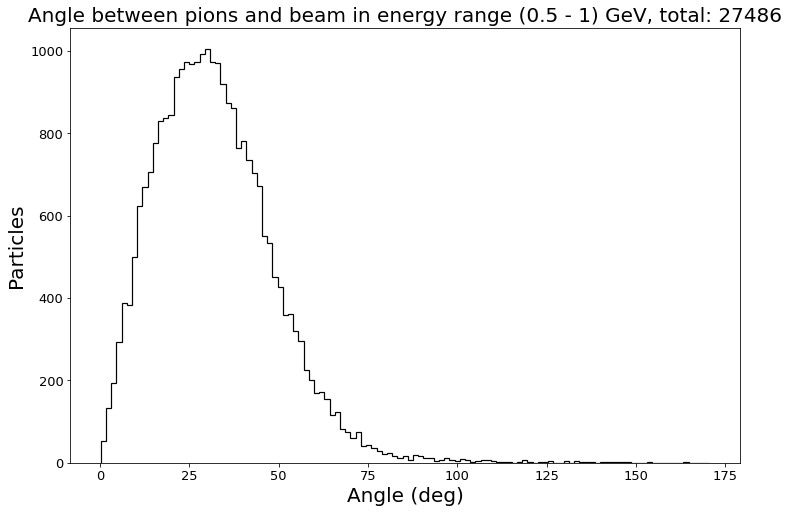

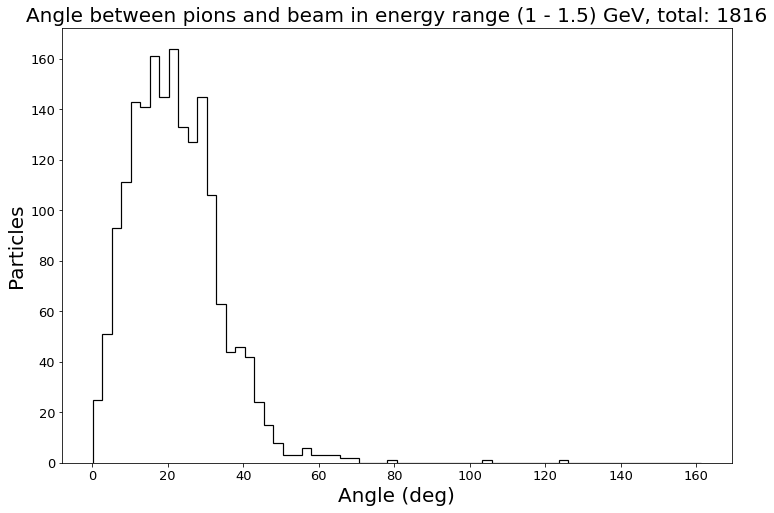

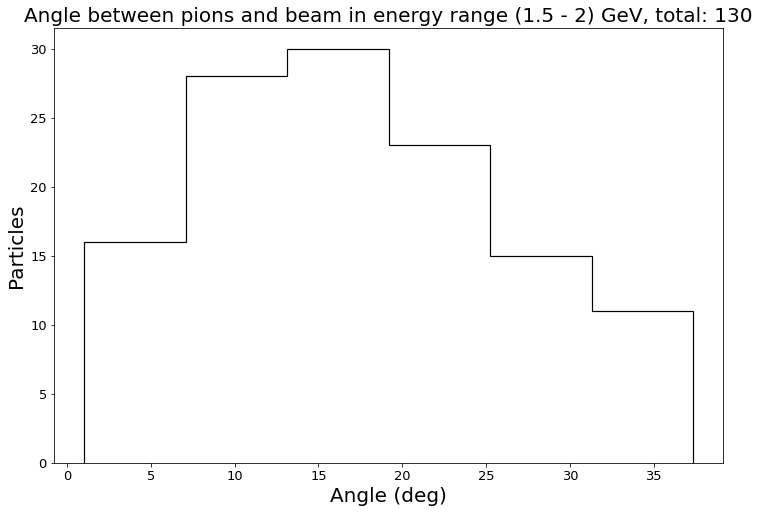

In [90]:
#FOR THE THETA ANGLE
#bin_size = 0.025


for i, (start, end) in enumerate(energy_ranges):
    plt.figure(figsize=(12, 8)) 
    #data_min = np.min(alphas[i])
    #data_max = np.max(alphas[i])
    #hist_min = -1
    #hist_max = 4

    #num_bins = int((hist_max - hist_min) / bin_size)
    #bin_edges = np.linspace(hist_min, hist_max, num_bins + 1)
    
    plt.hist(thetas[i], bins=autobins(thetas[i]), edgecolor='black', linewidth=1.2, histtype='step')
    plt.xlabel('Angle (deg)', fontsize=20)
    plt.ylabel('Particles', fontsize=20)
    plt.title(f'Angle between pions and beam in energy range ({start} - {end}) GeV, total: {len(alphas[i])}', fontsize=20)
    #plt.yscale('log')
    plt.xticks(fontsize=13) 
    plt.yticks(fontsize=13)
    plt.savefig(f"{folder}/analysisfiles/images/theta_angle_Erange_{start}_to_{end}_part1.png")
    plt.show()
    
#Theta angle
# Define histogram parameters
#data_min = np.min(theta)
#data_max = np.max(theta)
#hist_min = data_min - 0.5
#hist_max = data_max + 0.5

#num_bins = int((hist_max - hist_min) / bin_size)
#bin_edges = np.linspace(hist_min, hist_max, num_bins + 1)
#bin_edges = np.arange(0, 3, bin_size) 
    



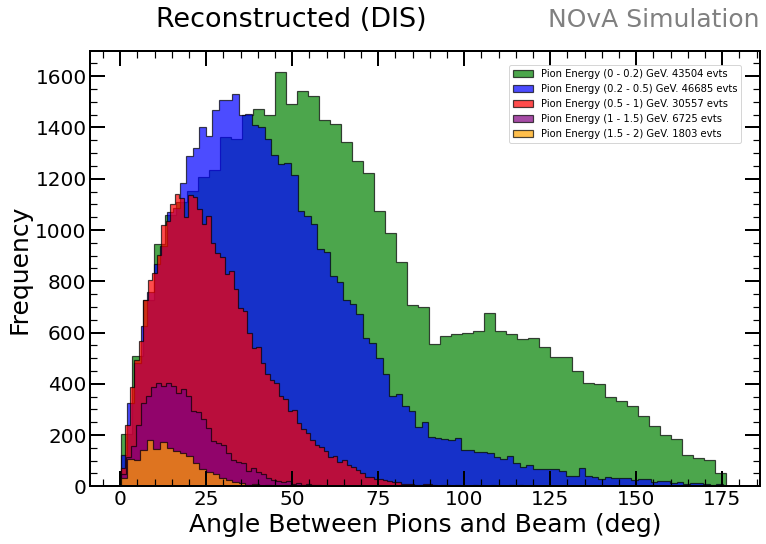

In [15]:
bin_size = 0.025
bin_edges = np.arange(0, 1, bin_size) 

# Define colors for each histogram
colors = ['green', 'blue', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12 , 8))
combined_subplot = plt.subplot(111)
#hist_min = -0.3
#hist_max = 3.5
#num_bins = int((hist_max - hist_min) / bin_size)
#bin_edges = np.linspace(hist_min, hist_max, num_bins + 1)

# Sort the histograms based on their size
#sorted_indices = sorted(range(len(thetas)), key=lambda i: len(thetas[i]), reverse=True)
sorted_indices=range(len(thetas))
# Plot individual normalized histograms with specified colors in sorted order
for i in sorted_indices:
    plt.hist(thetas[i], bins=autobins(thetas[i]), edgecolor='black', linewidth=1.2,histtype='stepfilled', alpha=0.7, label=f'Pion Energy ({energy_ranges[i][0]} - {energy_ranges[i][1]}) GeV. {len(alphas[i])} evts', color=colors[i])

plt.xlabel('Angle Between Pions and Beam (deg)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
plt.title(f'Reconstructed ({folder})',x=0.3,y=1.042, fontsize=27)
set_plot_style()
plt.legend(loc='upper right', bbox_to_anchor=(0.98, 0.98))
plt.savefig(f"{folder}/analysisfiles/images/theta_angles_combined_energy_ranges_part1.png")
plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/theta_angles_combined_energy_ranges_part1_{folder}.png', bbox_inches='tight')
plt.show()


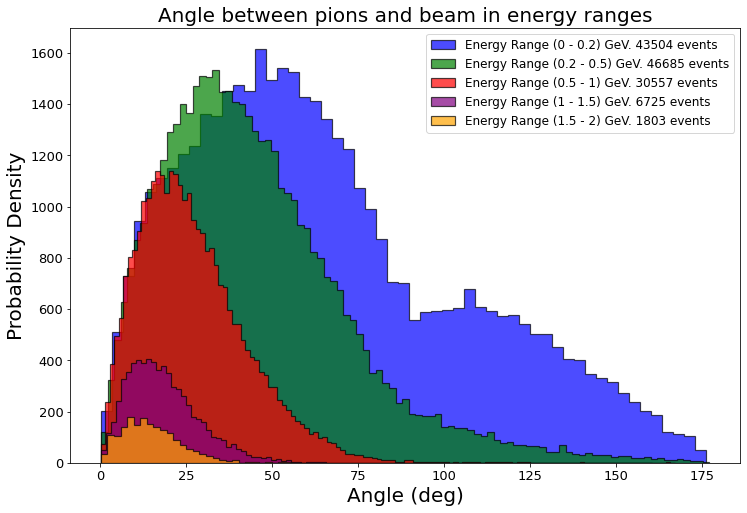

In [7]:
#bin_size = 0.025
#bin_edges = np.arange(0, 1, bin_size) 

# Define colors for each histogram
colors = ['green', 'blue', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12, 8))
combined_subplot = plt.subplot(111)
#hist_min = -1
#hist_max = 3
#num_bins = int((hist_max - hist_min) / bin_size)
#bin_edges = np.linspace(hist_min, hist_max, num_bins + 1)

# Plot individual normalized histograms with specified colors
for i, (start, end) in enumerate(energy_ranges):
    plt.hist(thetas[i], bins=autobins(thetas[i]), edgecolor='black', linewidth=1.2, histtype='stepfilled', alpha=0.7, label=f'Energy Range ({energy_ranges[i][0]} - {energy_ranges[i][1]}) GeV. {len(alphas[i])} events', color=colors[i])

plt.xlabel('Angle (deg)', fontsize=20)
plt.ylabel('Probability Density', fontsize=20)
plt.title(f'Angle between pions and beam in energy ranges', fontsize=20)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.legend(fontsize=12)
plt.savefig(f"{folder}/analysisfiles/images/theta_angles_combined_energy_ranges_part1.png")
plt.show()

In [4]:
folder='Res'

In [37]:
#now I would like to do the previous graph, but checking if the energy of the most energetic proton in the event,
#has an energy above or below 0.3 GeV
start_time = time.time()
#print(len(theta))
#print(len(alpha))
Lenopi=[]
#Lenopi=read_file2(folder,'analysisfiles/energinonpionsnt_part1')
Lenopi=read_file(folder,'analysisfiles/calenergies_perevent_nonpion_part1')
Lpdgnopi=[]
#Lpdgnopi=read_file2(folder,'analysisfiles/nonpionspdgnt_part1')
Lpdgnopi=read_file(folder,'analysisfiles/pdgs_perevent_nonpion_part1')
Lalpha=[]
Lalpha=read_file(folder,'analysisfiles/alpha_part1')
Ltheta=[]
Ltheta=read_file(folder,'analysisfiles/theta_part1')
Lcalepi=[]
Lcalepi=read_file(folder,'analysisfiles/calenergies_part1')

alphaminus = []
alphaplus=[]
thetaminus=[]
thetaplus=[]
epiminus=[]
epiplus=[]
protone=[]

for x, event in enumerate(Lpdgnopi):
    #ensure only one pion in event
    if len(Ltheta[x]) ==1:
        high_energy = 0
        for y, element in enumerate(event):
            #if proton
            if element == '2212':
                #protone.append(float(Lenopi[x][y])-0.938)
                #print(float(Lenopi[x][y]))
                protone.append(float(Lenopi[x][y]))
                if float(Lenopi[x][y]) > high_energy:
                    high_energy = float(Lenopi[x][y])
        #first avoid null proton events:
        if high_energy !=0:
            print(high_energy)
            #high_energy=high_energy-0.93
            print(high_energy)
            #here, the highest proton energy is already stored
            if high_energy < 0.3:
                print('es menor')
                #save the pi energy
                for i in range(len(Lcalepi[x])):
                    epiminus.append(float(Lcalepi[x][i]))
                    thetaminus.append(float(Ltheta[x][i])*(180 / math.pi))
                #now save the alpha angle
                l = len(Lalpha[x])
                num =int(l/3)-1
                mm=0
                for i in range(num):
                    mm=mm+3
                    vector1 = np.array([float(Lalpha[x][0]), float(Lalpha[x][1]), float(Lalpha[x][2])])
                    vector2 = np.array([float(Lalpha[x][mm]), float(Lalpha[x][mm+1]), float(Lalpha[x][mm+2])])
                    dot_product = np.dot(vector1, vector2)
                    magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
                    cosine_theta = dot_product / magnitude_product
                    #save the cosine
                    #alpha.append(cosine_theta)
                    angle_radians = np.arccos(cosine_theta)
                    degrees_angle = angle_radians * (180 / math.pi)
                    #alpha.append(angle_radians)
                    alphaminus.append(degrees_angle)  
            if high_energy > 0.3:
                print('es mayor')
                #save the pi energy
                for i in range(len(Lcalepi[x])):
                    epiplus.append(float(Lcalepi[x][i]))
                    thetaplus.append(float(Ltheta[x][i])*(180 / math.pi))
                #now save the alpha angle
                l = len(Lalpha[x])
                num =int(l/3)-1
                mm=0
                for i in range(num):
                    mm=mm+3
                    vector1 = np.array([float(Lalpha[x][0]), float(Lalpha[x][1]), float(Lalpha[x][2])])
                    vector2 = np.array([float(Lalpha[x][mm]), float(Lalpha[x][mm+1]), float(Lalpha[x][mm+2])])
                    dot_product = np.dot(vector1, vector2)
                    magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
                    cosine_theta = dot_product / magnitude_product
                    #save the cosine
                    #alpha.append(cosine_theta)
                    angle_radians = np.arccos(cosine_theta)
                    degrees_angle = angle_radians * (180 / math.pi)
                    #alpha.append(angle_radians)
                    alphaplus.append(degrees_angle) 

            
#after that, lets see how is the behavior of the cvn values with respect to ranges of energy.

energy_ranges = [(0, 0.2), (0.2, 0.5), (0.5, 1), (1, 1.5), (1.5, 2)]

# Initialize a list to store filtered angles for each energy range
alphasminus = [[] for _ in range(len(energy_ranges))] 
thetasminus = [[] for _ in range(len(energy_ranges))] 
alphasplus = [[] for _ in range(len(energy_ranges))] 
thetasplus = [[] for _ in range(len(energy_ranges))] 

#fill the less 0.3GeV proton lists
for j, event in enumerate(epiminus):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphasminus[i].append(alphaminus[j])
            thetasminus[i].append(thetaminus[j])

#now the other
for j, event in enumerate(epiplus):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphasplus[i].append(alphaplus[j])
            thetasplus[i].append(thetaplus[j])


end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

0.28112
0.28112
es menor
0.0930555
0.0930555
es menor
0.257398
0.257398
es menor
0.0602505
0.0602505
es menor
0.478286
0.478286
es mayor
0.10715
0.10715
es menor
0.548019
0.548019
es mayor
0.547259
0.547259
es mayor
0.164476
0.164476
es menor
0.599237
0.599237
es mayor
0.402986
0.402986
es mayor
0.0546642
0.0546642
es menor
0.444441
0.444441
es mayor
0.328709
0.328709
es mayor
0.268568
0.268568
es menor
0.0200804
0.0200804
es menor
0.261463
0.261463
es menor
0.161833
0.161833
es menor
0.388873
0.388873
es mayor
0.388671
0.388671
es mayor
0.134363
0.134363
es menor
0.888541
0.888541
es mayor
0.182333
0.182333
es menor
0.525018
0.525018
es mayor
0.640997
0.640997
es mayor
0.295359
0.295359
es menor
0.209488
0.209488
es menor
0.267057
0.267057
es menor
0.158561
0.158561
es menor
0.506341
0.506341
es mayor
0.357666
0.357666
es mayor
0.143313
0.143313
es menor
0.225897
0.225897
es menor
0.746657
0.746657
es mayor
0.203905
0.203905
es menor
0.217451
0.217451
es menor
0.608051
0.608051
es may

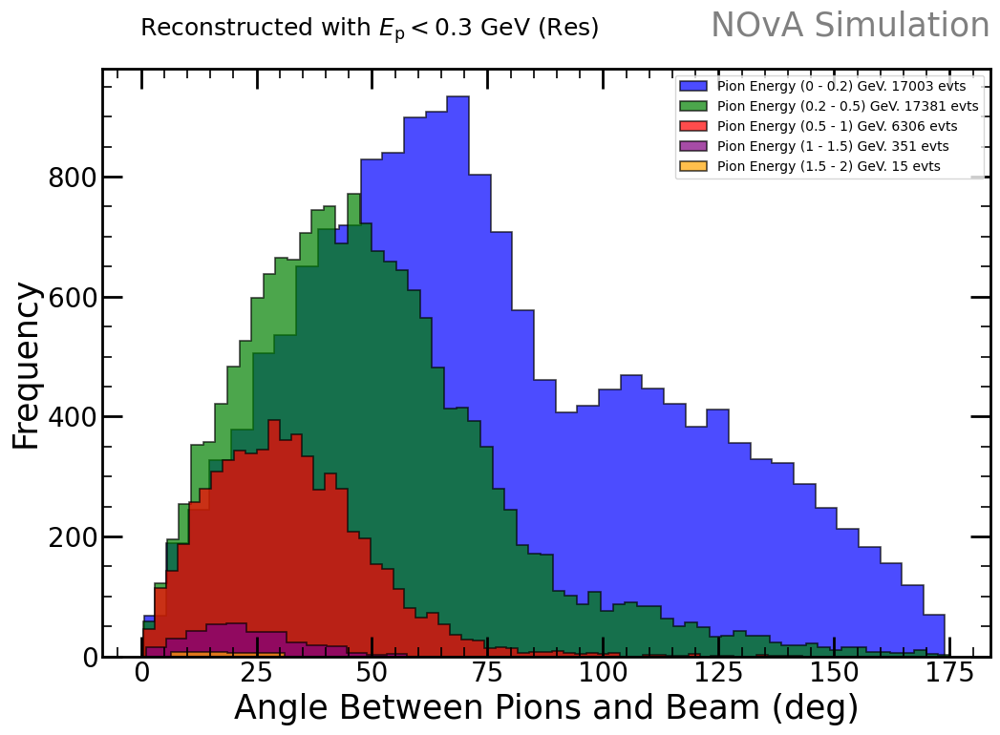

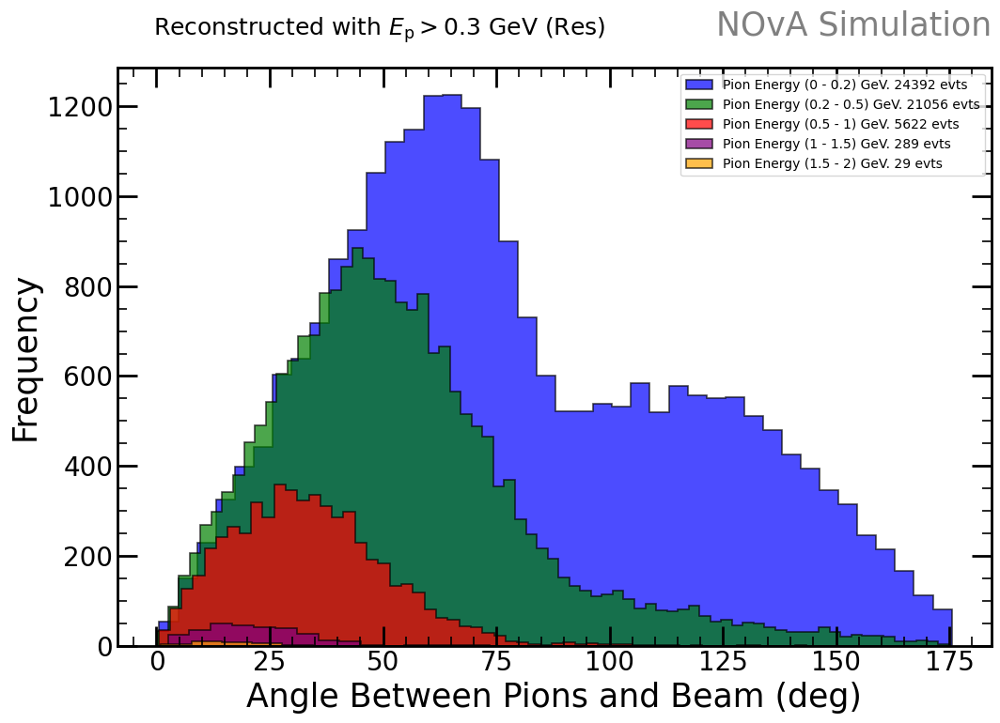

In [38]:
#plot the theta hists for the two energy regions of proton E
colors = ['blue', 'green', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12, 8))
combined_subplot = plt.subplot(111)

# Plot individual normalized histograms with specified colors
for i, (start, end) in enumerate(energy_ranges):
    plt.hist(thetasminus[i], bins=autobins(thetasminus[i]), edgecolor='black', linewidth=1.2, histtype='stepfilled', alpha=0.7, label=f'Pion Energy ({energy_ranges[i][0]} - {energy_ranges[i][1]}) GeV. {len(thetasminus[i])} evts', color=colors[i])

plt.xlabel('Angle Between Pions and Beam (deg)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
plt.title(fr'Reconstructed with $E_{{\rm p}}<0.3$ GeV ({folder})',x=0.3,y=1.042, fontsize=18)
set_plot_style()
plt.legend()
#plt.savefig(f"{folder}/analysisfiles/images/theta_angles_for_proton_energy_less_03_part1.png")
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/theta_angles_for_proton_energy_less_03_part1_{folder}.png', bbox_inches='tight')

plt.show()




#plot the theta hists for the two energy regions of proton E
colors = ['blue', 'green', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12, 8))
combined_subplot = plt.subplot(111)

# Plot individual normalized histograms with specified colors
for i, (start, end) in enumerate(energy_ranges):
    plt.hist(thetasplus[i], bins=autobins(thetasplus[i]), edgecolor='black', linewidth=1.2, histtype='stepfilled', alpha=0.7, label=f'Pion Energy ({energy_ranges[i][0]} - {energy_ranges[i][1]}) GeV. {len(thetasplus[i])} evts', color=colors[i])

plt.xlabel('Angle Between Pions and Beam (deg)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
set_plot_style()
plt.legend()
plt.title(fr'Reconstructed with $E_{{\rm p}}>0.3$ GeV ({folder})',x=0.3,y=1.042, fontsize=18)
#plt.savefig(f"{folder}/analysisfiles/images/theta_angles_for_proton_energy_more_03_part1.png")
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/theta_angles_for_proton_energy_more_03_part1_{folder}.png', bbox_inches='tight')

plt.show()

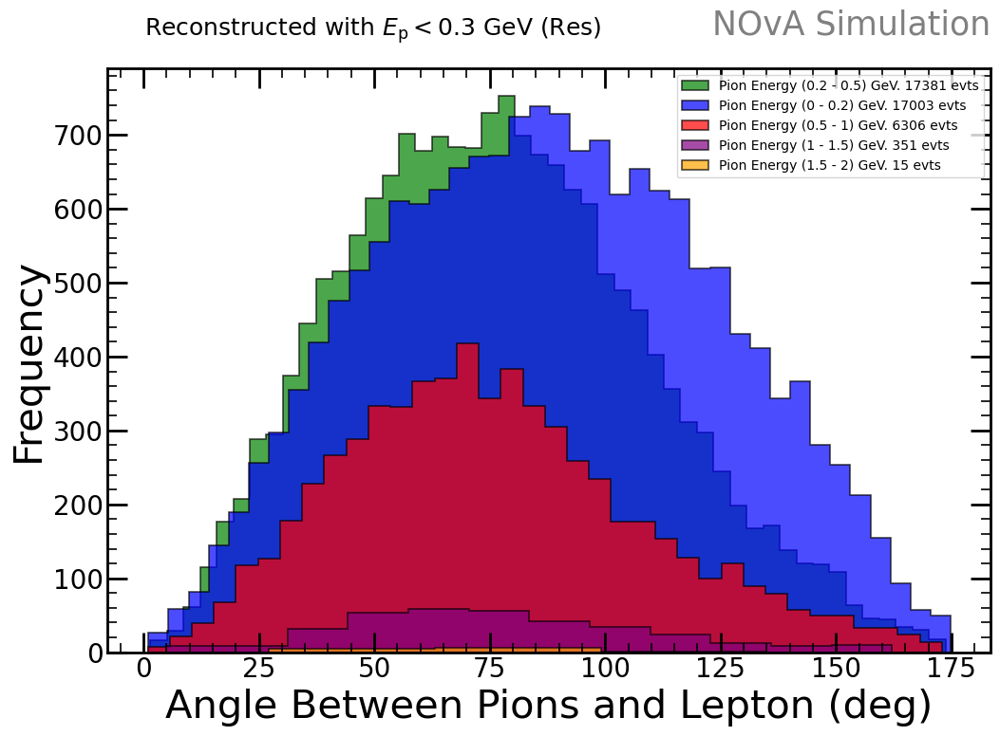

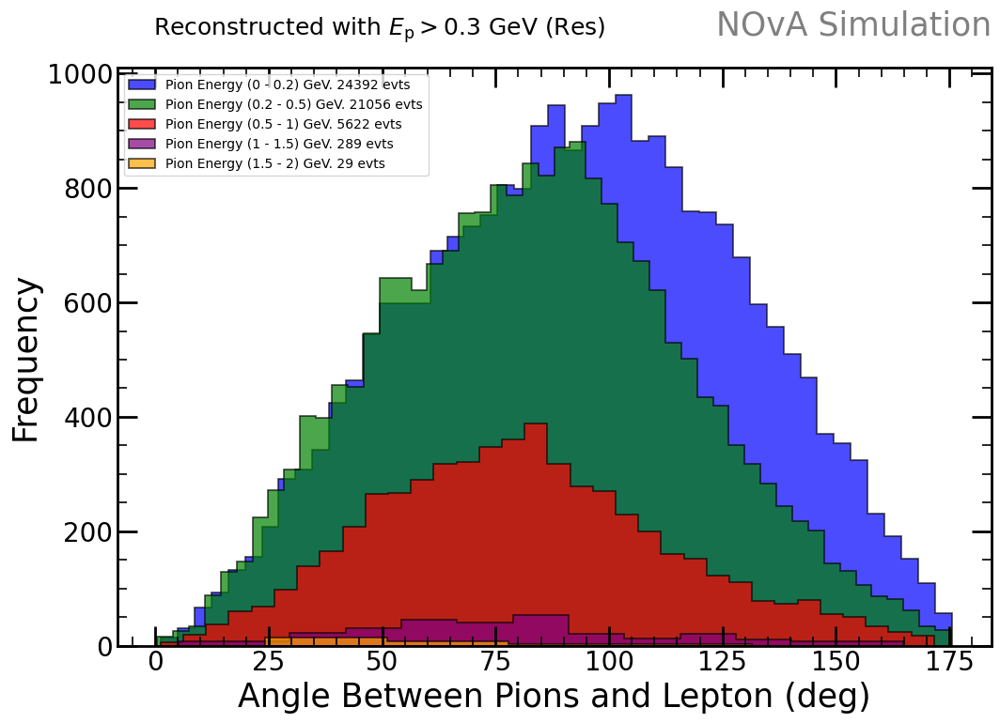

In [39]:
#plot the alpha hists for the two energy regions of proton E
colors = ['blue', 'green', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12, 8))
combined_subplot = plt.subplot(111)

# Sort the histograms based on their size
sorted_indices = sorted(range(len(alphasminus)), key=lambda i: len(alphasminus[i]), reverse=True)

# Plot individual normalized histograms with specified colors
for i in sorted_indices:
    plt.hist(alphasminus[i], bins=autobins(alphasminus[i]), edgecolor='black', linewidth=1.2, histtype='stepfilled', alpha=0.7, label=f'Pion Energy ({energy_ranges[i][0]} - {energy_ranges[i][1]}) GeV. {len(alphasminus[i])} evts', color=colors[i])

plt.xlabel('Angle Between Pions and Lepton (deg)', fontsize=30)
plt.ylabel('Frequency', fontsize=30)
set_plot_style()
plt.legend()
plt.title(fr'Reconstructed with $E_{{\rm p}}<0.3$ GeV ({folder})',x=0.3,y=1.042, fontsize=18)
#plt.savefig(f"{folder}/analysisfiles/images/alpha_angles_for_proton_energy_less_03_part1.png")
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/alpha_angles_for_proton_energy_less_03_part1_{folder}.png', bbox_inches='tight')

plt.show()




#plot the theta hists for the two energy regions of proton E
colors = ['blue', 'green', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(12, 8))
combined_subplot = plt.subplot(111)

# Sort the histograms based on their size
sorted_indices = sorted(range(len(alphasplus)), key=lambda i: len(alphasplus[i]), reverse=True)

# Plot individual normalized histograms with specified colors
for i in sorted_indices:
    plt.hist(alphasplus[i], bins=autobins(alphasplus[i]), edgecolor='black', linewidth=1.2, histtype='stepfilled', alpha=0.7, label=f'Pion Energy ({energy_ranges[i][0]} - {energy_ranges[i][1]}) GeV. {len(alphasplus[i])} evts', color=colors[i])

plt.xlabel('Angle Between Pions and Lepton (deg)', fontsize=25)
plt.ylabel('Frequency', fontsize=25)
set_plot_style()
plt.legend()
plt.title(fr'Reconstructed with $E_{{\rm p}}>0.3$ GeV ({folder})',x=0.3,y=1.042, fontsize=18)
#plt.savefig(f"{folder}/analysisfiles/images/alpha_angles_for_proton_energy_more_03_part1.png")
#plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/alpha_angles_for_proton_energy_more_03_part1_{folder}.png', bbox_inches='tight')

plt.show()

In [19]:
#here we check the dependence of number of reconstructed primary particles in event for events with only one pion. 
start_time = time.time()
Lalpha=[]
Lalpha=read_file(folder,'analysisfiles/alpha_part1')
Ltheta=[]
Ltheta=read_file(folder,'analysisfiles/theta_part1')
Lpdgsreco=[]
Lpdgsreco=read_file2(folder,'analysisfiles/allpdgNT_part1')

alphas_per_PP = [[] for _ in range(7)] 
thetas_per_PP = [[] for _ in range(7)] 


for i, event in enumerate(Lpdgsreco):
    npions=0
    for element in event:
        if element == '211' or element == '-211':
            npions=npions +1
    if npions == 1:
        length=len(event)
        if length < 7:
            thetas_per_PP[length].append(float(Ltheta[i][0]))
            
            vector1 = np.array([float(Lalpha[i][0]), float(Lalpha[i][1]), float(Lalpha[i][2])])
            vector2 = np.array([float(Lalpha[i][3]), float(Lalpha[i][4]), float(Lalpha[i][5])])
            dot_product = np.dot(vector1, vector2)
            magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
            cosine_theta = dot_product / magnitude_product
            #save the cosine
            #alpha.append(cosine_theta)
            angle_radians = np.arccos(cosine_theta)
            degrees_angle = angle_radians * (180 / math.pi)
            #alpha.append(angle_radians)
            alphas_per_PP[length].append(degrees_angle) 
            
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 1.7185335159301758 seconds


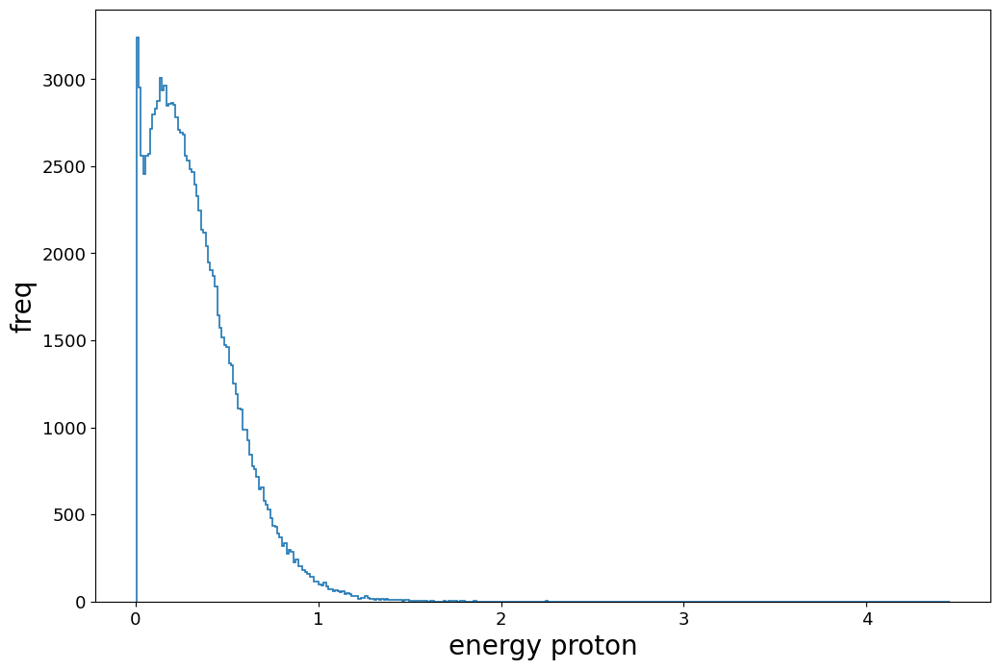

In [40]:
plt.figure(figsize=(12, 8))  
plt.hist(protone, bins=autobins(protone), linewidth=1.2, histtype='step')
plt.xlabel('energy proton', fontsize=20)
plt.ylabel('freq', fontsize=20)
#plt.title(f'Angle between pions and beam in energy range ({start} - {end}) GeV, total: {len(alphas[i])}', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
#plt.xlim(0,1)
#plt.savefig(f"{folder}/analysisfiles/images/theta_angle_Erange_{start}_to_{end}_part1.png")
plt.show()

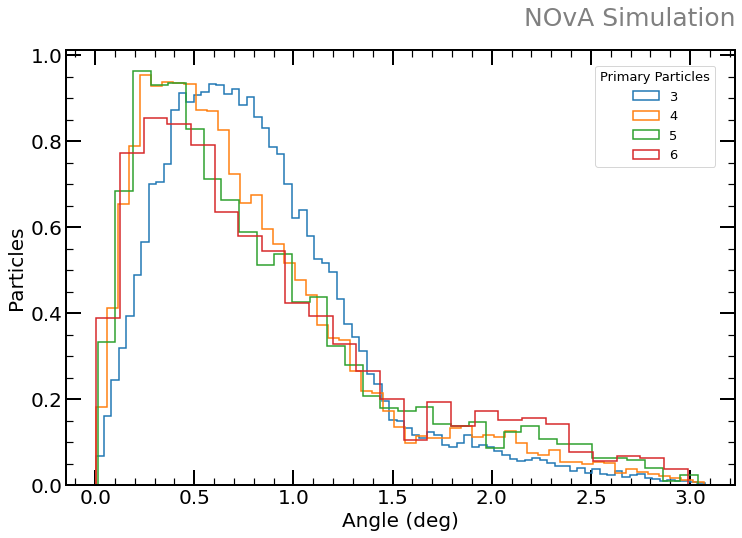

In [28]:
# colors = ['green', 'blue', 'red', 'purple', 'orange']
plt.figure(figsize=(12, 8))  
for i in range(len(thetas_per_PP)):
    if len(thetas_per_PP[i]) !=0:
        plt.hist(thetas_per_PP[i], bins=autobins(thetas_per_PP[i]), linewidth=1.5, histtype='step',label=f'{i}', density=True)
plt.xlabel('Angle (deg)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
#plt.title(f'Angle between pions and beam in energy range ({start} - {end}) GeV, total: {len(alphas[i])}', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
set_plot_style()
plt.legend(title='Primary Particles',fontsize=13, title_fontsize=13,loc='upper right', bbox_to_anchor=(0.98, 0.98))
#plt.savefig(f"{folder}/analysisfiles/images/theta_angle_Erange_{start}_to_{end}_part1.png")
plt.show()

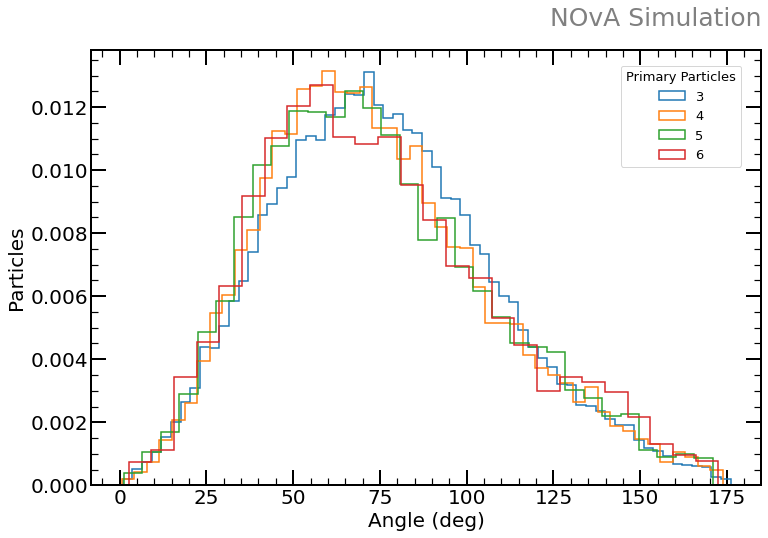

In [30]:
plt.figure(figsize=(12, 8))  
for i in range(len(alphas_per_PP)):
    if len(alphas_per_PP[i]) !=0:
        plt.hist(alphas_per_PP[i], bins=autobins(alphas_per_PP[i]), linewidth=1.5, histtype='step',label=f'{i}', density=True)
plt.xlabel('Angle (deg)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
#plt.title(f'Angle between pions and beam in energy range ({start} - {end}) GeV, total: {len(alphas[i])}', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
set_plot_style()
plt.legend(title='Primary Particles',fontsize=13, title_fontsize=13,loc='upper right', bbox_to_anchor=(0.98, 0.98))
#plt.savefig(f"{folder}/analysisfiles/images/theta_angle_Erange_{start}_to_{end}_part1.png")
plt.show()

In [39]:
#also check teh relation between angle behavior and number of pions


start_time = time.time()
Lalpha=[]
Lalpha=read_file(folder,'analysisfiles/alpha_part1')
Ltheta=[]
Ltheta=read_file(folder,'analysisfiles/theta_part1')
Lpdgsreco=[]
Lpdgsreco=read_file2(folder,'analysisfiles/allpdgReco_part1')

alphas_per_PPion = [[] for _ in range(7)] 
thetas_per_PPion = [[] for _ in range(7)] 


for i, event in enumerate(Lpdgsreco):
    npions=0
    for element in event:
        if element == '211' or element == '-211':
            npions=npions +1
#     length=len(event)
#     if length < 7:
#     print(npions)
#     print(Ltheta[i])
    if len(Ltheta[i])==npions:
        for n in range(npions):
            thetas_per_PPion[npions].append(float(Ltheta[i][n]))

#         vector1 = np.array([float(Lalpha[i][0]), float(Lalpha[i][1]), float(Lalpha[i][2])])
#         vector2 = np.array([float(Lalpha[i][3]), float(Lalpha[i][4]), float(Lalpha[i][5])])
#         dot_product = np.dot(vector1, vector2)
#         magnitude_product = np.linalg.norm(vector1) * np.linalg.norm(vector2)
#         cosine_theta = dot_product / magnitude_product
        #save the cosine
        #alpha.append(cosine_theta)
#         angle_radians = np.arccos(cosine_theta)
#         degrees_angle = angle_radians * (180 / math.pi)
        #alpha.append(angle_radians)
#         alphas_per_PP[length].append(degrees_angle) 
            
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.8611700534820557 seconds


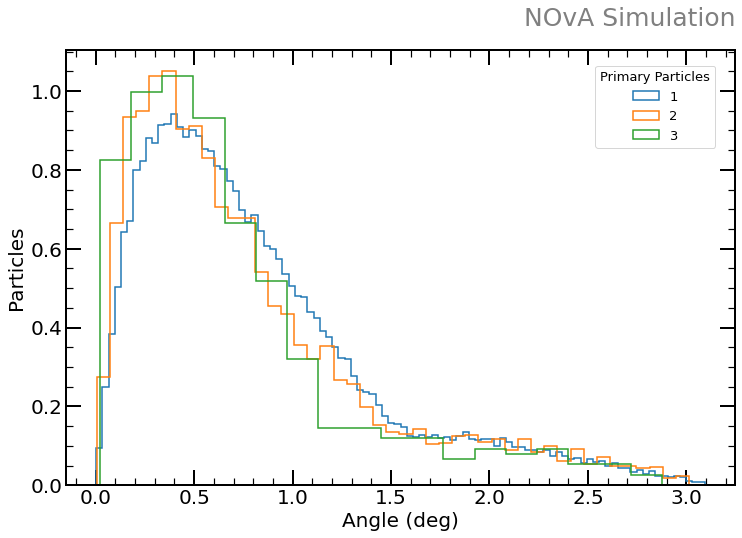

In [43]:
plt.figure(figsize=(12, 8))  
for i in range(len(thetas_per_PPion)):
    if len(thetas_per_PPion[i]) !=0 and i!=4:
        plt.hist(thetas_per_PPion[i], bins=autobins(thetas_per_PPion[i]), linewidth=1.5, histtype='step',label=f'{i}', density=True)
plt.xlabel('Angle (deg)', fontsize=20)
plt.ylabel('Particles', fontsize=20)
#plt.title(f'Angle between pions and beam in energy range ({start} - {end}) GeV, total: {len(alphas[i])}', fontsize=20)
#plt.yscale('log')
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
set_plot_style()
plt.legend(title='Primary Particles',fontsize=13, title_fontsize=13,loc='upper right', bbox_to_anchor=(0.98, 0.98))
#plt.savefig(f"{folder}/analysisfiles/images/theta_angle_Erange_{start}_to_{end}_part1.png")
plt.show()

In [63]:
#Check the plot angle vs energy for the energy regions already defined
start_time = time.time()

temp=[]
calenergies=[]
temp=read_file(folder,'analysisfiles/calenergies_part1')
calenergies = [float(element) for sublist in temp for element in sublist] 

alphaminus = []
alphaplus=[]
thetaminus=[]
thetaplus=[]
epiminus=[]
epiplus=[]

            
#after that, lets see how is the behavior of the cvn values with respect to ranges of energy.

energy_ranges = [(0, 0.2), (0.2, 0.5), (0.5, 1), (1, 1.5), (1.5, 2)]

# Initialize a list to store filtered angles for each energy range
alphasE = [[] for _ in range(len(energy_ranges))] 
thetasE = [[] for _ in range(len(energy_ranges))] 
calenergiesE = [[] for _ in range(len(energy_ranges))] 

#fill the less 0.3GeV proton lists
for j, event in enumerate(calenergies):
    for i, (start, end) in enumerate(energy_ranges):
        if start <= event < end:
            alphasE[i].append(alpha[j])
            thetasE[i].append(theta[j])
            calenergiesE[i].append(calenergies[j])

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.898745059967041 seconds


In [106]:
temp=[]
hits=[]
temp=read_file(folder,'analysisfiles/numhits_part1')
hits = [float(element) for sublist in temp for element in sublist] 

temp2=[]
trues=[]
temp2=read_file(folder,'analysisfiles/energiesNT_part1')
trues = [float(element) for sublist in temp2 for element in sublist] 

temp3=[]
recos=[]
temp3=read_file(folder,'analysisfiles/calenergies_part1')
recos = [float(element) for sublist in temp3 for element in sublist] 

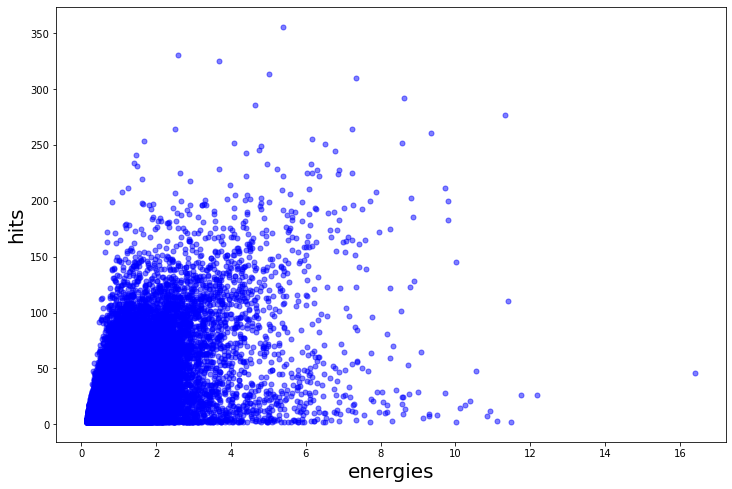

In [7]:
plt.figure(figsize=(12, 8)) 
plt.scatter(trues, hits, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('energies',fontsize=20)
plt.ylabel('hits',fontsize=20)
# plt.title(f'Pion energy vs angle between pions and lepton, for energy range ({start} - {end}) GeV',fontsize=20)
# plt.xticks(fontsize=13) 
# plt.yticks(fontsize=13)
#plt.xlim(0,4)
# plt.savefig(f"{folder}/analysisfiles/images/scatter_pion_energy_angle_alpha_energy_range_{start}_{end}_part1.png")
plt.show()

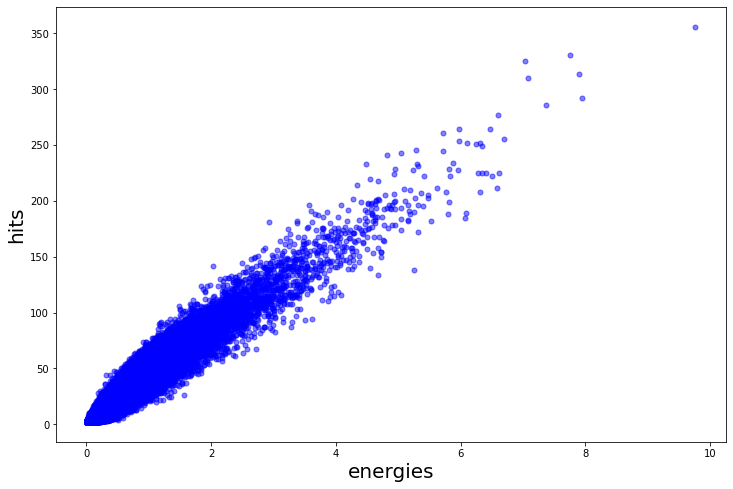

In [12]:
plt.figure(figsize=(12, 8)) 
plt.scatter(recos, hits, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('energies',fontsize=20)
plt.ylabel('hits',fontsize=20)
# plt.title(f'Pion energy vs angle between pions and lepton, for energy range ({start} - {end}) GeV',fontsize=20)
# plt.xticks(fontsize=13) 
# plt.yticks(fontsize=13)
#plt.xlim(0,4)
# plt.savefig(f"{folder}/analysisfiles/images/scatter_pion_energy_angle_alpha_energy_range_{start}_{end}_part1.png")
plt.show()

In [107]:
temp=[]
length=[]
temp=read_file(folder,'analysisfiles/length_part1')
length = [float(element) for sublist in temp for element in sublist] 

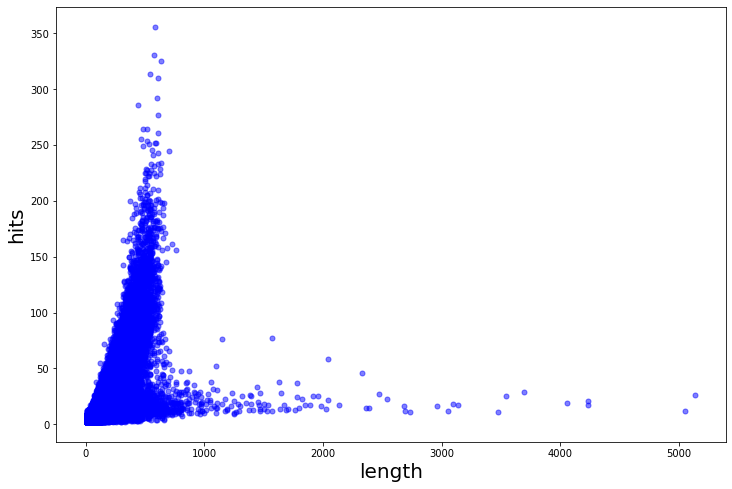

In [9]:
plt.figure(figsize=(12, 8)) 
plt.scatter(length, hits, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('length',fontsize=20)
plt.ylabel('hits',fontsize=20)
# plt.title(f'Pion energy vs angle between pions and lepton, for energy range ({start} - {end}) GeV',fontsize=20)
# plt.xticks(fontsize=13) 
# plt.yticks(fontsize=13)
#plt.xlim(0,4)
# plt.savefig(f"{folder}/analysisfiles/images/scatter_pion_energy_angle_alpha_energy_range_{start}_{end}_part1.png")
plt.show()

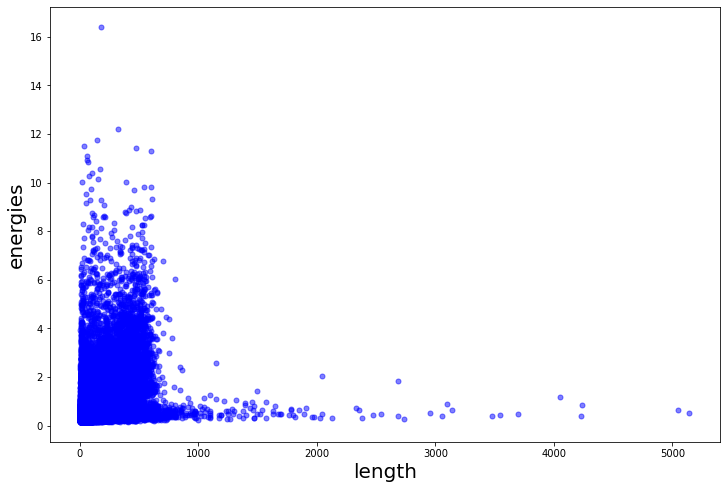

In [10]:
plt.figure(figsize=(12, 8)) 
plt.scatter(length, trues, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('length',fontsize=20)
plt.ylabel('energies',fontsize=20)
# plt.title(f'Pion energy vs angle between pions and lepton, for energy range ({start} - {end}) GeV',fontsize=20)
# plt.xticks(fontsize=13) 
# plt.yticks(fontsize=13)
#plt.xlim(0,4)
# plt.savefig(f"{folder}/analysisfiles/images/scatter_pion_energy_angle_alpha_energy_range_{start}_{end}_part1.png")
plt.show()

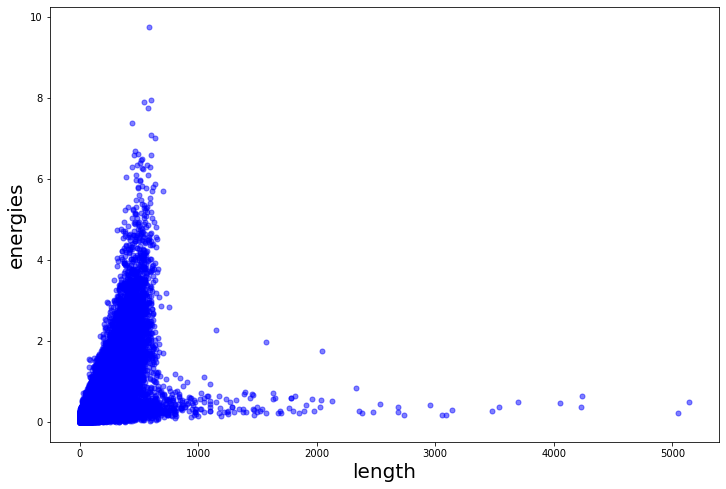

In [13]:
plt.figure(figsize=(12, 8)) 
plt.scatter(length, recos, color='blue', marker='.', s=100, alpha=0.5)
plt.xlabel('length',fontsize=20)
plt.ylabel('energies',fontsize=20)
# plt.title(f'Pion energy vs angle between pions and lepton, for energy range ({start} - {end}) GeV',fontsize=20)
# plt.xticks(fontsize=13) 
# plt.yticks(fontsize=13)
#plt.xlim(0,4)
# plt.savefig(f"{folder}/analysisfiles/images/scatter_pion_energy_angle_alpha_energy_range_{start}_{end}_part1.png")
plt.show()

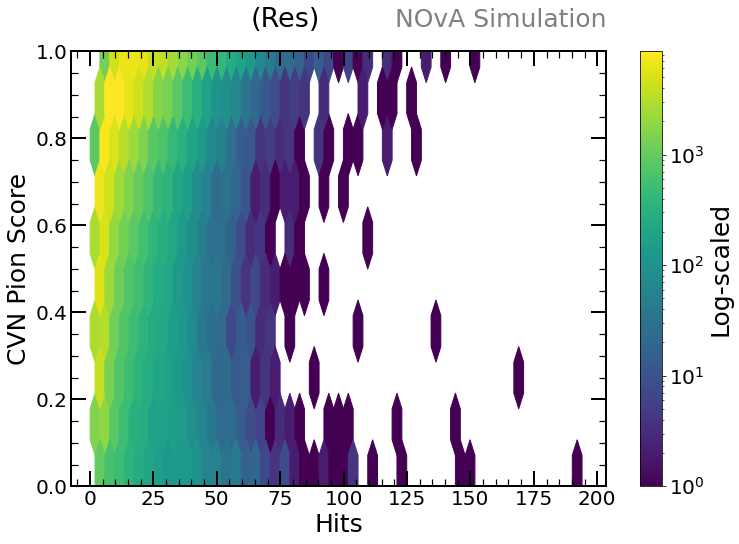

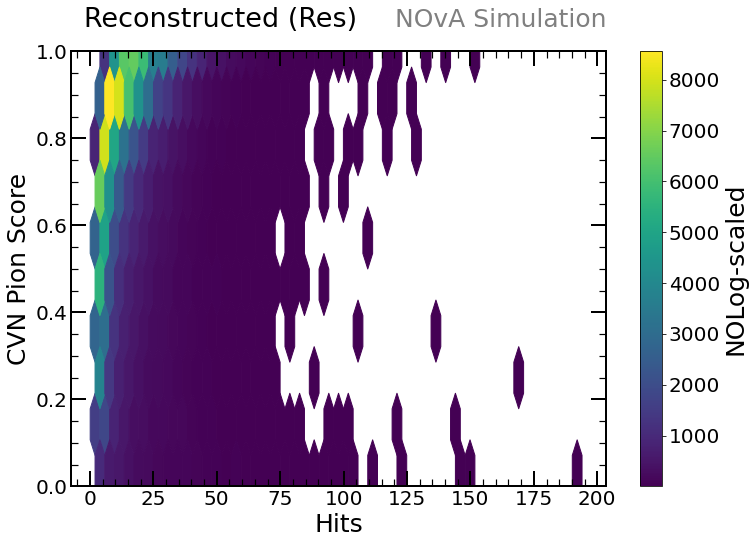

In [108]:
cvn_hb = np.array(cvn)
hits_hb = np.array(hits)

plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(hits_hb, cvn_hb, gridsize=50, cmap='viridis', mincnt=1, norm=mcolors.LogNorm())

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Log-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Hits', fontsize=25)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.savefig(f"{folder}/analysisfiles/images/cvn_vs_hits_logscaled_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()


plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(hits_hb, cvn_hb, gridsize=50, cmap='viridis', mincnt=1)

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('NOLog-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Hits', fontsize=25)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'Reconstructed ({folder})', x=0.28,y=1.042,fontsize=27)
set_plot_style()
plt.ylim(0, 1)
plt.savefig(f"{folder}/analysisfiles/images/cvn_vs_hits_normal_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()

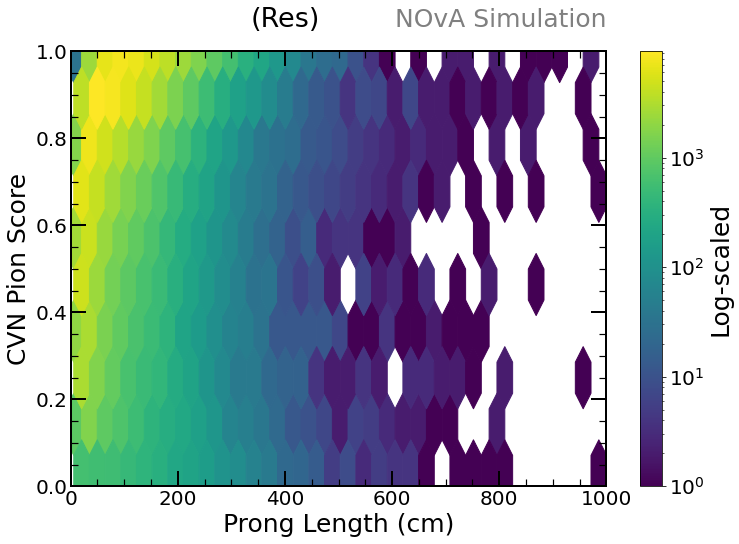

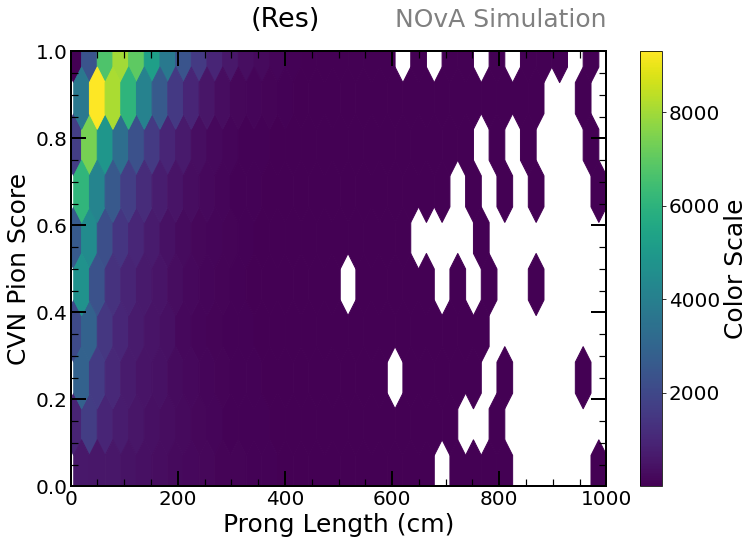

In [109]:
cvn_hb = np.array(cvn)
length_hb = np.array(length)

plt.figure(figsize=(12, 8))

# Create a mask for cvn values >= 0
mask = length_hb <= 1500

# Apply the mask to all arrays
cvn_hb_mask = cvn_hb[mask]
length_hb_mask = length_hb[mask]



# Create a hexbin plot with sampled data
hb = plt.hexbin(length_hb_mask, cvn_hb_mask, gridsize=50, cmap='viridis', mincnt=1, norm=mcolors.LogNorm())

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Log-scaled', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Prong Length (cm)', fontsize=25)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.xlim(0, 1000)
plt.ylim(0,1)
plt.savefig(f"{folder}/analysisfiles/images/cvn_vs_length_normal_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()


plt.figure(figsize=(12, 8))

# Create a hexbin plot with sampled data
hb = plt.hexbin(length_hb_mask, cvn_hb_mask, gridsize=50, cmap='viridis', mincnt=1)

# Add color bar
cb = plt.colorbar(hb)
cb.set_label('Color Scale', fontsize=25)
cb.ax.tick_params(labelsize=20) 


# Set labels and title
plt.xlabel('Prong Length (cm)', fontsize=25)
plt.ylabel('CVN Pion Score', fontsize=25)
plt.title(f'({folder})', x=0.4,y=1.042,fontsize=27)
set_plot_style()
plt.xlim(0, 1000)
plt.ylim(0,1)
plt.savefig(f"{folder}/analysisfiles/images/cvn_vs_length_normal_{folder}_part1.png", bbox_inches='tight')
# plt.savefig(f'/Users/maldi/Documents/NOvA/FreezingMoonV/Chap5/scatter_E_theta_part1_{folder}.png', bbox_inches='tight')

plt.show()

END OF THE NOTEBOOK


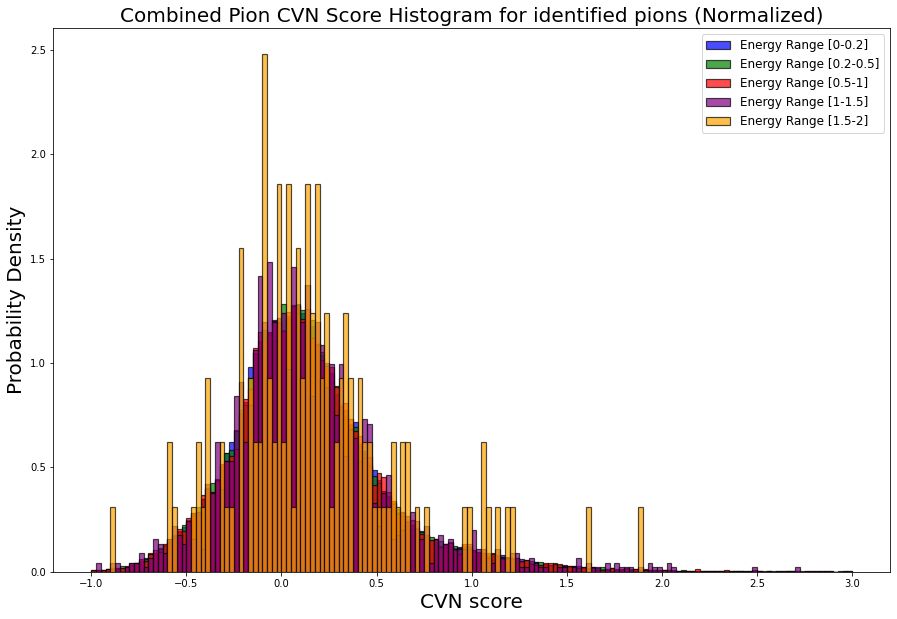

In [9]:
bin_size = 0.025
bin_edges = np.arange(0, 1, bin_size) 

# Define colors for each histogram
colors = ['blue', 'green', 'red', 'purple', 'orange']

# Create a combined histogram subplot
plt.figure(figsize=(15, 10))
combined_subplot = plt.subplot(111)
hist_min = -1
hist_max = 3
num_bins = int((hist_max - hist_min) / bin_size)
bin_edges = np.linspace(hist_min, hist_max, num_bins + 1)

# Plot individual normalized histograms with specified colors
for i, (start, end) in enumerate(energy_ranges):
    plt.hist(alphas[i], bins=bin_edges, edgecolor='black', linewidth=1.2, alpha=0.7, label=f'Energy Range [{start}-{end}]', color=colors[i], density = True)

plt.xlabel('CVN score', fontsize=20)
plt.ylabel('Probability Density', fontsize=20)
plt.title(f'Combined Pion CVN Score Histogram for identified pions (Normalized)', fontsize=20)
plt.legend(fontsize=12)
#plt.savefig(f"{folder}/analysisfiles/images/cvn_combined_normalized.png")
plt.show()

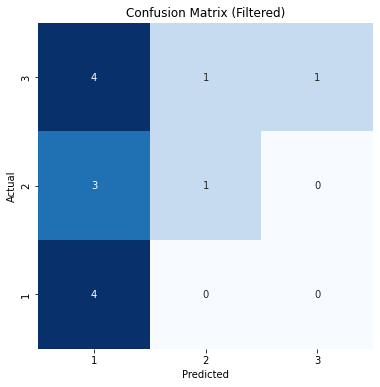

In [56]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Given lists
list1 = [1, 2, 3, 3, 2, 1, 3, 3, 1, 2, 1, 2, 3, 3]
list2 = [1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 3, 1]

# Create the confusion matrix
confusion = confusion_matrix(list1, list2)

# Filter out rows and columns for numbers 1, 2, and 3
relevant_indices = [0, 1, 2]
confusion_relevant = confusion[relevant_indices][:, relevant_indices]

# Plot the updated matrix using Seaborn
plt.figure(figsize=(6, 6))
sns.heatmap(confusion_relevant, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["1", "2", "3"],
            yticklabels=["1", "2", "3"])

plt.gca().invert_yaxis()
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Filtered)")
plt.show()


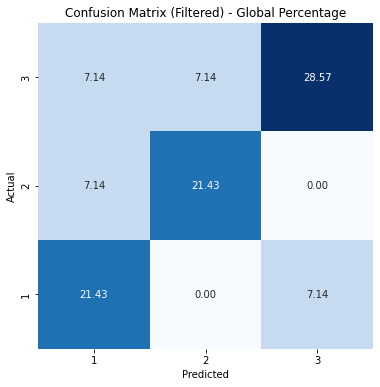

In [33]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Given lists
list1 = [1, 2, 3, 3, 2, 1, 3, 3, 1, 2, 1, 2, 3, 3]
list2 = [1, 2, 3, 3, 2, 3, 2, 3, 1, 1, 1, 2, 3, 1]

# Create the confusion matrix
confusion = confusion_matrix(list1, list2)

# Filter out rows and columns for numbers 1, 2, and 3
relevant_indices = [0, 1, 2]
confusion_relevant = confusion[relevant_indices][:, relevant_indices]

# Calculate the global percentage for each entry
total_samples = np.sum(confusion_relevant)
confusion_percentage = confusion_relevant / total_samples * 100

# Plot the updated matrix using Seaborn
plt.figure(figsize=(6, 6))
sns.heatmap(confusion_percentage, annot=True, fmt=".2f", cmap="Blues", cbar=False,
            xticklabels=["1", "2", "3"],
            yticklabels=["1", "2", "3"])
plt.gca().invert_yaxis()
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Filtered) - Global Percentage")
plt.show()

In [6]:
#LOAD THE INFORMATION TO
#Matching simulated pions with reco pions and extracting their properties

start_time = time.time()

# Load the data from the text file
pdgNT = open(f"{folder}/pdgntvars_total.txt", "r") 
pdgReco = open(f"{folder}/pdgpngvars_total.txt", "r")
trkIDNT = open(f"{folder}/trkNTvars_total.txt", "r")
trkIDReco = open(f"{folder}/trkvars_total.txt", "r")
ecalReco = open(f"{folder}/calenergiesvars_total.txt", "r")
cvn = open(f"{folder}/cvnvars_total.txt", "r")
run = open(f"{folder}/runvars_total.txt", "r")
coorvtxReco = open(f"{folder}/coorstartvars_total.txt", "r")
numpivtxNT = open(f"{folder}/numpivtxvarsNT_total.txt", "r")
energiesALLNT = open(f"{folder}/energiesALLvarsNT_total.txt", "r")
nue = open(f"{folder}/nuevarsNT_total.txt", "r")
thetaNT = open(f"{folder}/thetavarsNT_total.txt", "r")
alphaNT = open(f"{folder}/alphavarsNT_total.txt", "r")
hitsprong = open(f"{folder}/pronghitshvars_total.txt", "r")
dirprong = open(f"{folder}/dirprongtvars_total.txt", "r")
lenprong = open(f"{folder}/pronglengthvars_total.txt", "r")


ALLRowspdgNT = csv.reader(pdgNT, delimiter=' ')
ALLRowspdgReco = csv.reader(pdgReco , delimiter=' ')
ALLRowstrkIDNT = csv.reader(trkIDNT , delimiter=' ')
ALLRowstrkIDReco = csv.reader(trkIDReco , delimiter=' ')
ALLRowsecalReco = csv.reader(ecalReco , delimiter=' ')
ALLRowscvn = csv.reader(cvn , delimiter=' ')
ALLRowsrun = csv.reader(run , delimiter=' ')
ALLRowscoorReco = csv.reader(coorvtxReco , delimiter=' ')
ALLRowsnumpivtxNT = csv.reader(numpivtxNT , delimiter=' ')
ALLRowsenergiesALLNT = csv.reader(energiesALLNT , delimiter=' ')
ALLRowsnue = csv.reader(nue , delimiter=' ')
ALLRowsthetaNT = csv.reader(thetaNT , delimiter=' ')
ALLRowsalphaNT = csv.reader(alphaNT , delimiter=' ')
ALLRowshitsprong = csv.reader(hitsprong , delimiter=' ')
ALLRowsdirprong = csv.reader(dirprong , delimiter=' ')
ALLRowslenprong = csv.reader(lenprong , delimiter=' ')

LpdgNT = [row for row in ALLRowspdgNT]
LpdgReco = [row for row in ALLRowspdgReco]
LtrkIDNT = [row for row in ALLRowstrkIDNT]
LtrkIDReco = [row for row in ALLRowstrkIDReco]
LecalReco = [row for row in ALLRowsecalReco]
Lcvn = [row for row in ALLRowscvn]
Lrun = [row for row in ALLRowsrun]
LcoorReco = [row for row in ALLRowscoorReco]
LnumpivtxNT = [row for row in ALLRowsnumpivtxNT]
LeALLNT = [row for row in ALLRowsenergiesALLNT]
Lnue = [row for row in ALLRowsnue]
LthetaNT = [row for row in ALLRowsthetaNT]
LalphaNT = [row for row in ALLRowsalphaNT]
Lhitsprong = [row for row in ALLRowshitsprong]
Ldirprong = [row for row in ALLRowsdirprong]
Llenprong = [row for row in ALLRowslenprong]

    
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 22.177547454833984 seconds
